In [4]:
from IPython.core.display import HTML
css_file = './custom.css'
HTML(open(css_file, "r").read())

## Variable Coefficients for the Comparison with CD

# Variations in Pseudo Spectral
    # Runge Kutta 5th (5(4)) Order
        
        J. R. Dormand, P. J. Prince, “A family of embedded Runge-Kutta formulae”, Journal of Computational and Applied Mathematics, Vol. 6, No. 1, pp. 19-26, 1980.
    # Radau Implicit Runge-Kutta method
        
        E. Hairer, G. Wanner, “Solving Ordinary Differential Equations II: Stiff and Differential-Algebraic Problems”, Sec. IV.8
    # LSODA 
            
            L. Petzold, “Automatic selection of methods for solving stiff and nonstiff systems of ordinary differential equations”, SIAM Journal on Scientific and Statistical Computing, Vol. 4, No. 1, pp. 136-148, 1983
  

$$ \frac {\partial U}{\partial t} = a\frac {\partial^2 U}{\partial x^2} + b\frac {\partial U}{\partial x} + c*U + d $$

$$ IC: U(x, 0) = \exp(-x**2) $$ 
$$ BC: Periodic: U(0, t) = U(1, t) $$
$$                 \frac {\partial U(0, t)}{\partial x} =  \frac {\partial U(1, t)}{\partial t} $$

In [5]:
from scipy.linalg import solve
# Define the equation parameters
from scipy.special import erfc
import pandas as pd
import numpy as np
from scipy import integrate as inte
from numpy import exp
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = [10, 5]
from scipy.optimize import fsolve
from scipy.integrate import solve_ivp, Radau
fft = np.fft.fft
ifft = np.fft.ifft

In [12]:
def testABCD_PS(a, b, c, d, nx, nt):

    L = np.pi
    T = 4.0


    x = np.linspace(-L, L, nx+1)
    t = np.linspace(0, T, nt+1)
    
    u = np.exp(-x**2)#np.sin(np.pi*xin)
    U_CDI = np.zeros((nx+1, nt+1))

    error_2norm_CDI_PSBDF = np.zeros(nt+1)
    error_2norm_CDI_PSR = np.zeros(nt+1) 
    error_2norm_CDI_PSRK45 = np.zeros(nt+1)
    error_2norm_PSR_PSRK45 = np.zeros(nt+1)
    error_2norm_PSBDF_PSRK45 = np.zeros(nt+1)
    error_2norm_PSBDF_PSR = np.zeros(nt+1)
    error_2norm_CDI_PSLSODA = np.zeros(nt+1)
    error_2norm_PSR_PSLSODA = np.zeros(nt+1)
    # Discretization of space and time
    dx = 2*L/(nx+1)
    # dt = 0.1*dx**2/D#T/(nt-1)
    # dx = L/(nx+1)
    dt = T/(nt+1)


    #plt.figure()
    #plt.plot(u, label='Initial')
    def numerical_scheme_CDI(u_CDI, a, b, c, d, dx, dt):
        alpha = a*dt/dx
        beta = b*dt/dx**2
        nx = len(u_CDI)-1
        
        A = np.zeros((nx+1, nx+1))
        bi = d*dt+u_CDI;
        for j in range(1, len(u_CDI)-1):

            A[j, j-1] = -(beta[j]-alpha[j]/2)
            A[j, j] = 1+2*beta[j]-c[j]*dt
            A[j, j+1] = -(beta[j]+alpha[j]/2)

        # Applying first order Periodic Boundary Condition
        A[0, 0]=(1+2*beta[0])-c[0]*dt;
        A[0, 1]= (-alpha[0]/2-beta[0])
        A[0, nx]= (alpha[0]/2-beta[0])    
        

        A[nx, 0]= (-alpha[nx]/2-beta[nx]) ;
        A[nx, nx-1]= (alpha[nx]/2 - beta[nx])
        A[nx, nx]= 1+2*beta[nx] -c[nx]*dt   
        

        # Applying second order periodic boundary conditions
        # bt = d*dt+u_CDI;
        # kk = np.zeros(2)
        # bi = [*kk, *bt[2:]]
        # print(np.shape(bi))
        # A[0, 0]=0;
        # A[0, 1]= 1
        # A[0, nx-1]= -1
        # A[0, nx]=0

        # A[1, 0] = -1
        # A[1, 1] = 0
        # A[1, 2] = 1
        # A[1, nx-2] = 1
        # A[1, nx-1] = 0 
        # A[1, nx] = -1

        
        # # Boundary condition
        # A[0, 0] = -3.
        # A[0, 1] = 4.
        # A[0, 2] = -1.
        # bi[0] = 0.

        # A[nx, nx] = 3.
        # A[nx, nx-1] = -4.
        # A[nx, nx-2] = 1.
        # bi[nx] = 0.


        # A[0,0] = 1.0
        # # A[N,N] = 1.0

        # bi[0] = l
        # bi[N] = r


        u_CDI = solve(A, bi)

        return u_CDI



    # Apply the numerical scheme
    # u = np.exp(-((x+0.5)**2)/(0.00125))

    u_CDI=u;
    plt.plot(x,u)
    for n in range(nt+1):
        u_CDI = numerical_scheme_CDI(u_CDI, a, b, c, d, dx, dt)
        U_CDI[:, n] = u_CDI

    #plt.plot(u_CDI, label='Final')
    #plt.show()
    #plt.close()

    plt.rcParams['font.size'] = 18
    plt.figure() 
    plt.imshow(U_CDI, cmap='viridis', extent=[0, T, 0, 2*L], aspect='auto')
    plt.colorbar()
    title = "CDI - nx = "+str(nx+1)
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Position')
    plt.show()

    def rhst(t, u,a, b, c, d, xi):
        uhat = np.fft.fft(u)
        return (a*np.real(np.fft.ifft(1j*xi*uhat)) + b*np.real(np.fft.ifft(-1*(xi**2)*uhat))+c*np.real(np.fft.ifft(uhat)) + d)
    

    xi = 2*np.pi*np.fft.fftfreq(nx+1, 2*L/(nx))
    
    u = np.exp(-x**2)# np.sin(2*x)**2 * (x<-L/4)
   
    U_PSR = np.zeros((nx+1, nt+1))
    error_2norm_CDI_PSR = np.zeros(nt+1) 
   
    u_new=u;
    y0=u_new;
    t_span = [0., 4.]
    t_eval = np.linspace(t_span[0], t_span[1], nt+1)
    sol = solve_ivp(rhst, t_span, y0, args = (a, b, c, d, xi), method='Radau', t_eval=t_eval, dense_output=True)

    u_new = sol.y[:,-1]
    U_PSR = sol.y

    
    plt.figure()  
    plt.imshow((U_PSR), cmap='viridis',  extent=[0, T, 0, 2*L], aspect='auto')
    plt.colorbar()
    # plt.title("RK4")
    plt.xlabel('Time')
    plt.ylabel('Position')
    title = "PS_Radau - nx = "+str(nx+1)
    plt.title(title)
    plt.grid(True)
    plt.show()
    plt.close()    
    
    xi = 2*np.pi*np.fft.fftfreq(nx+1, 2*L/(nx))
    
    u = np.exp(-x**2)# np.sin(2*x)**2 * (x<-L/4)
   
    U_PSRK45 = np.zeros((nx+1, nt+1))
    error_2norm_CDI_PSRK45 = np.zeros(nt+1) 
   
    u_new=u;
    y0=u_new;
    t_span = [0., T]
    t_eval = np.linspace(t_span[0], t_span[1], nt+1)
    # print(np.shape(u))
    sol = solve_ivp(rhst, t_span, y0, args = (a, b, c, d, xi), method='RK45', t_eval=t_eval, dense_output=True)
    
    u_new = sol.y[:,-1]
    # print(np.shape(sol.y[:,-1]))
    U_PSRK45 = sol.y

    plt.figure()  
    plt.imshow((U_PSRK45), cmap='viridis',  extent=[0, T, 0, 2*L], aspect='auto')
    plt.colorbar()
    # plt.title("RK4")
    plt.xlabel('Time')
    plt.ylabel('Position')
    title = "PS_RK45 - nx = "+str(nx+1)
    plt.title(title)
    plt.grid(True)
    plt.show()
    plt.close()        
    
    xi = 2*np.pi*np.fft.fftfreq(nx+1, 2*L/(nx))
    
    u = np.exp(-x**2)# np.sin(2*x)**2 * (x<-L/4)
   
    u_new=u;
    y0=u_new;
    t_span = [0., T]
    t_eval = np.linspace(t_span[0], t_span[1], nt+1)
    # print(np.shape(u))
    sol = solve_ivp(rhst, t_span, y0, args = (a, b, c, d, xi), method='BDF', t_eval=t_eval, dense_output=True)
    u_new = sol.y[:,-1]
    # print(np.shape(sol.y[:,-1]))
    U_PSBDF = sol.y

    plt.figure()  
    plt.imshow((U_PSBDF), cmap='viridis',  extent=[0, T, 0, 2*L], aspect='auto')
    plt.colorbar()
    # plt.title("RK4")
    plt.xlabel('Time')
    plt.ylabel('Position')
    title = "PS_BDF - nx = "+str(nx+1)
    plt.title(title)
    plt.grid(True)
    plt.show()
    plt.close() 

    
        
    xi = 2*np.pi*np.fft.fftfreq(nx+1, 2*L/(nx))
    
    u = np.exp(-x**2)# np.sin(2*x)**2 * (x<-L/4)
   
    u_new=u;
    y0=u_new;
    t_span = [0., T]
    t_eval = np.linspace(t_span[0], t_span[1], nt+1)
    # print(np.shape(u))
    sol = solve_ivp(rhst, t_span, y0, args = (a, b, c, d, xi), method='LSODA', t_eval=t_eval, dense_output=True)
    u_new = sol.y[:,-1]
    # print(np.shape(sol.y[:,-1]))
    U_PSLSODA = sol.y

    plt.figure()  
    plt.imshow((U_PSLSODA), cmap='viridis',  extent=[0, T, 0, 2*L], aspect='auto')
    plt.colorbar()
    # plt.title("RK4")
    plt.xlabel('Time')
    plt.ylabel('Position')
    title = "PS_LSODA - nx = "+str(nx+1)
    plt.title(title)
    plt.grid(True)
    plt.show()
    plt.close() 
    
    
    # Error Calculation
    errorPSR =  U_CDI - U_PSR
    errorPSBDF =  U_CDI - U_PSBDF
    errorPSRK45 =  U_CDI - U_PSRK45
    errorPSRRK45 =  U_PSR - U_PSRK45
    errorPSBDFRK45 =  U_PSBDF - U_PSRK45
    errorPSRBDF =  U_PSR - U_PSBDF
    errorPSLSODA = U_CDI - U_PSLSODA
    errorPSRSLSODA = U_PSR - U_PSLSODA
    for i in range(nt+1):
        error_2norm_CDI_PSR[i] =np.linalg.norm(errorPSR[:, i])/np.sqrt(nx)
        error_2norm_CDI_PSRK45[i] =np.linalg.norm(errorPSRK45[:, i])/np.sqrt(nx)
        error_2norm_CDI_PSBDF[i] =np.linalg.norm(errorPSBDF[:, i])/np.sqrt(nx)
        error_2norm_PSBDF_PSRK45[i] = np.linalg.norm(errorPSBDFRK45[:, i])/np.sqrt(nx)
        error_2norm_PSR_PSRK45[i] = np.linalg.norm(errorPSRRK45[:, i])/np.sqrt(nx)
        error_2norm_PSBDF_PSR[i] = np.linalg.norm(errorPSRBDF[:, i])/np.sqrt(nx)
        error_2norm_CDI_PSLSODA[i] = np.linalg.norm(errorPSLSODA[:, i])/np.sqrt(nx)
        error_2norm_PSR_PSLSODA[i] = np.linalg.norm(errorPSRSLSODA[:, i])/np.sqrt(nx)
        
        
    # Comparison and error plots

    # plt.plot(x, ui, '-', color='g', label = 'Initial'); 
    plt.plot(x, U_CDI[:, int(nt/2)+1], '-', color='b', label = 'CDI'); 
    plt.plot(x, U_PSBDF[:, int(nt/2)+1], '*', color = 'k', label = 'PSBDF');
    plt.plot(x, U_PSR[:, int(nt/2)+1], '.', color = 'm', label = 'PSR');
    
    plt.plot(x, U_PSRK45[:, int(nt/2)+1], '.-', color = 'c', label = 'PSRK45');
    plt.plot(x, U_PSLSODA[:, int(nt/2)+1], '+', color = 'y', label = 'PSLSODA');
        
    
    plt.legend(loc="upper right")
    title = "Comparison midtime - nx = "+str(nx+1)
    plt.title(title)
    plt.show()
    plt.close()
    plt.figure()
    
    plt.figure();
    # plt.plot(x, ui, '-', color='g', label = 'Initial'); 
    plt.plot(x, U_CDI[:, -1], '-', color='b', label = 'CDI'); 
    plt.plot(x, U_PSBDF[:, -1], '*', color = 'k', label = 'PSBDF');
    plt.plot(x, U_PSR[:, -1], '+-', color = 'm', label = 'PSR');
    
    plt.plot(x, U_PSRK45[:, -1], '+', color = 'c', label = 'PSRK45');
    plt.plot(x, U_PSLSODA[:, -1], '.-', color = 'g', label = 'PSLSODA');
    
    plt.legend(loc="upper right")
    title = "Comparison_end - nx = "+str(nx+1)
    plt.title(title)
    plt.show()
    plt.close()
    plt.figure()
    
    
    plt.figure();
    # plt.plot(x, ui, '-', color='g', label = 'Initial'); 
    plt.plot(x, U_CDI[:, -1], '-', color='b', label = 'CDI'); 
    plt.plot(x, U_PSR[:, -1], '.-', color = 'm', label = 'PSR');
    plt.plot(x, U_PSLSODA[:, -1], '+', color = 'g', label = 'PSLSODA');
    plt.legend(loc="upper right")
    title = "Comparison_end - PSR = "+str(nx+1)
    plt.title(title)
    plt.show()
    plt.close()
    plt.figure()
     
    

    
    res =  [U_CDI[:, nt], U_PSR[:, nt], U_PSBDF[:, nt],  U_PSRK45[:, nt], U_PSLSODA[:, nt]]


    plt.figure()    
    plt.plot(error_2norm_CDI_PSR[0:nt], '.-g', label = 'CDI_PSR')
    
    plt.plot(error_2norm_CDI_PSBDF[0:nt], '-c', label = 'CDI_PSBDF')
    plt.plot(error_2norm_CDI_PSRK45[0:nt], '-m', label = 'CDI_PSRK45')
    plt.plot(error_2norm_PSBDF_PSR[0:nt], '.k', label = 'BDF_PSR')
    plt.plot(error_2norm_PSR_PSRK45[0:nt], '+r', label = 'PSR_PSRK45')
    plt.plot(error_2norm_PSBDF_PSRK45[0:nt], '-k', label = 'BDF_PSRK45')
    plt.plot(error_2norm_CDI_PSLSODA[0:nt], '-b', label = 'CDI_PSLSODA')
    plt.plot(error_2norm_PSR_PSLSODA[0:nt], '.-y', label = 'PSR_PSLSODA')
   
    
    plt.title("Error")
    
    plt.legend()
    plt.show()
    plt.close()
    return res

In [13]:
# Setting up nx and nt
Nx = 64
nt = 1000

# Pe = 1000

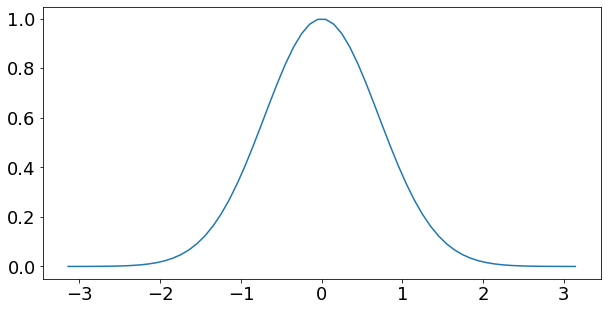

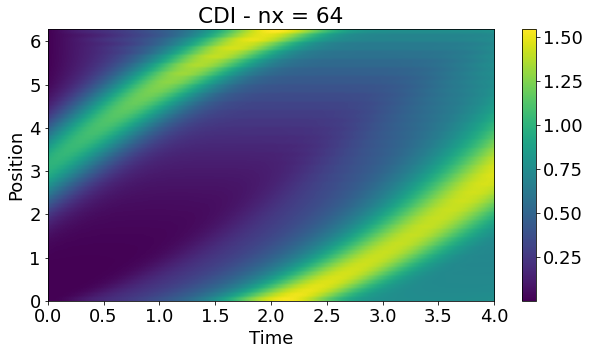

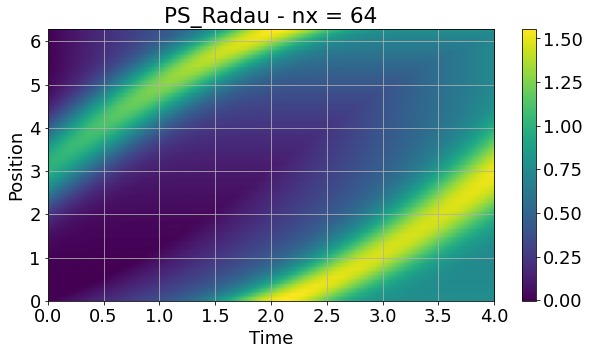

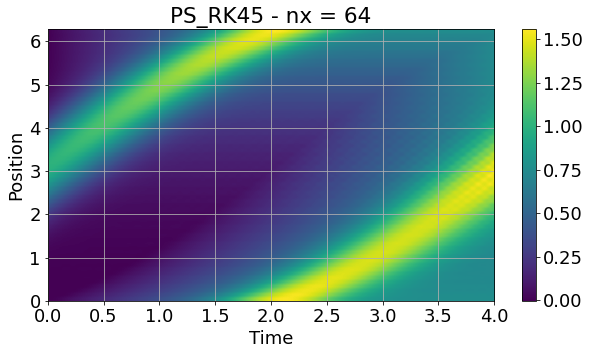

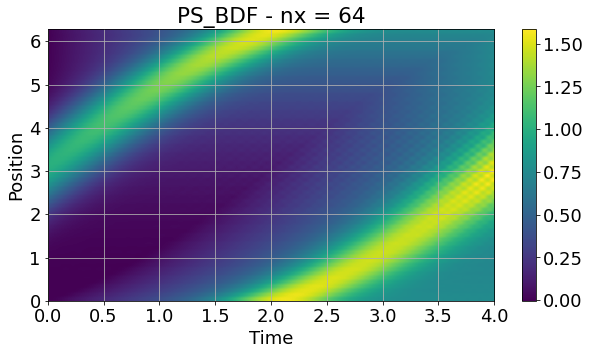

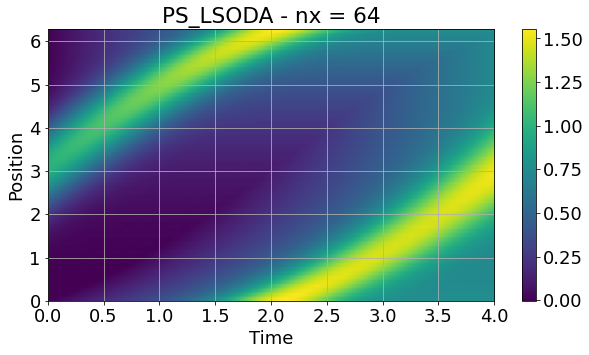

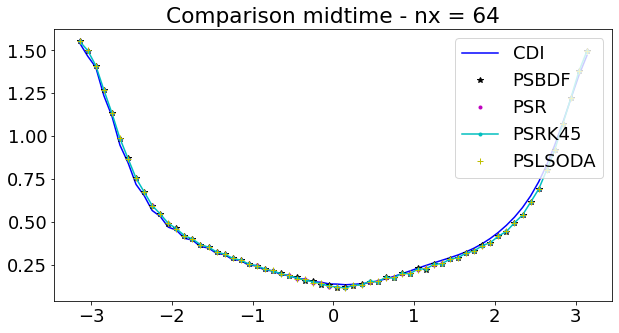

<Figure size 720x360 with 0 Axes>

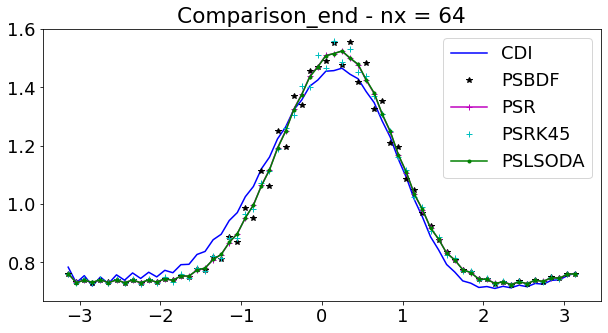

<Figure size 720x360 with 0 Axes>

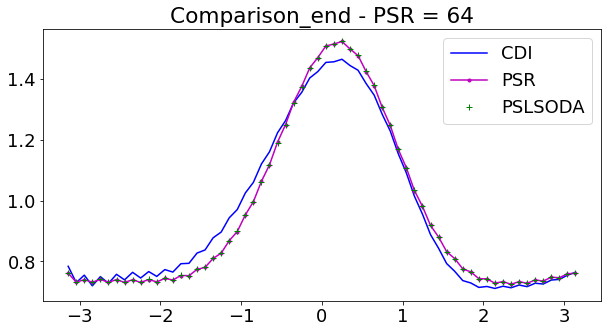

<Figure size 720x360 with 0 Axes>

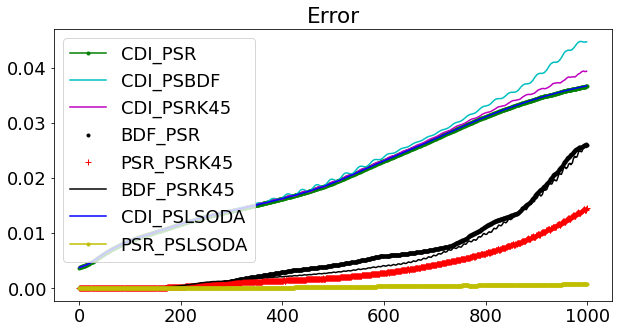

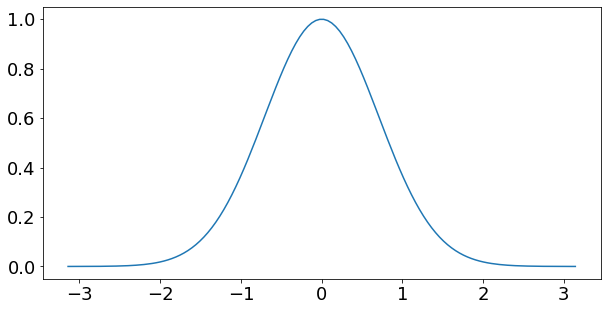

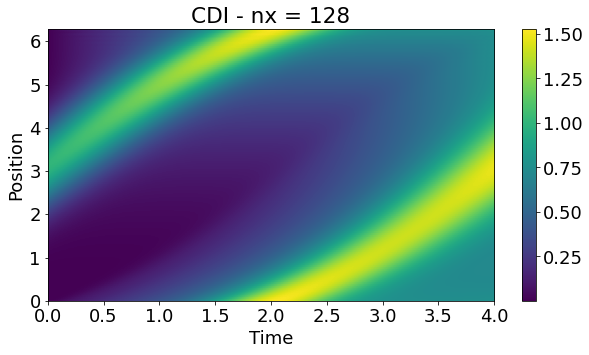

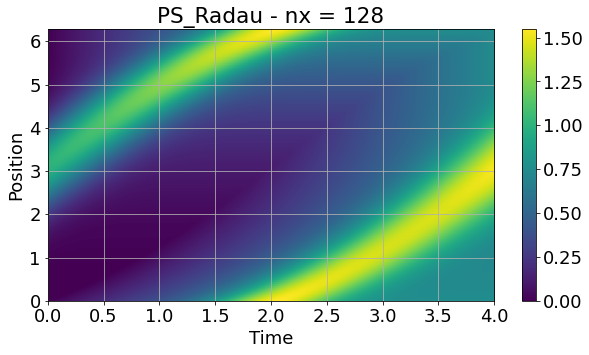

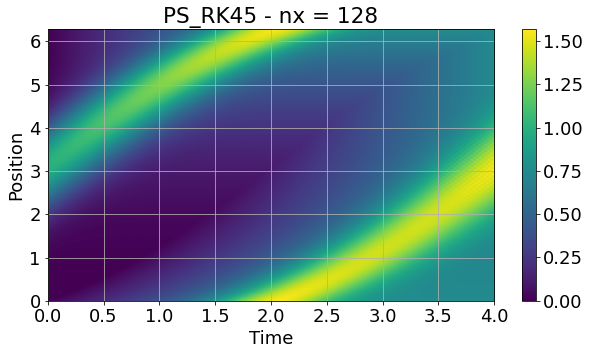

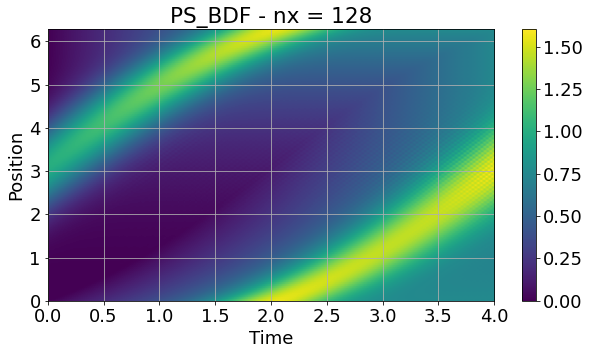

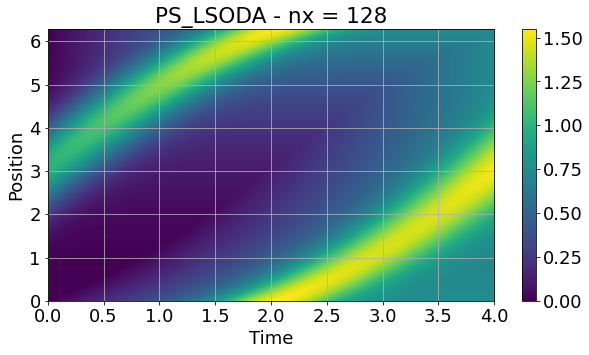

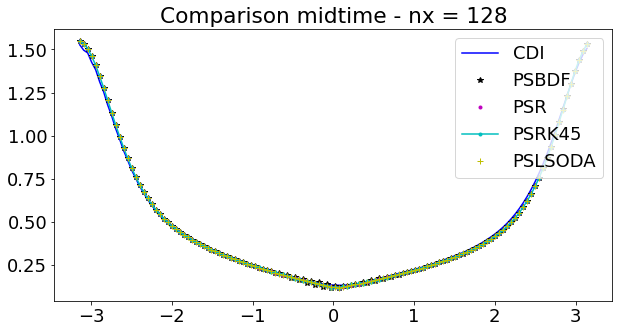

<Figure size 720x360 with 0 Axes>

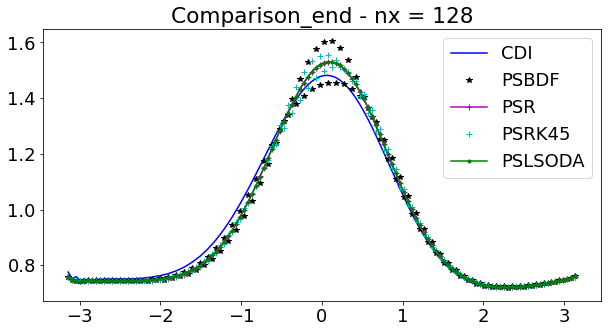

<Figure size 720x360 with 0 Axes>

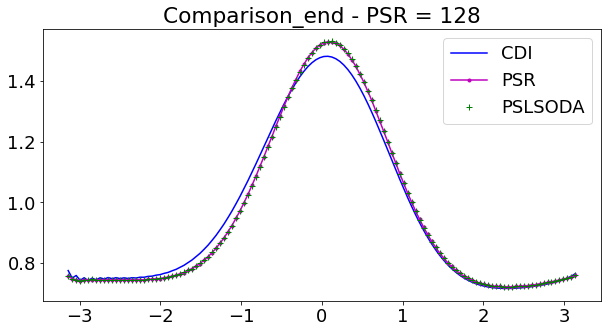

<Figure size 720x360 with 0 Axes>

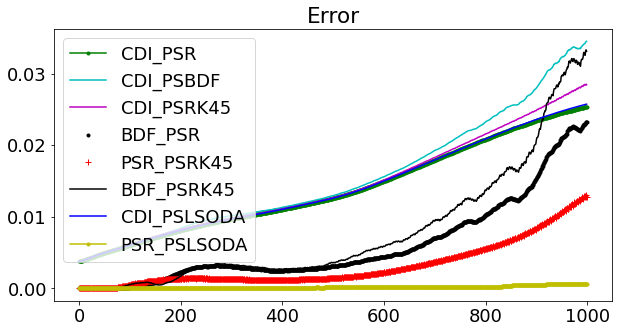

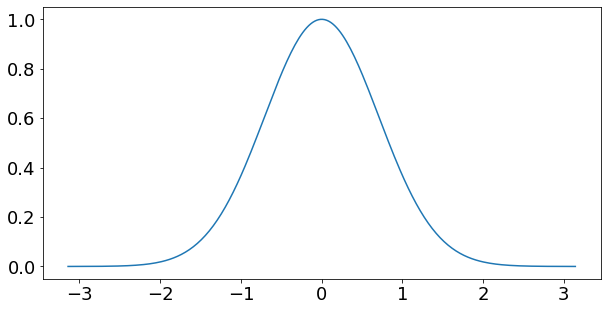

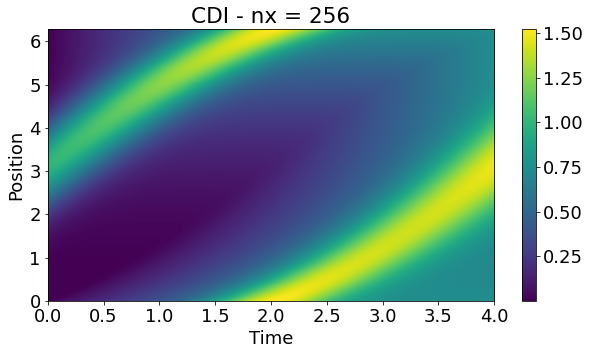

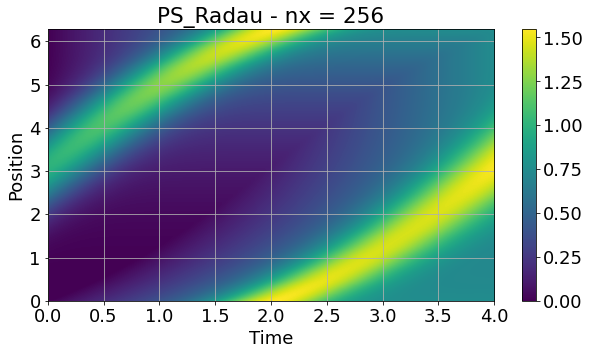

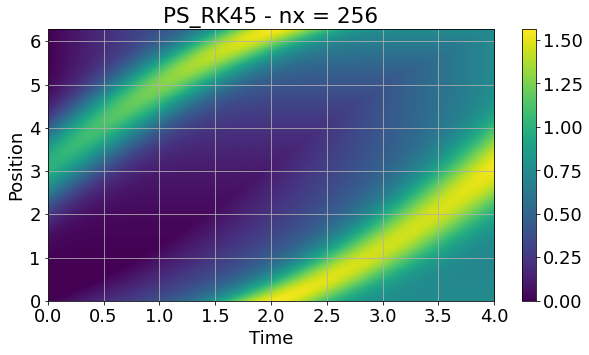

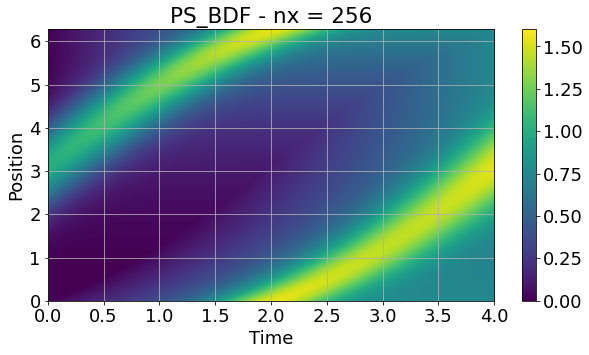

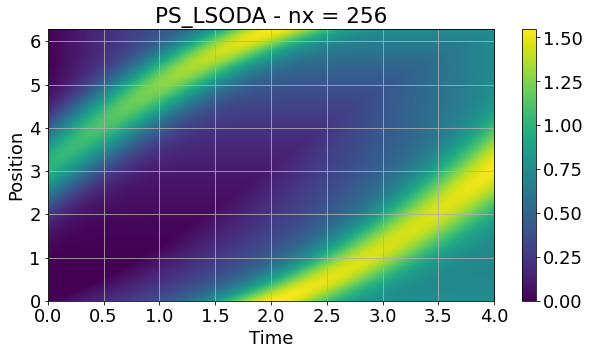

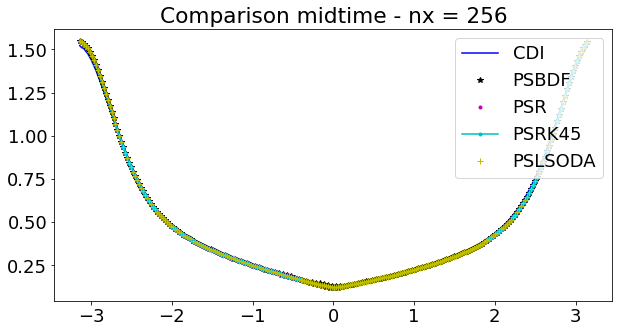

<Figure size 720x360 with 0 Axes>

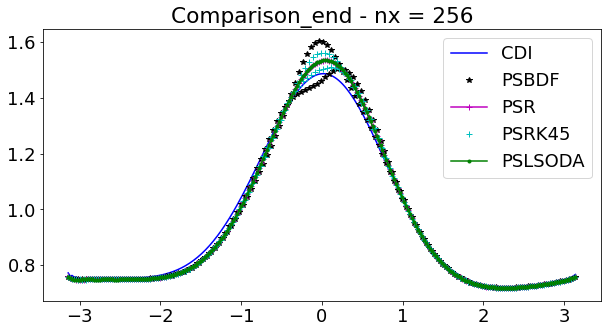

<Figure size 720x360 with 0 Axes>

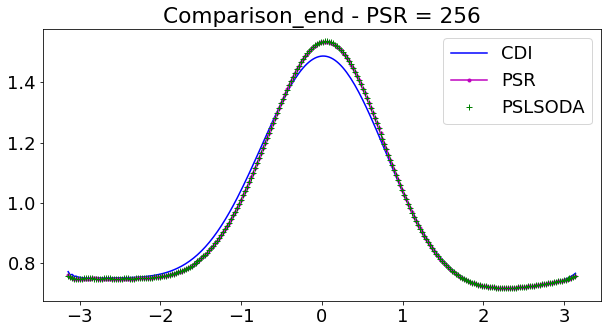

<Figure size 720x360 with 0 Axes>

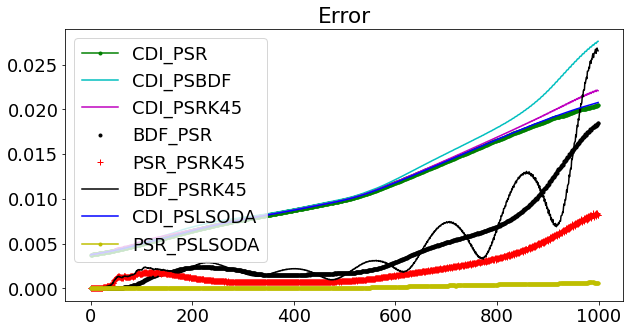

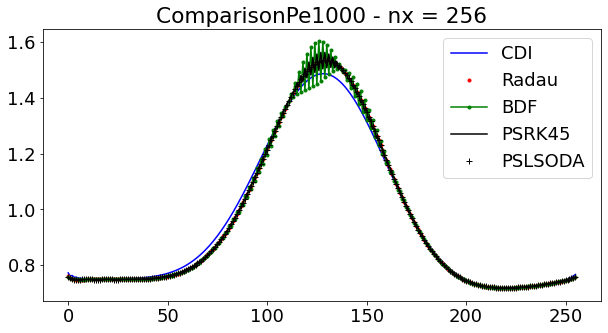

In [14]:
AL = 1.0
BL = 0.001
CL = 0.1
DL = 0.2
# Pe =100

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.', color = 'r', label = 'Radau');
plt.plot(res[2], '.-', color = 'g', label = 'BDF');
plt.plot(res[3], '-', color = 'k', label = 'PSRK45');

plt.plot(res[4], '+', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe1000 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

# Pe = 100

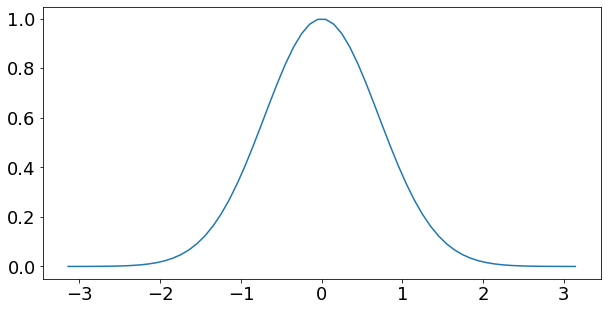

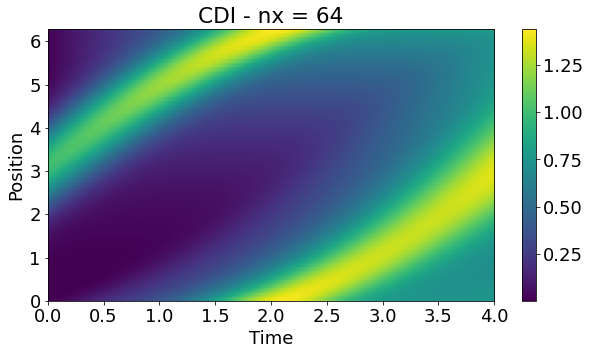

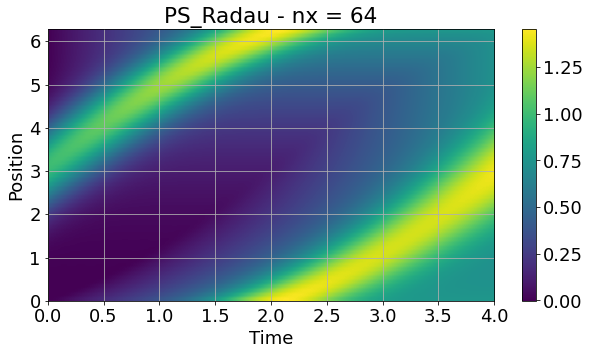

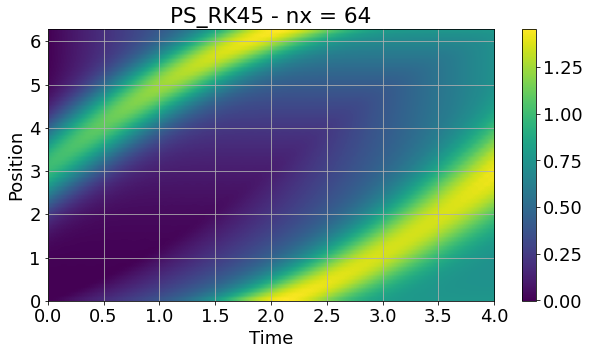

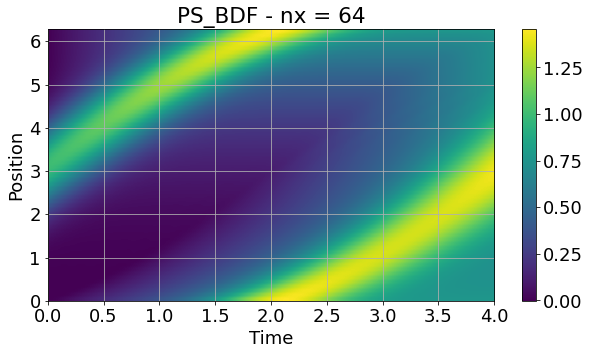

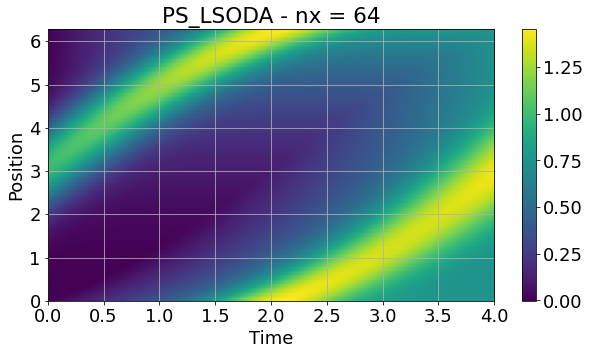

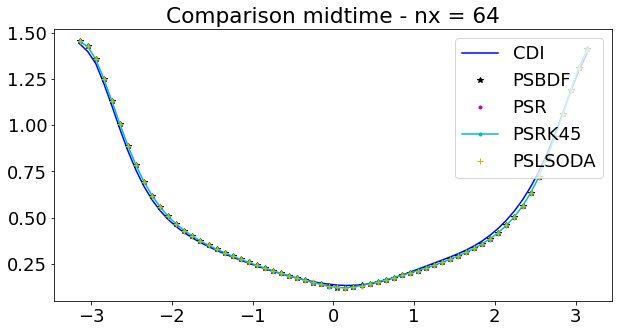

<Figure size 720x360 with 0 Axes>

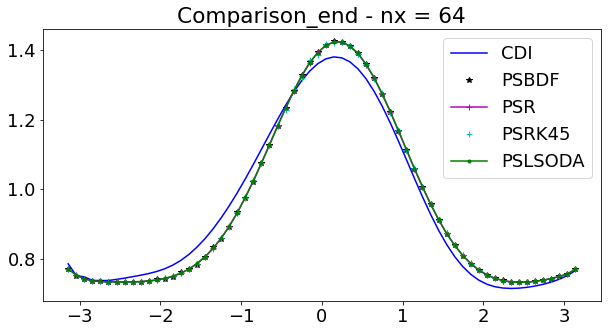

<Figure size 720x360 with 0 Axes>

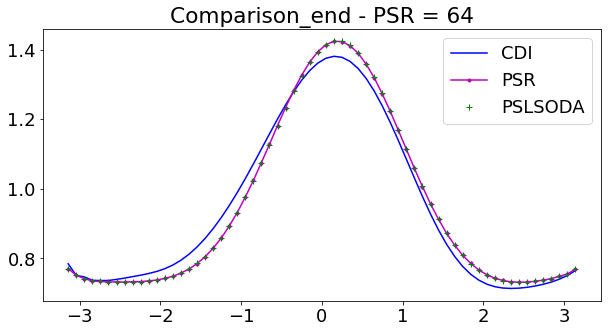

<Figure size 720x360 with 0 Axes>

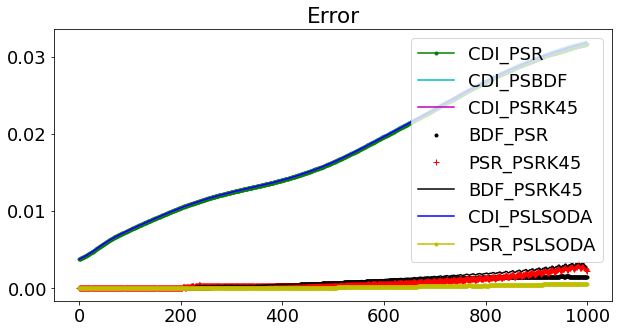

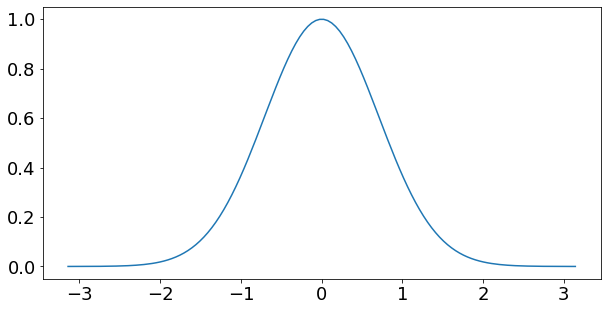

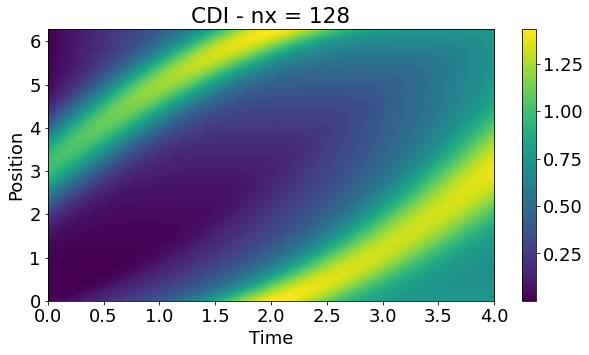

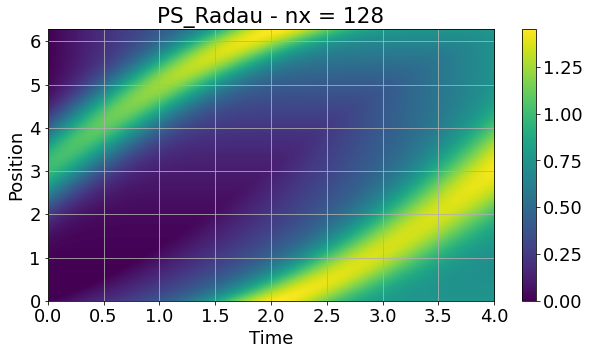

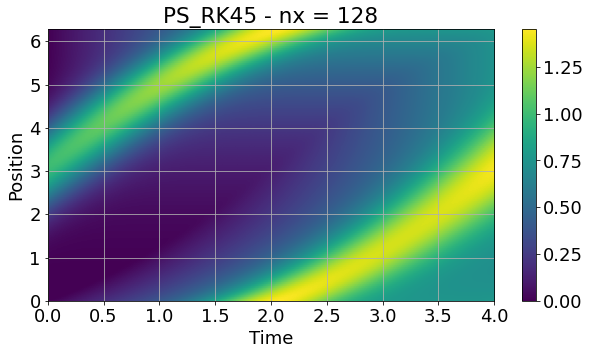

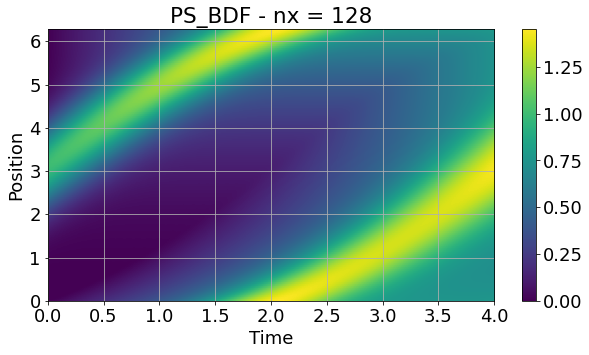

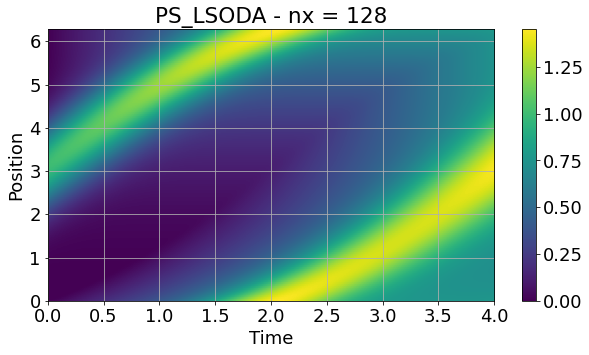

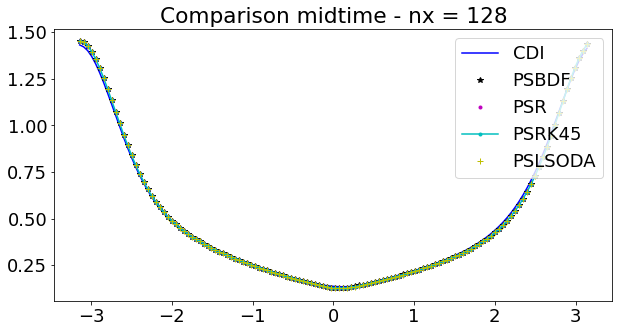

<Figure size 720x360 with 0 Axes>

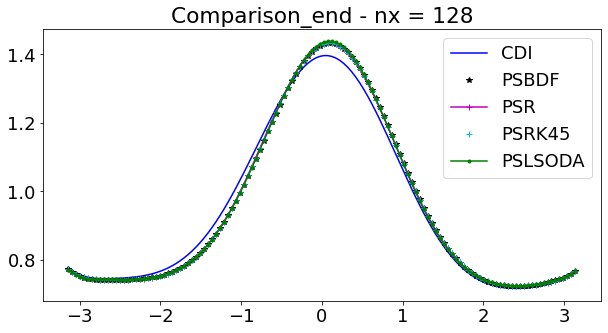

<Figure size 720x360 with 0 Axes>

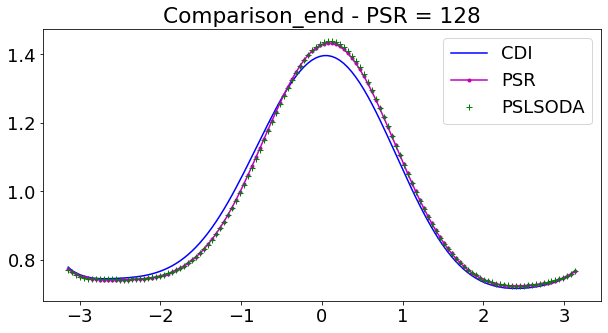

<Figure size 720x360 with 0 Axes>

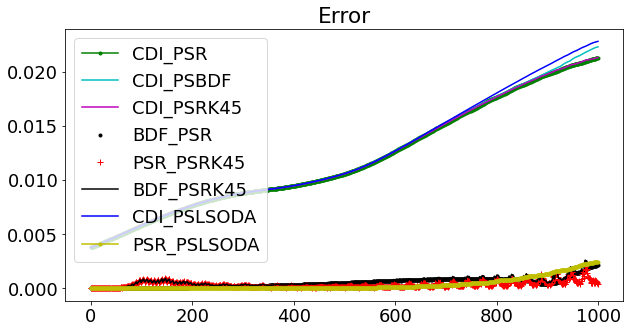

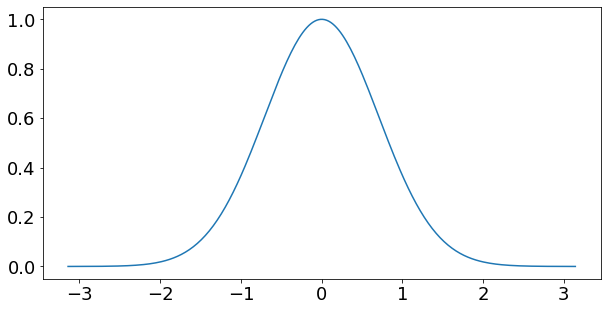

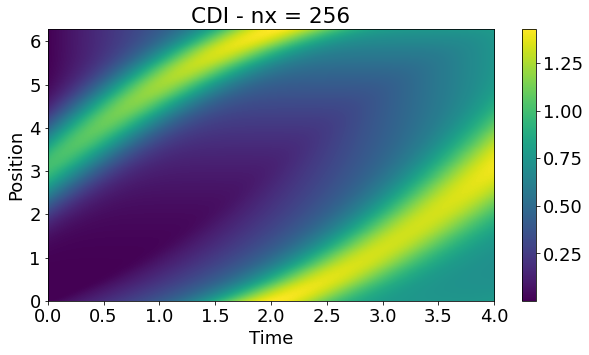

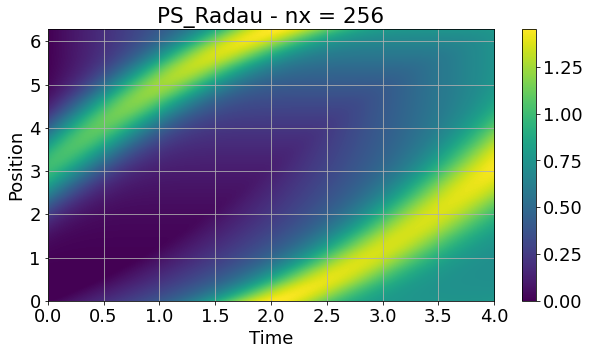

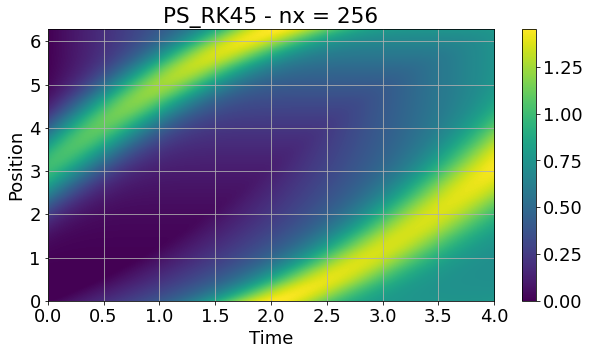

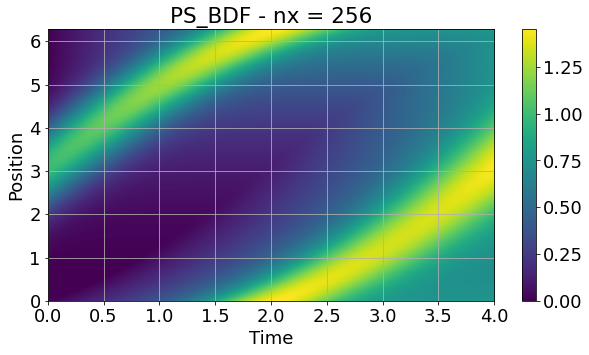

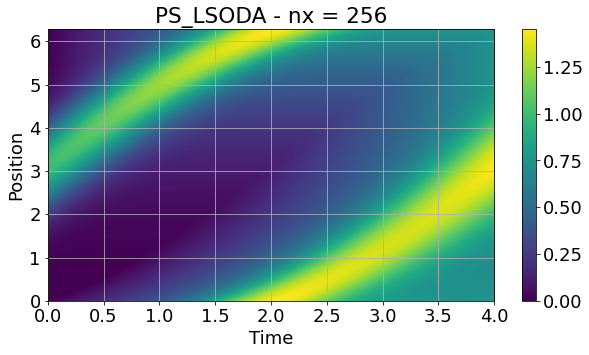

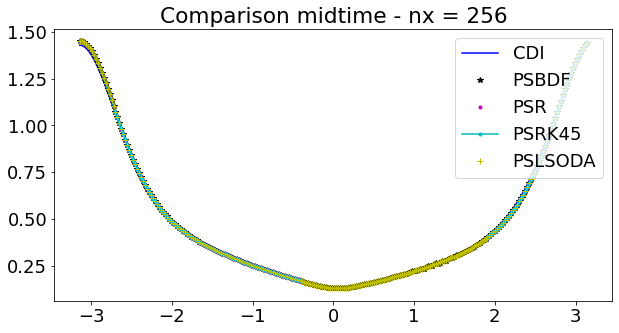

<Figure size 720x360 with 0 Axes>

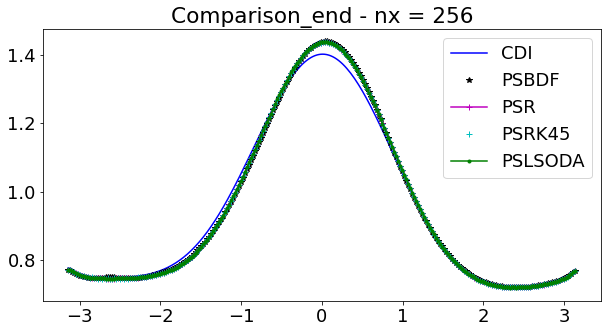

<Figure size 720x360 with 0 Axes>

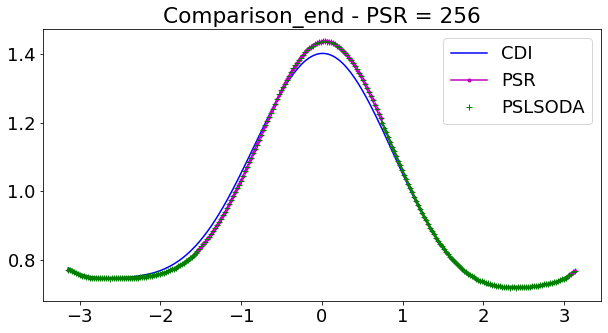

<Figure size 720x360 with 0 Axes>

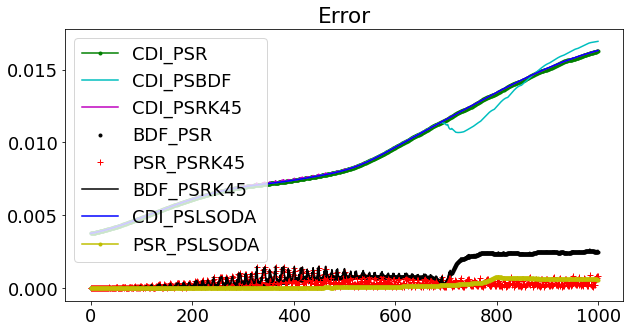

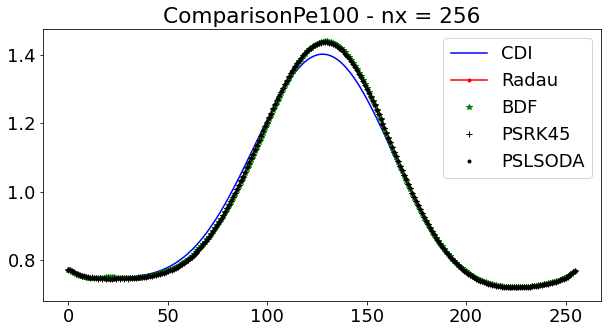

In [42]:
AL = 1.0
BL = 0.01
CL = 0.1
DL = 0.2
# Pe =100

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe100 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

# Pe = 10

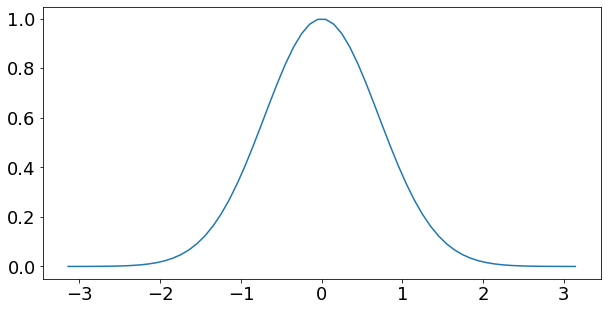

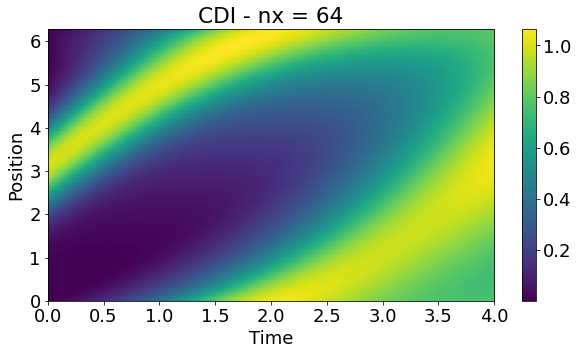

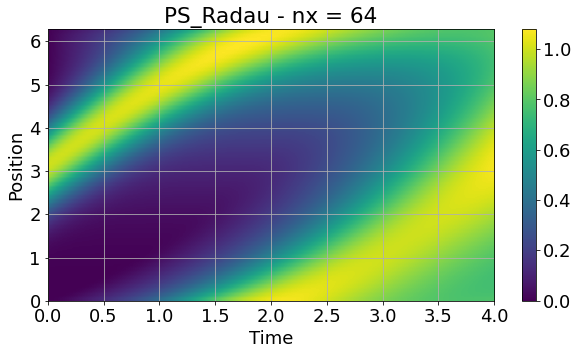

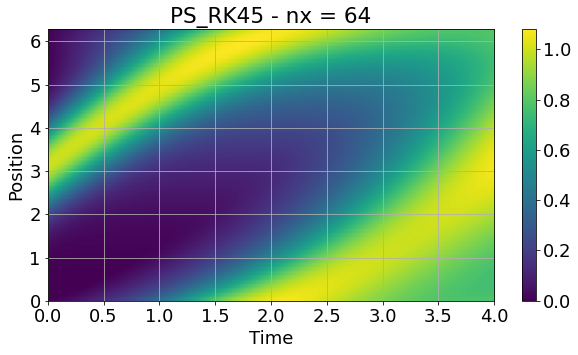

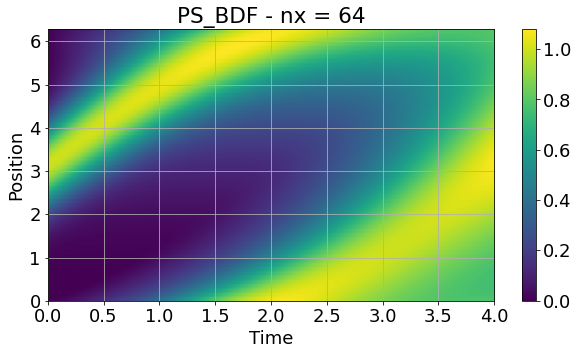

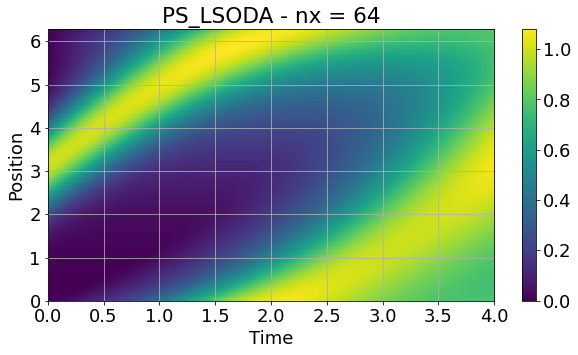

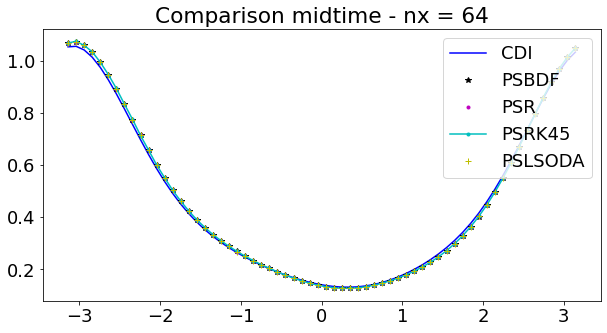

<Figure size 720x360 with 0 Axes>

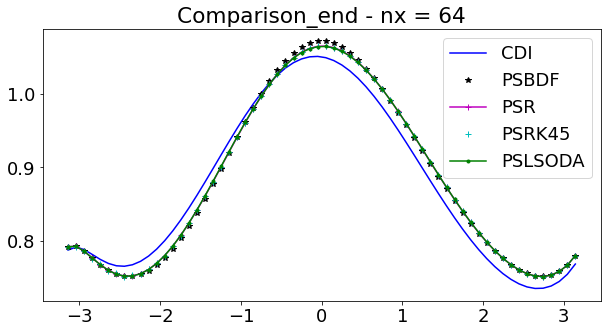

<Figure size 720x360 with 0 Axes>

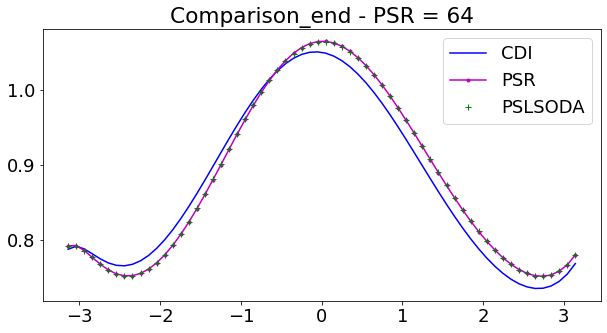

<Figure size 720x360 with 0 Axes>

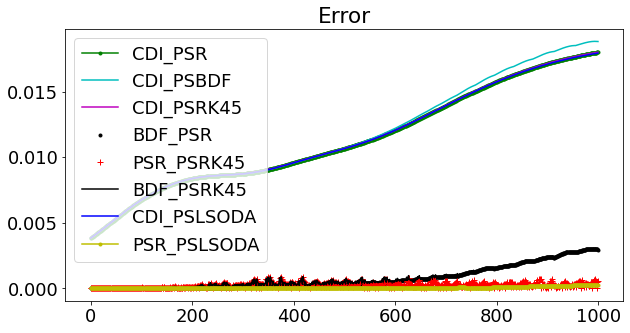

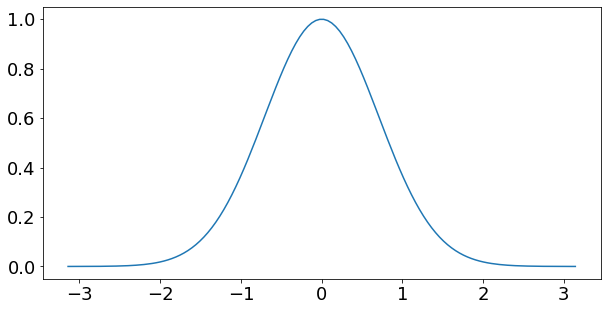

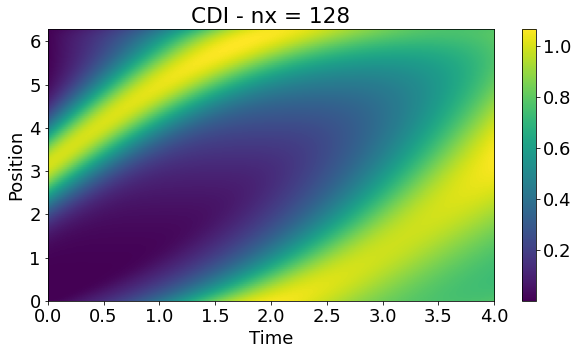

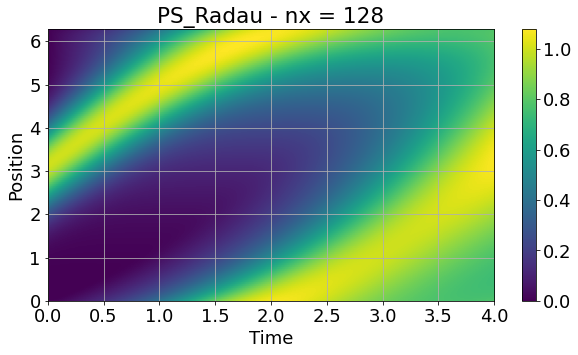

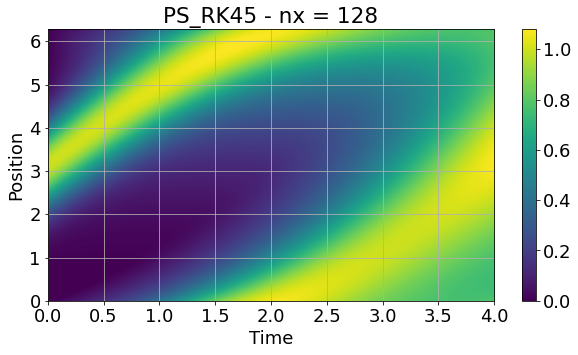

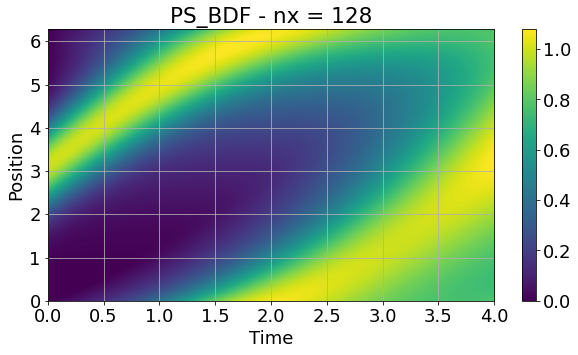

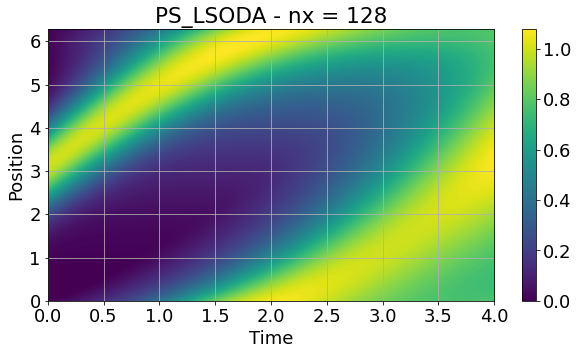

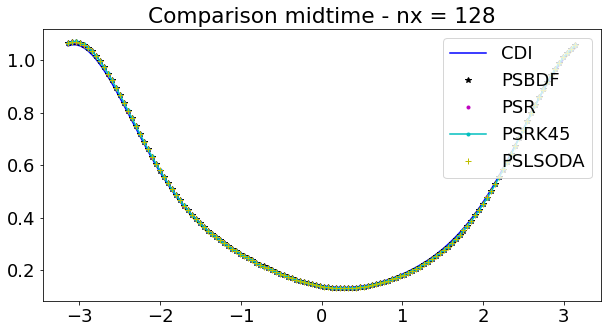

<Figure size 720x360 with 0 Axes>

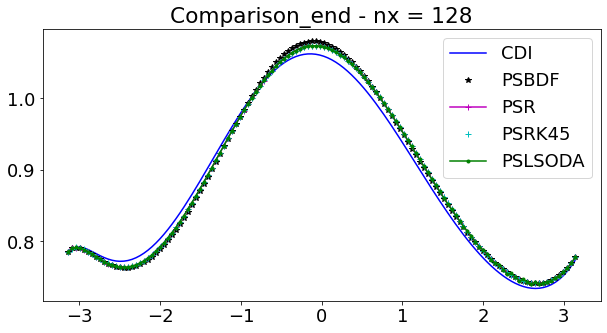

<Figure size 720x360 with 0 Axes>

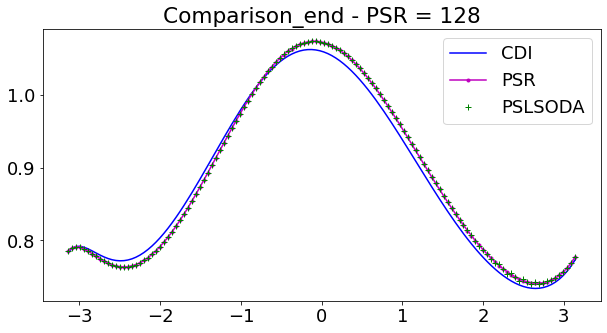

<Figure size 720x360 with 0 Axes>

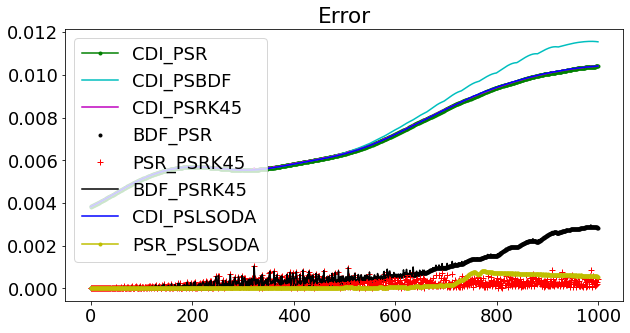

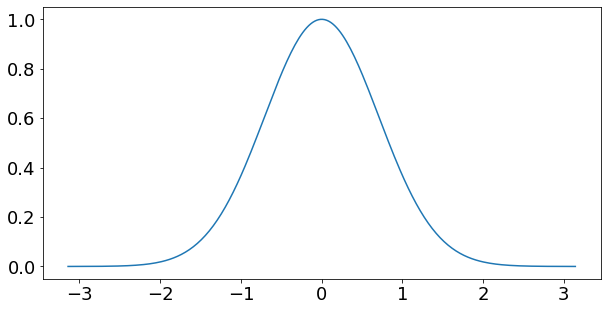

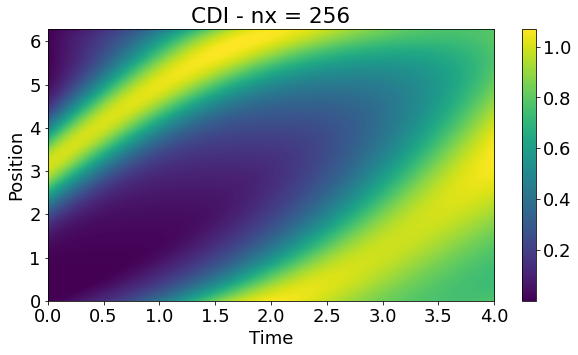

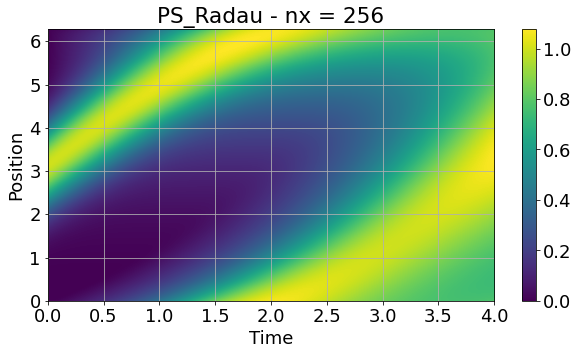

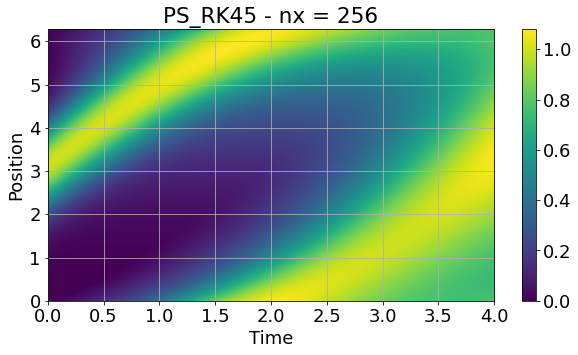

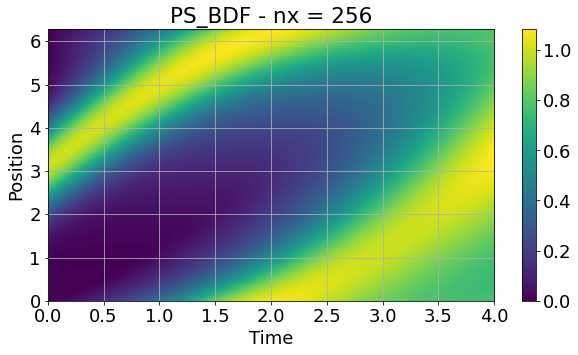

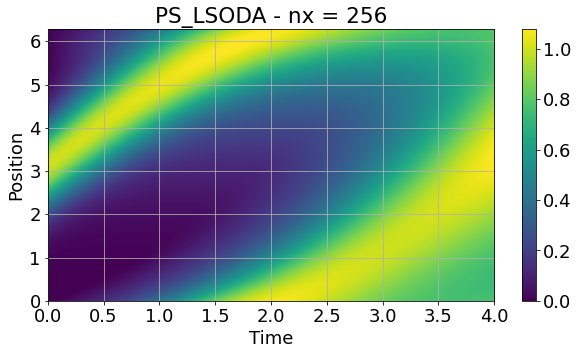

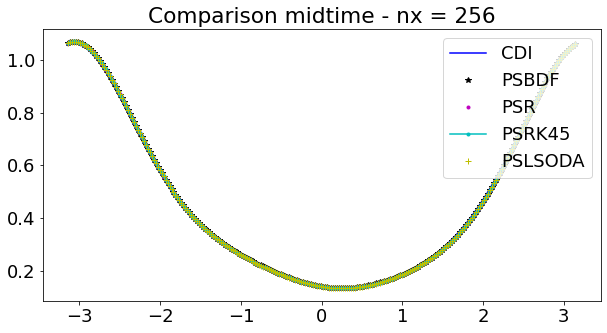

<Figure size 720x360 with 0 Axes>

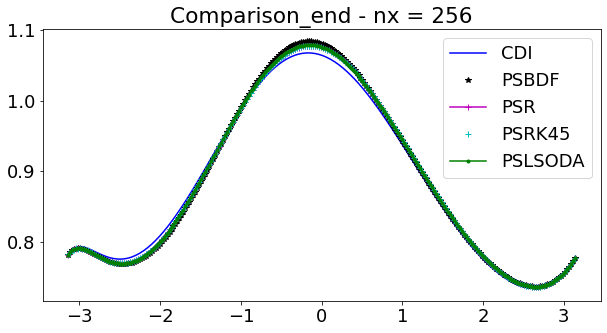

<Figure size 720x360 with 0 Axes>

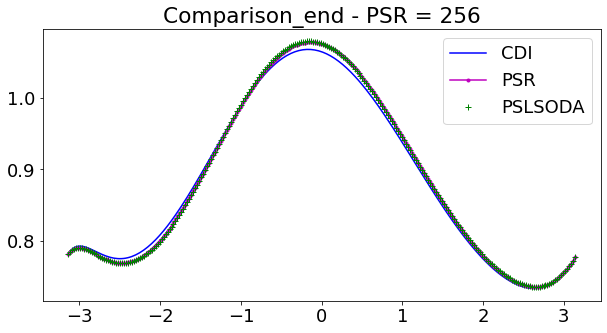

<Figure size 720x360 with 0 Axes>

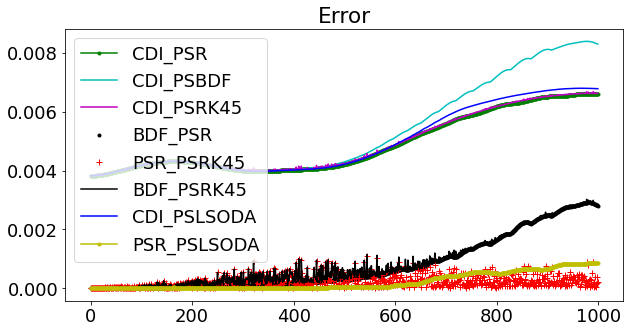

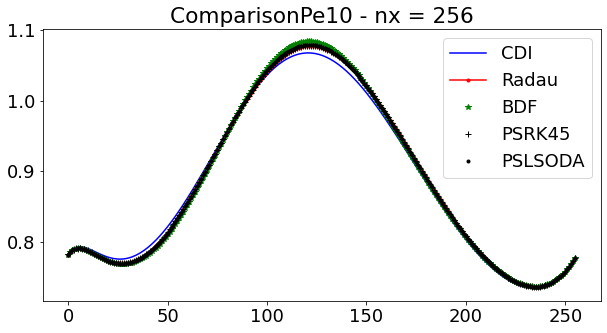

In [43]:
AL = 1.0
BL = 0.1
CL = 0.1
DL = 0.2
# Pe =10

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe10 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

# Pe = 1

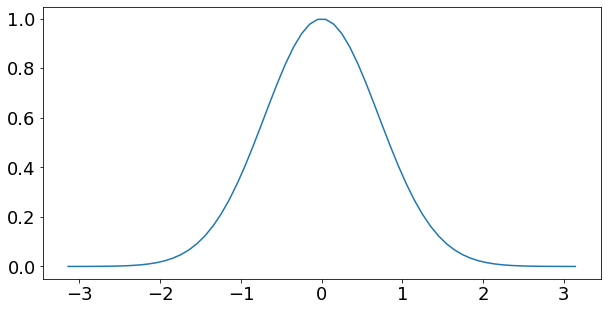

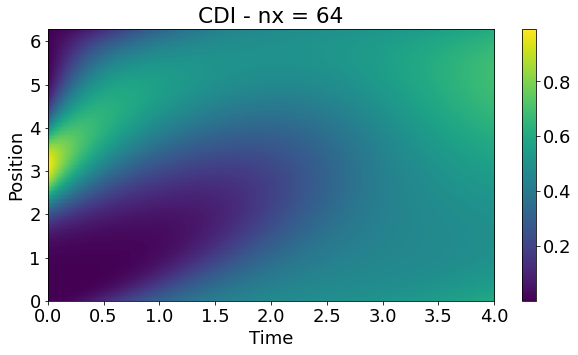

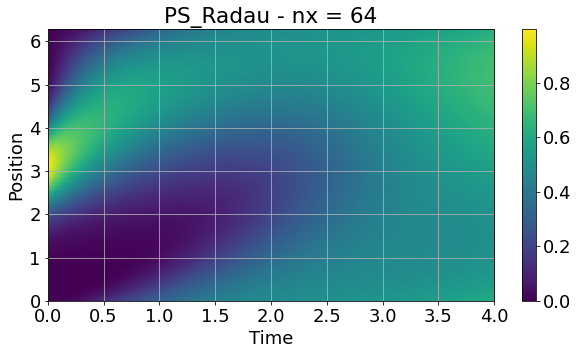

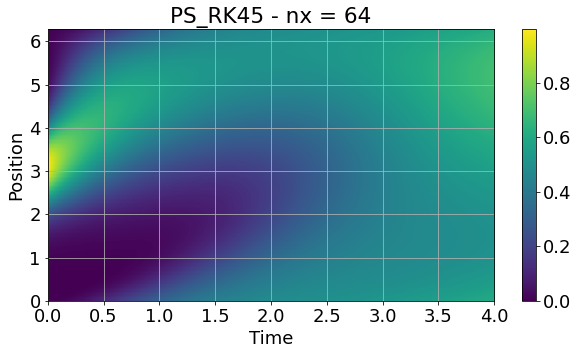

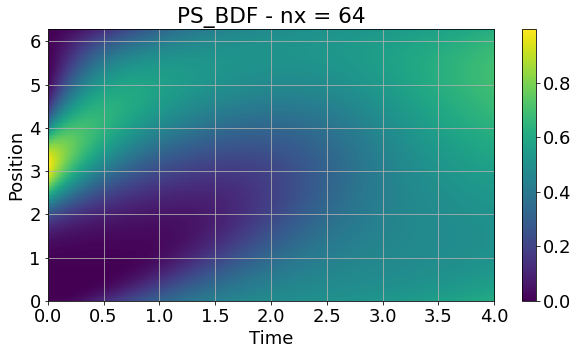

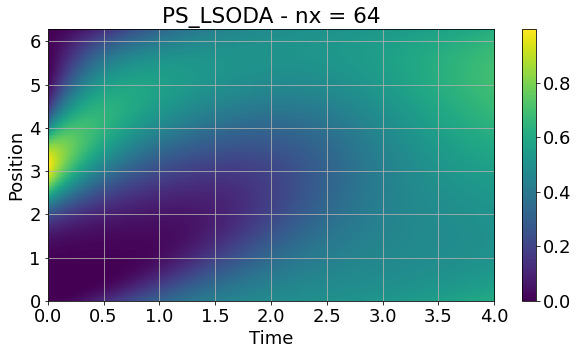

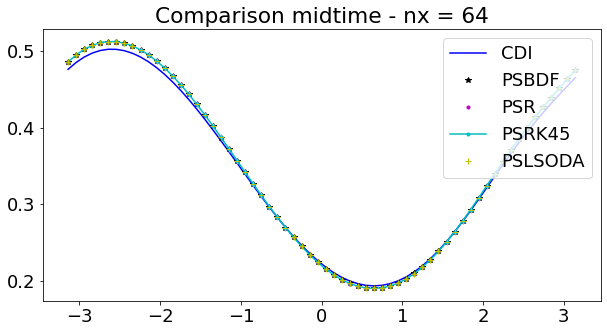

<Figure size 720x360 with 0 Axes>

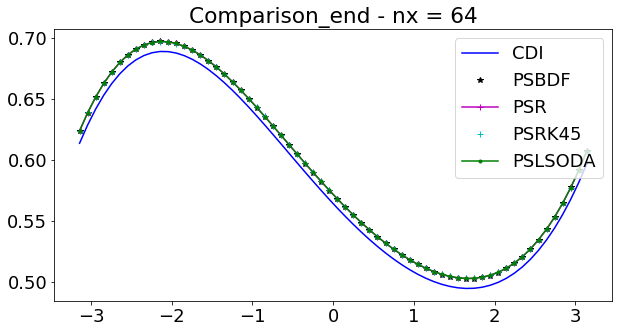

<Figure size 720x360 with 0 Axes>

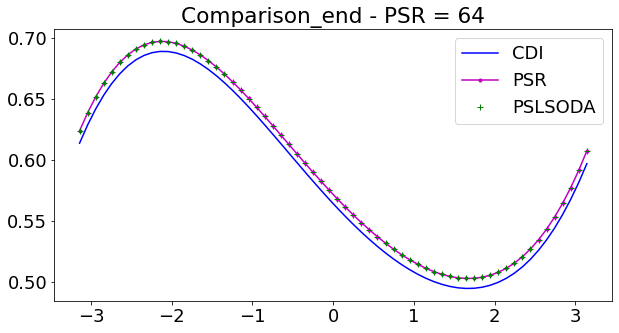

<Figure size 720x360 with 0 Axes>

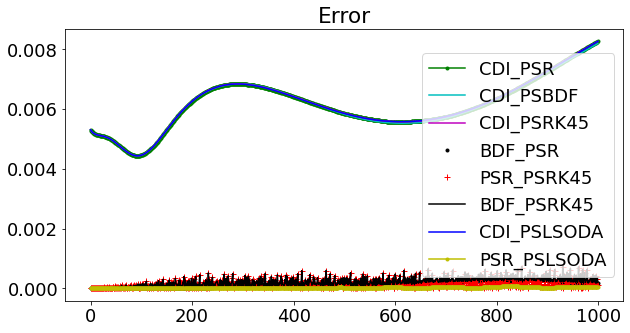

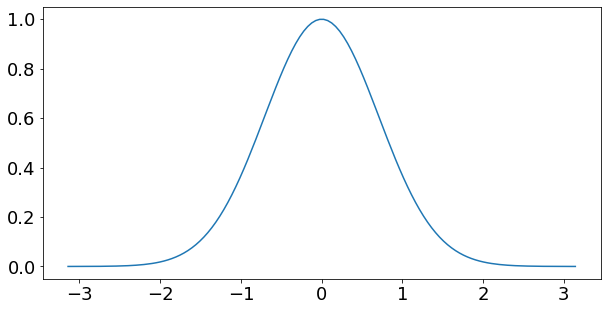

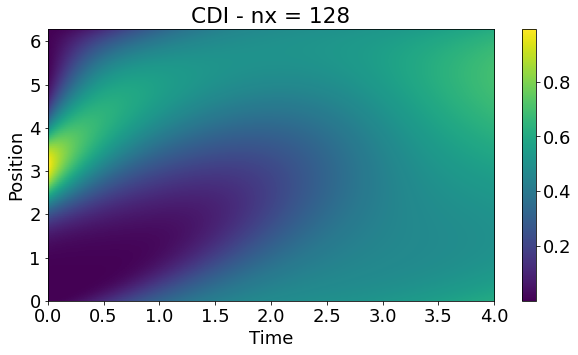

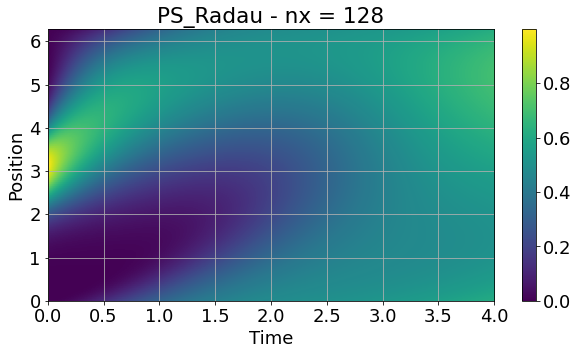

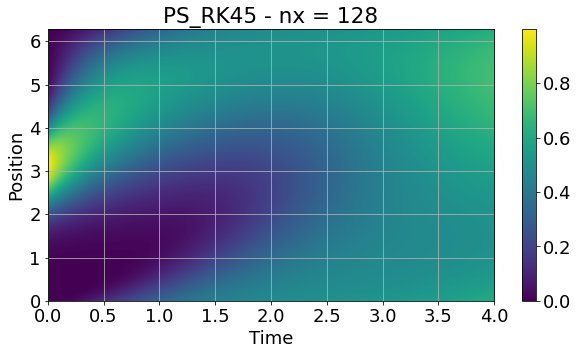

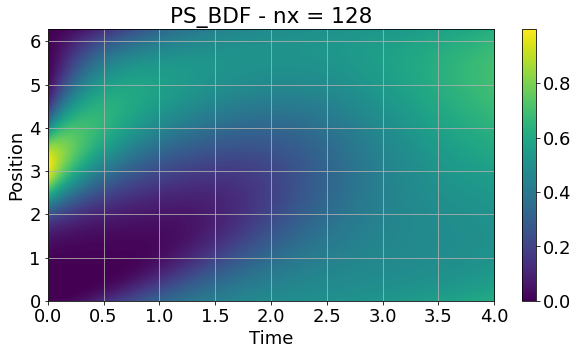

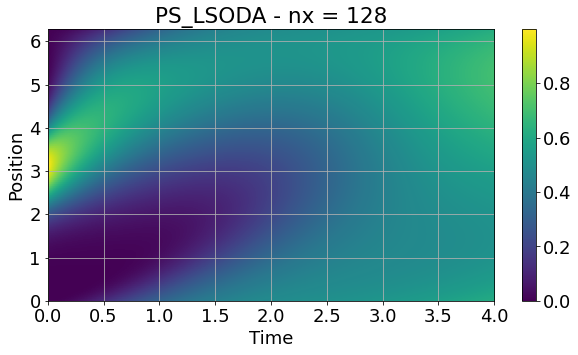

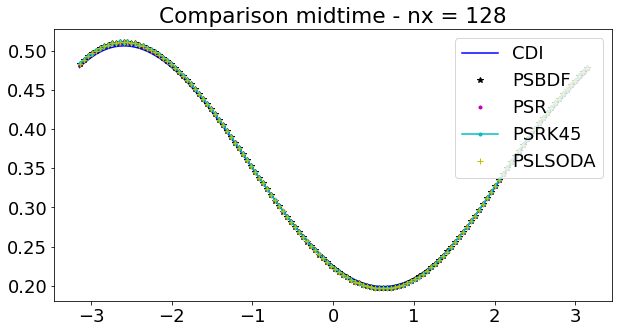

<Figure size 720x360 with 0 Axes>

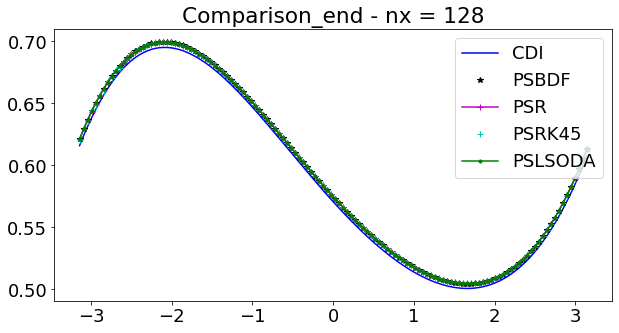

<Figure size 720x360 with 0 Axes>

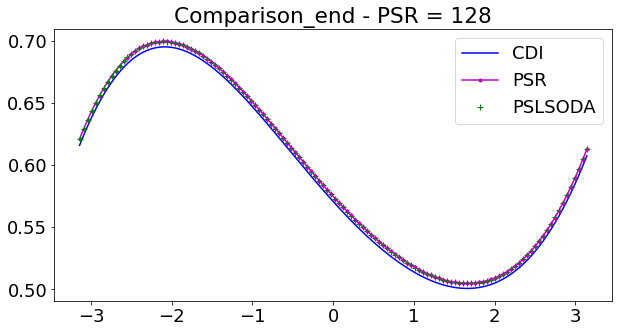

<Figure size 720x360 with 0 Axes>

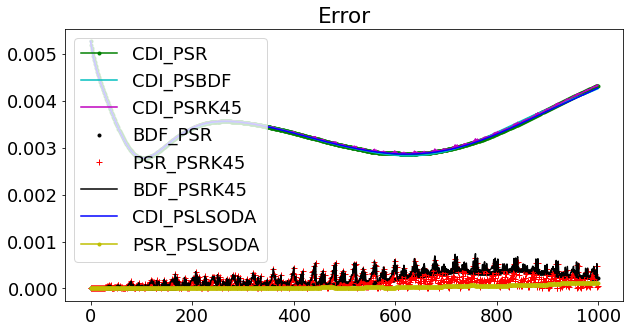

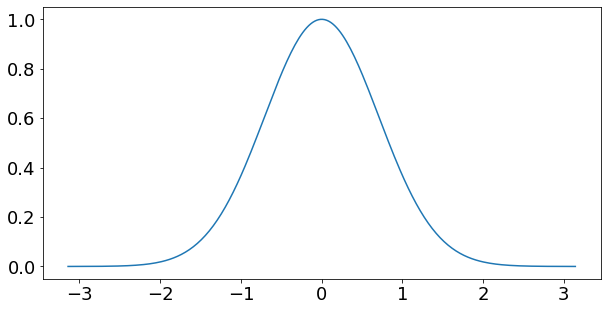

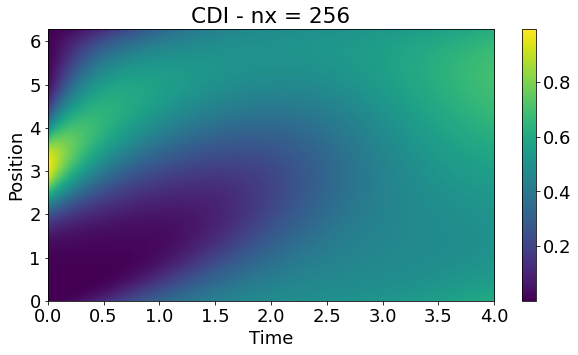

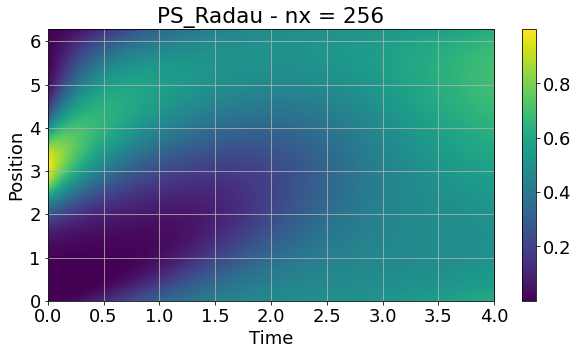

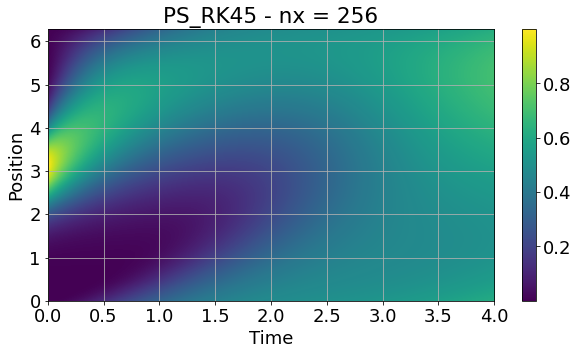

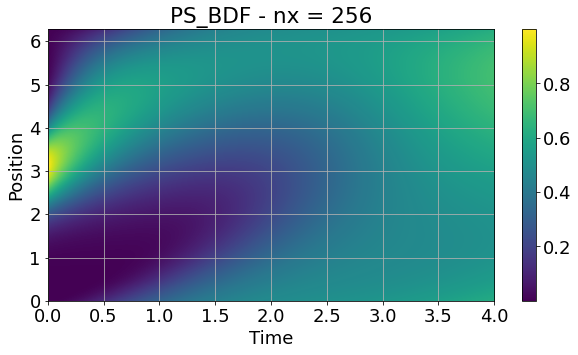

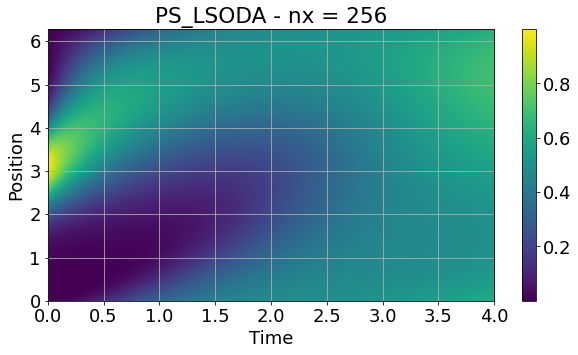

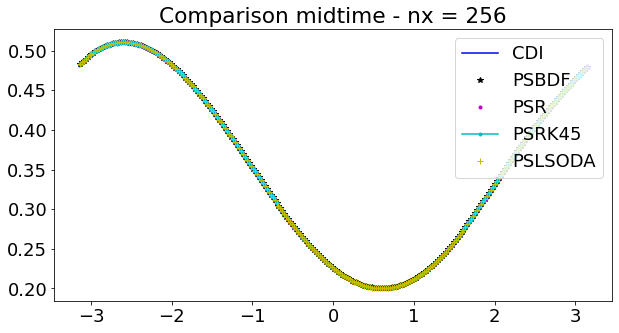

<Figure size 720x360 with 0 Axes>

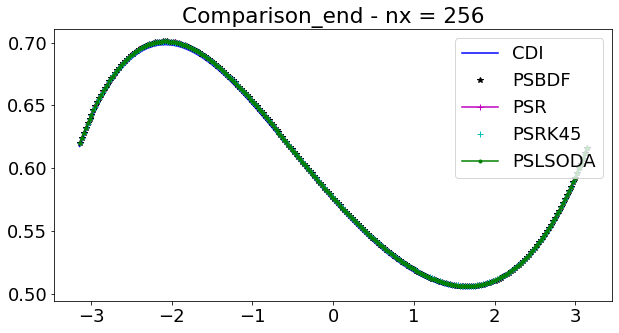

<Figure size 720x360 with 0 Axes>

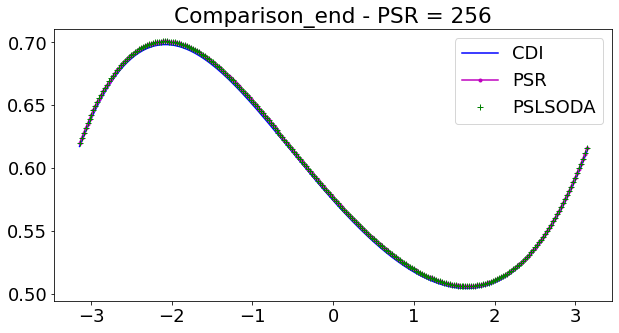

<Figure size 720x360 with 0 Axes>

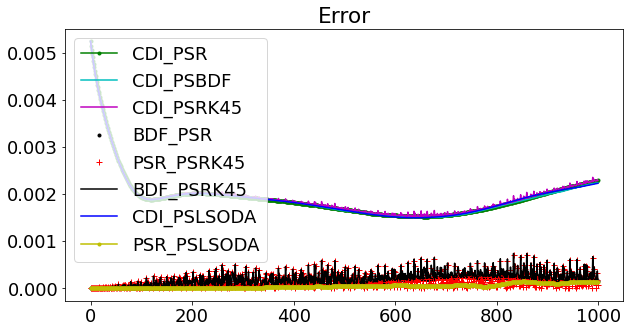

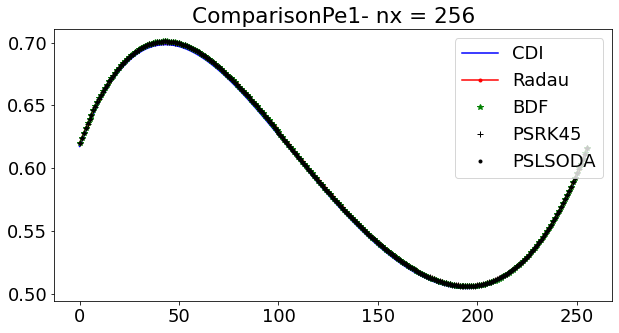

In [44]:
AL = 1.0
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe1- nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()


# Pe = 0.1

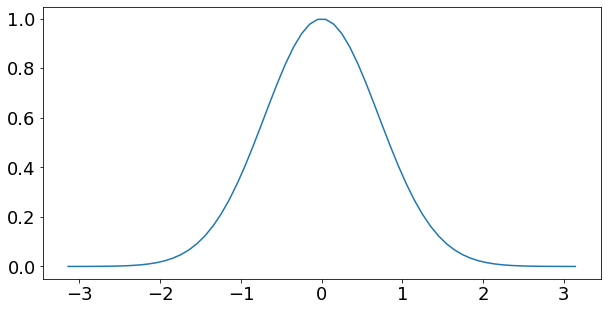

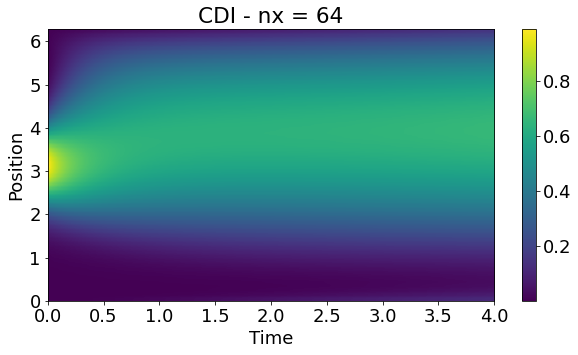

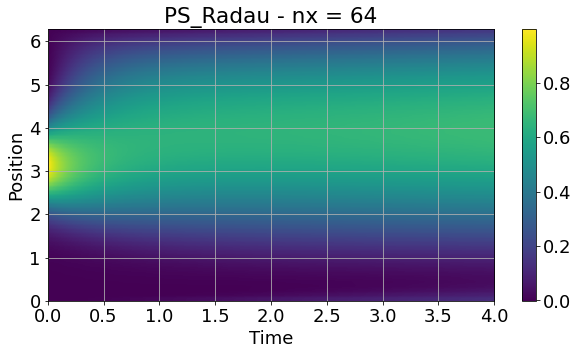

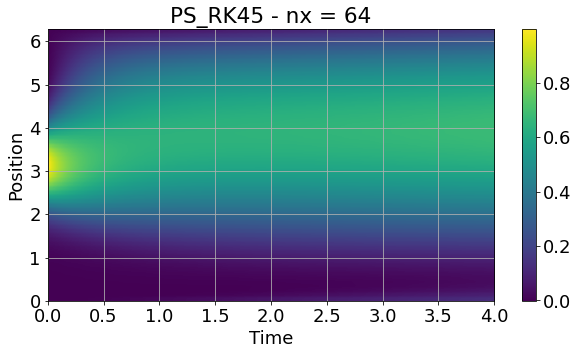

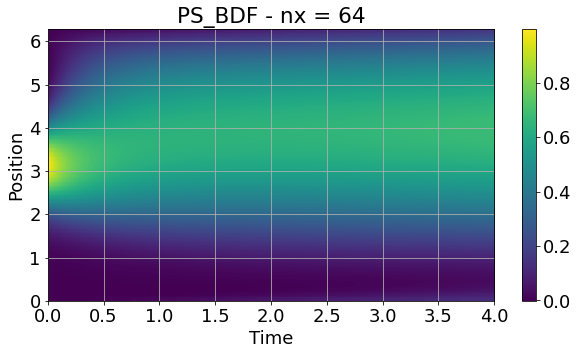

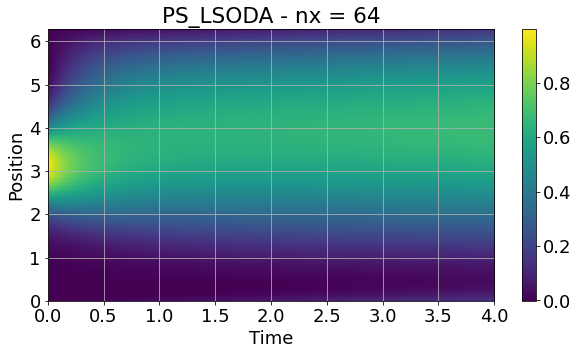

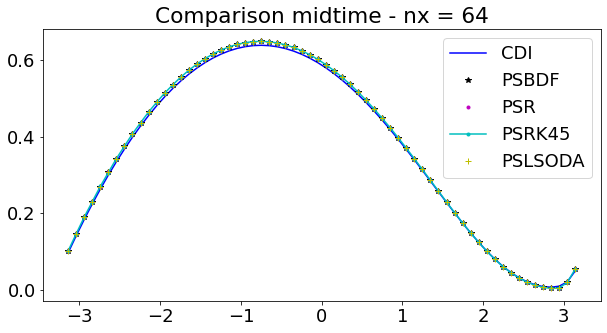

<Figure size 720x360 with 0 Axes>

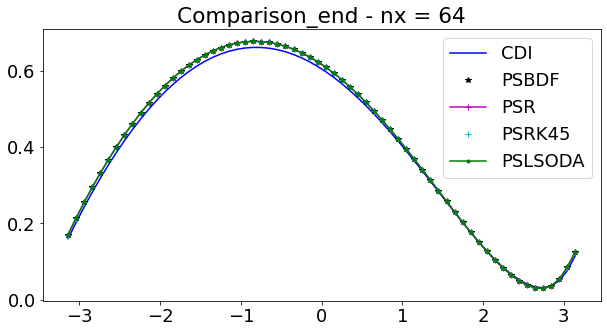

<Figure size 720x360 with 0 Axes>

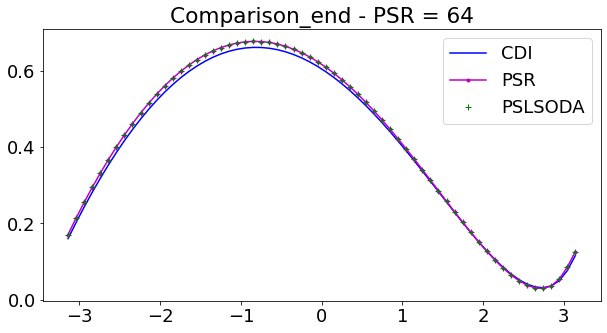

<Figure size 720x360 with 0 Axes>

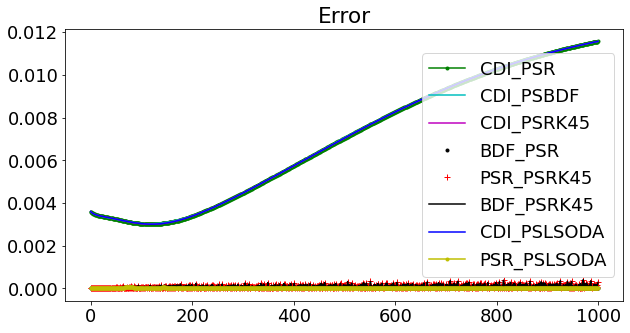

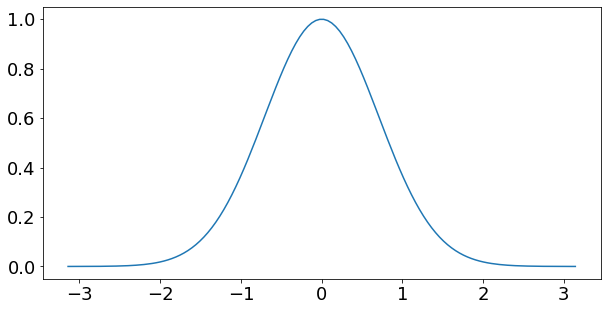

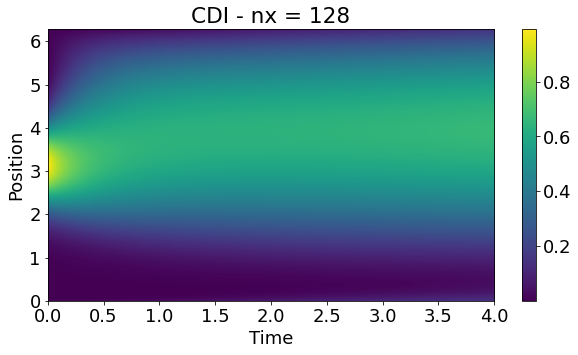

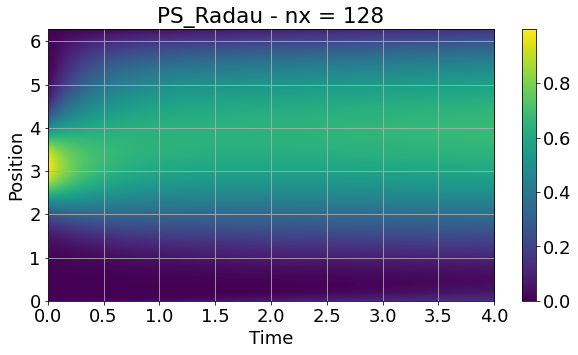

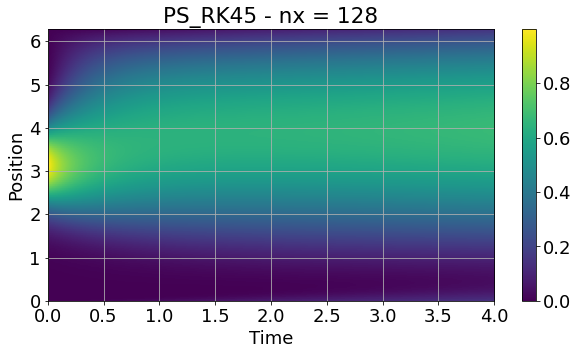

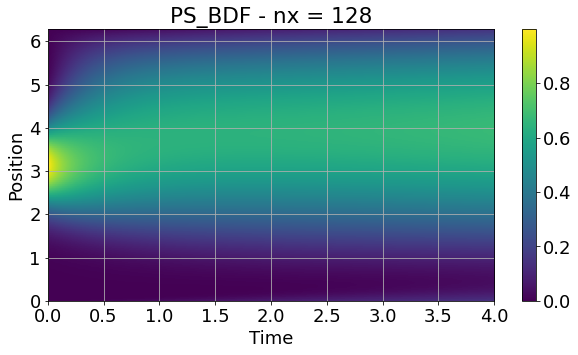

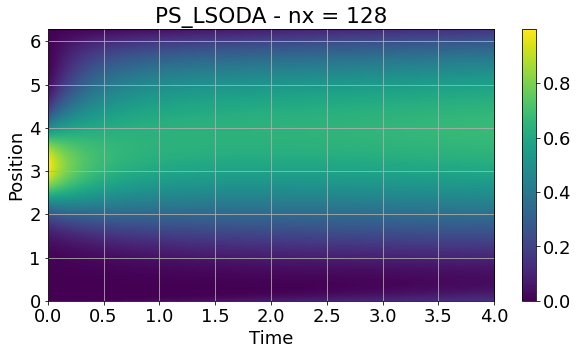

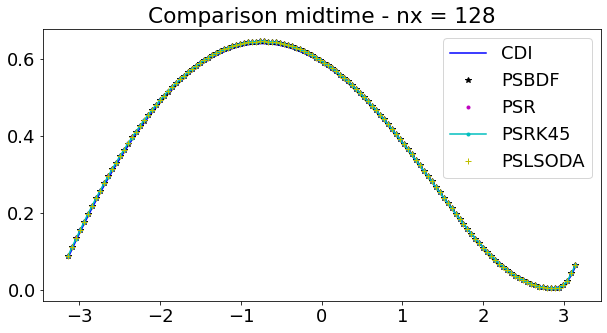

<Figure size 720x360 with 0 Axes>

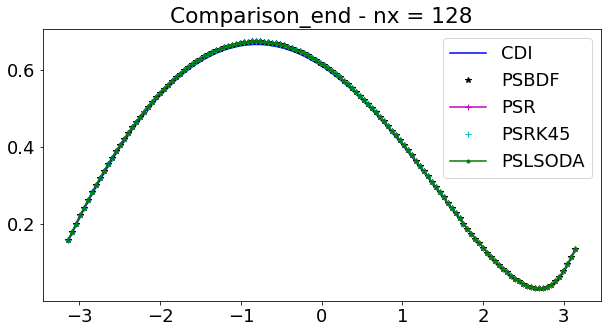

<Figure size 720x360 with 0 Axes>

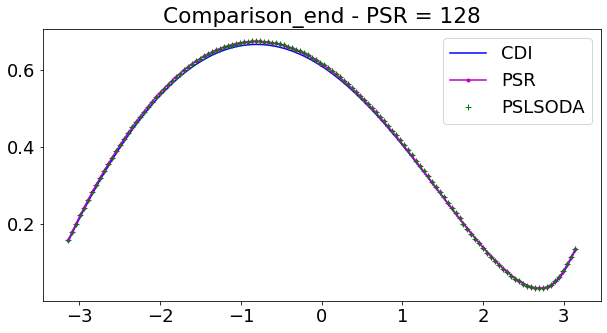

<Figure size 720x360 with 0 Axes>

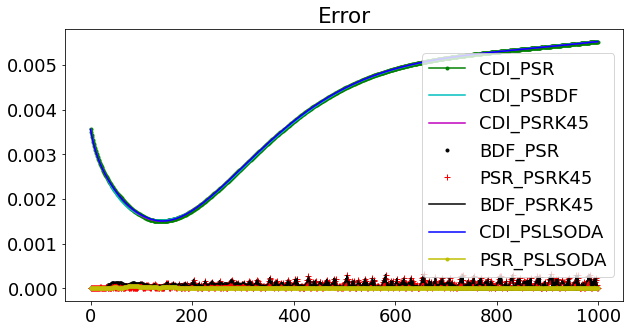

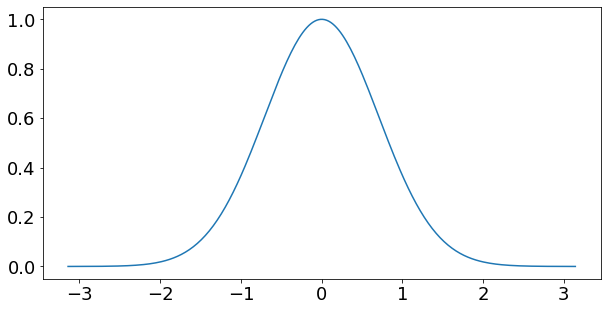

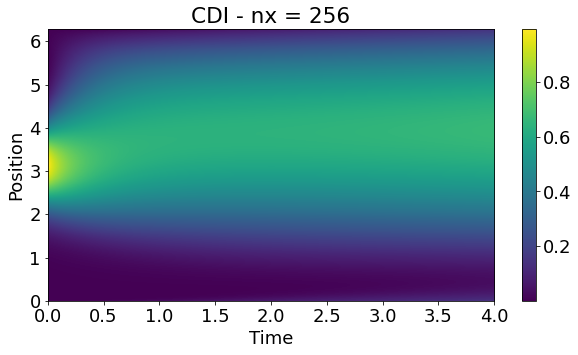

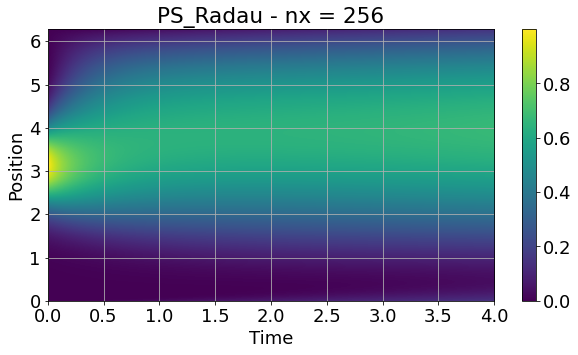

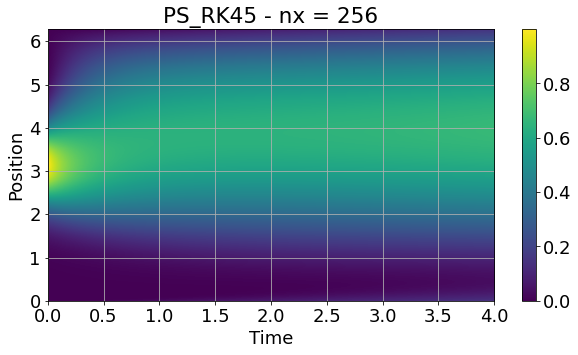

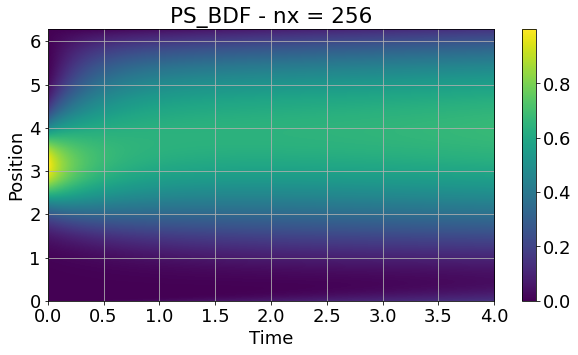

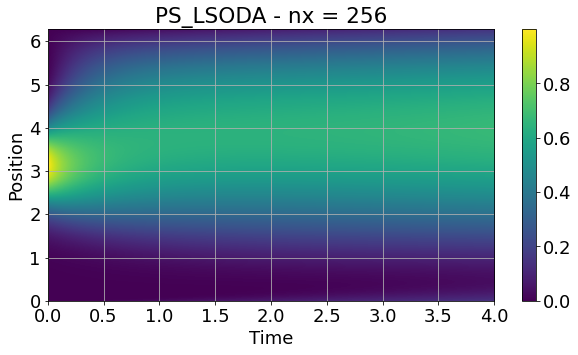

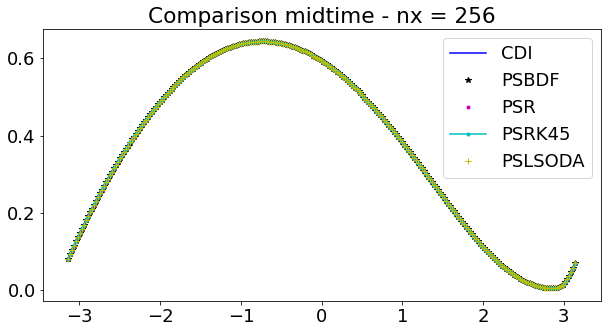

<Figure size 720x360 with 0 Axes>

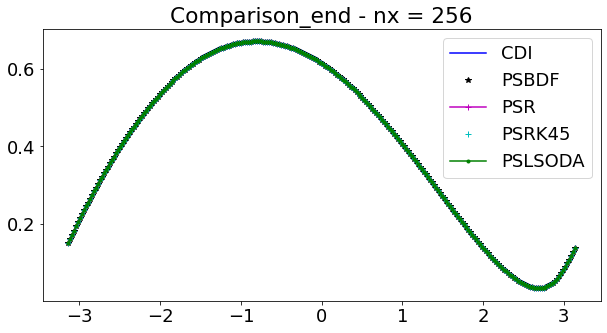

<Figure size 720x360 with 0 Axes>

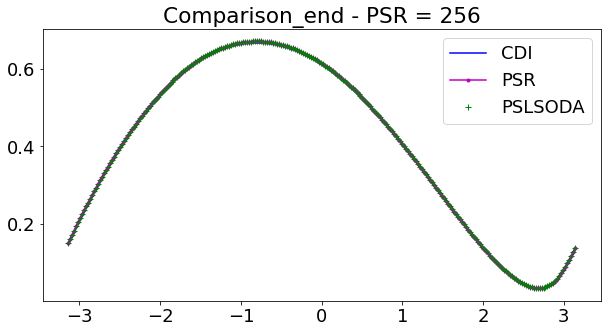

<Figure size 720x360 with 0 Axes>

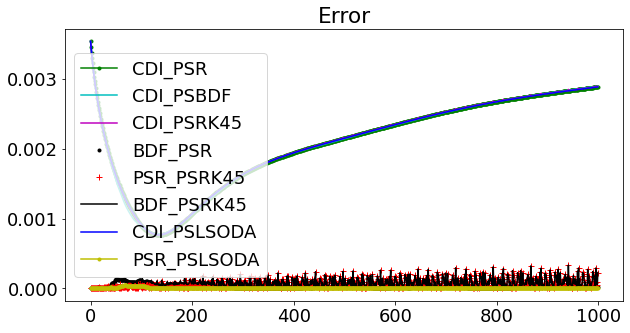

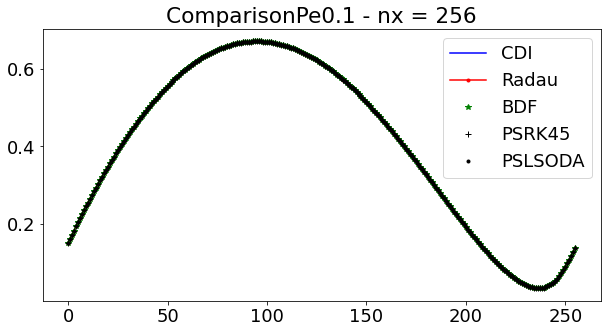

In [45]:

AL = 0.1
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =0.1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe0.1 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()


# Pe = 0.01

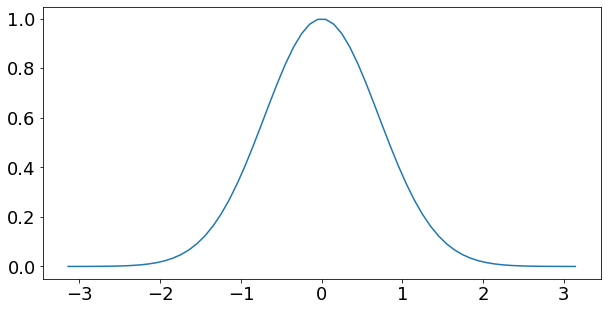

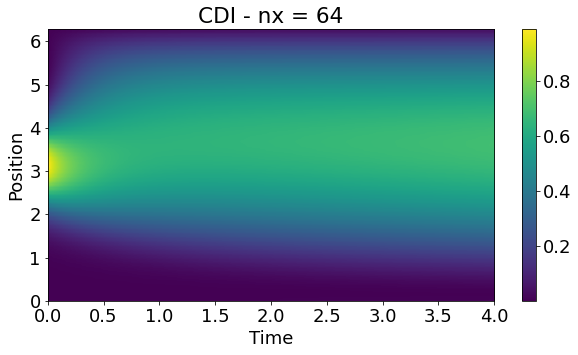

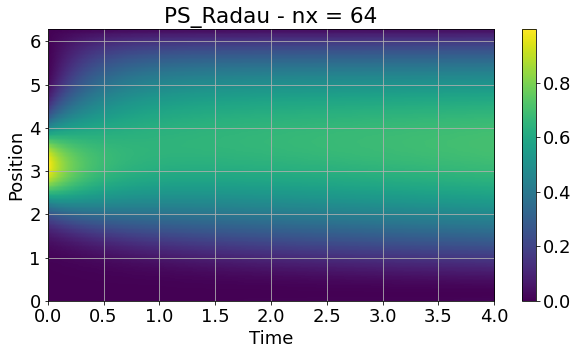

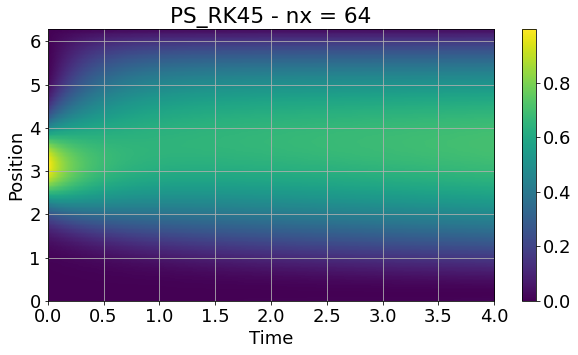

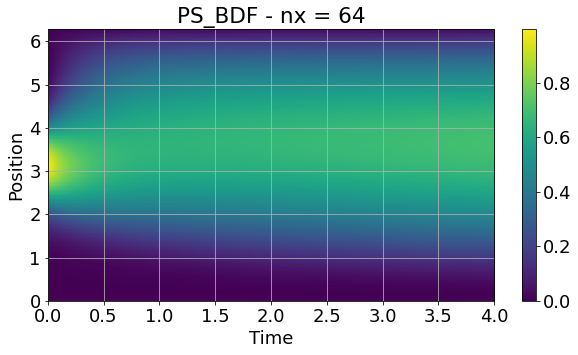

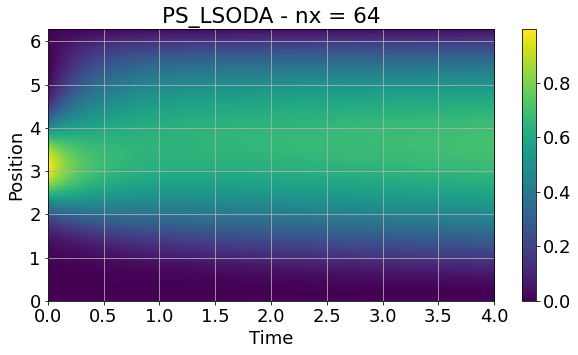

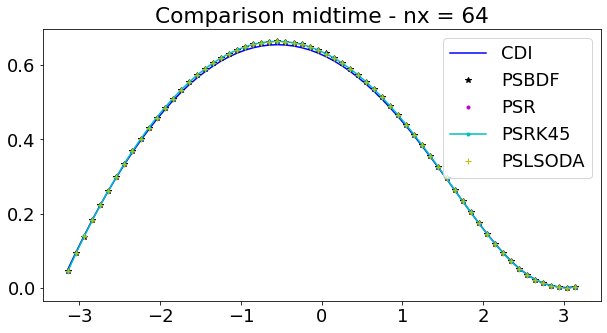

<Figure size 720x360 with 0 Axes>

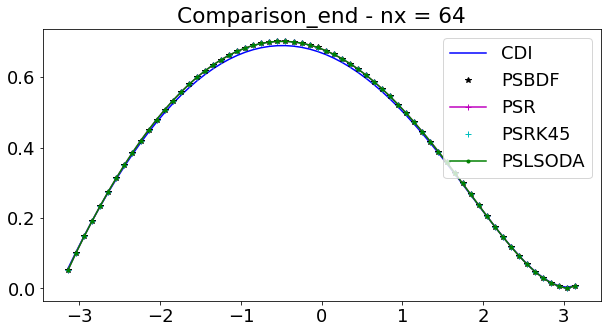

<Figure size 720x360 with 0 Axes>

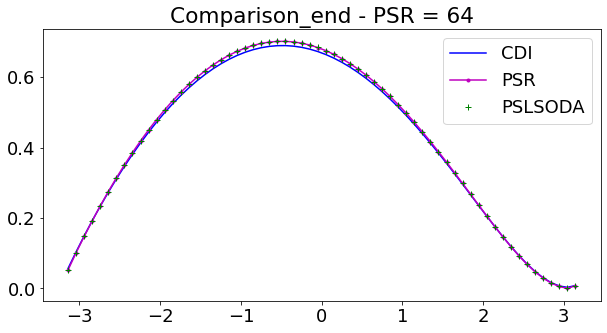

<Figure size 720x360 with 0 Axes>

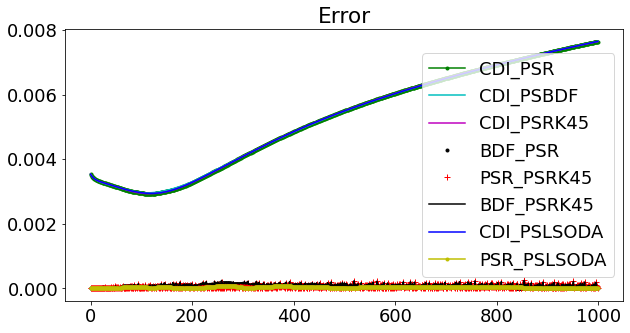

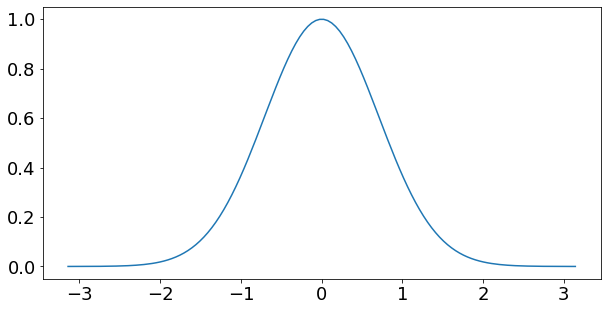

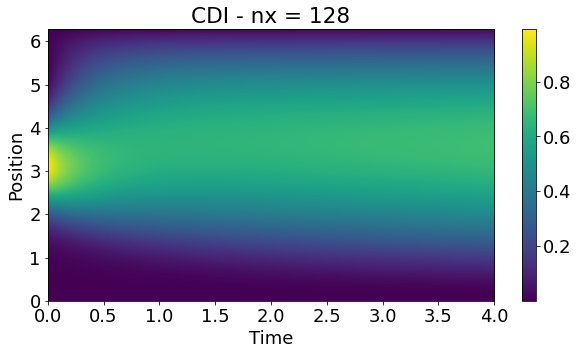

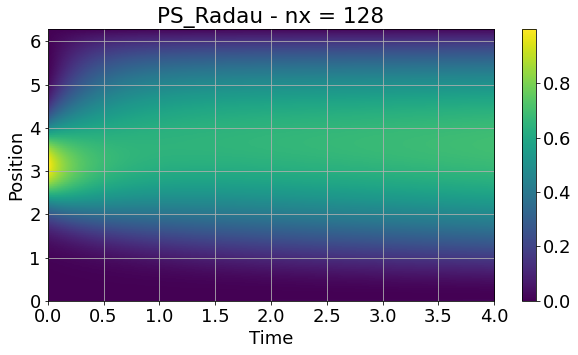

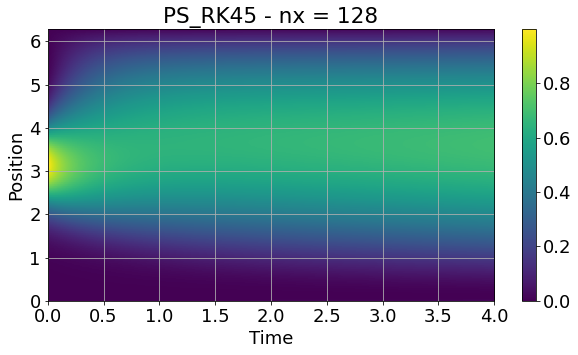

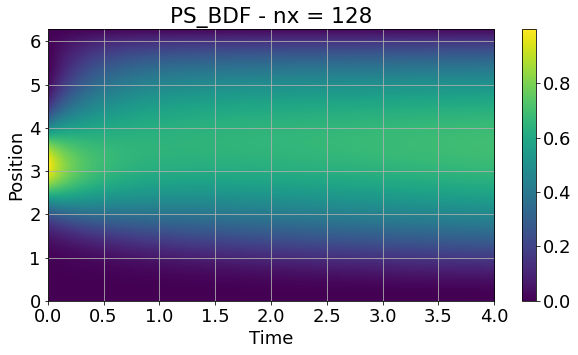

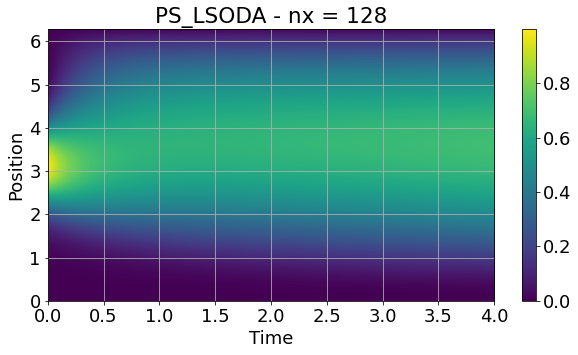

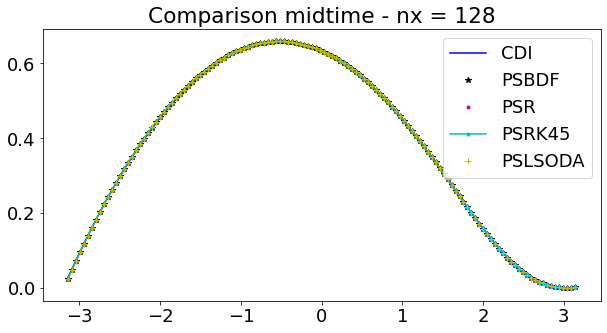

<Figure size 720x360 with 0 Axes>

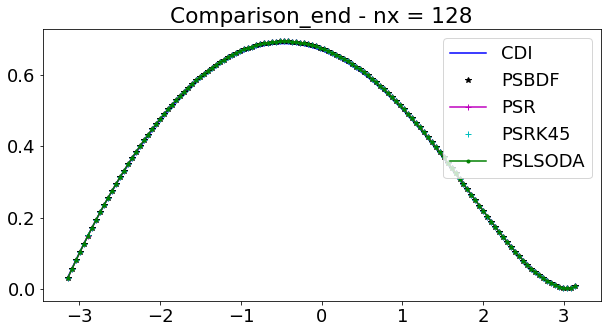

<Figure size 720x360 with 0 Axes>

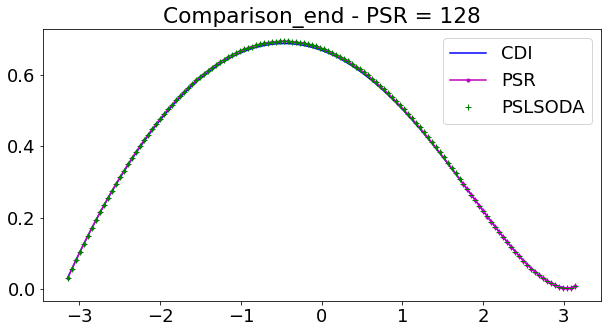

<Figure size 720x360 with 0 Axes>

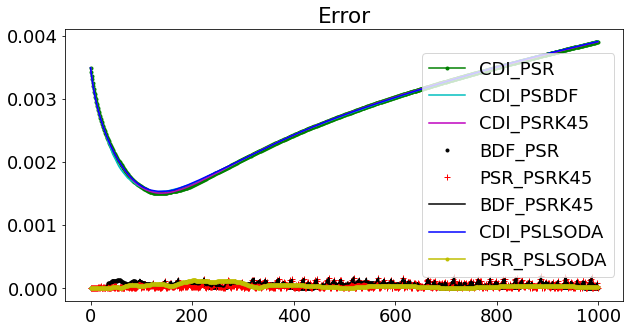

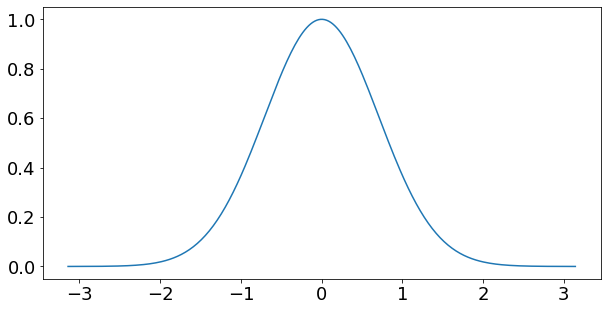

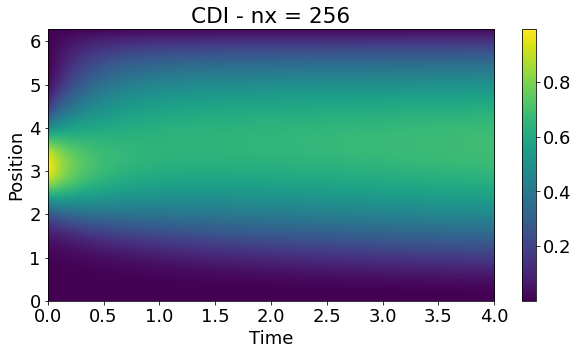

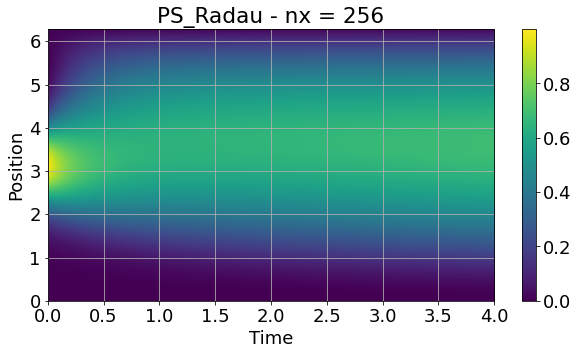

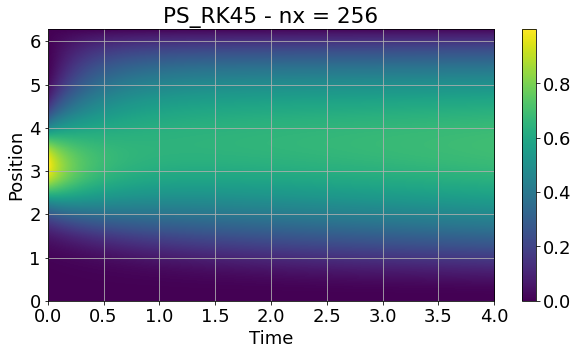

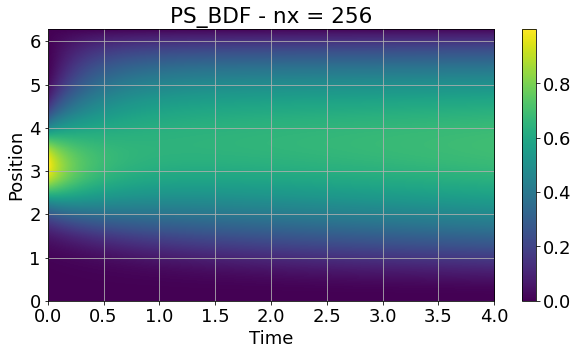

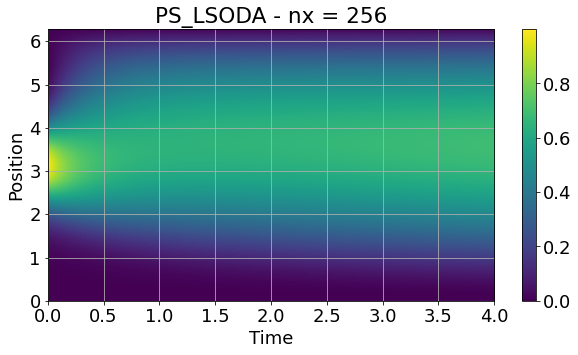

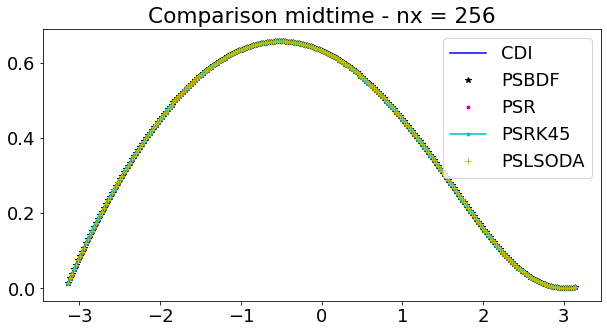

<Figure size 720x360 with 0 Axes>

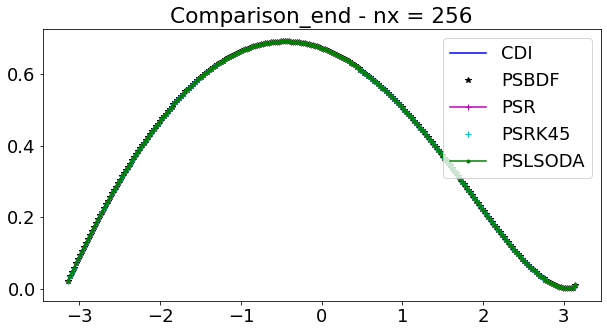

<Figure size 720x360 with 0 Axes>

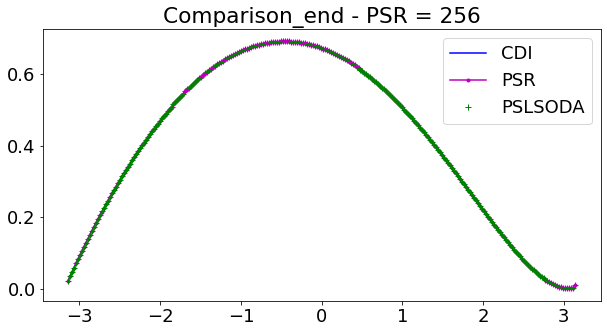

<Figure size 720x360 with 0 Axes>

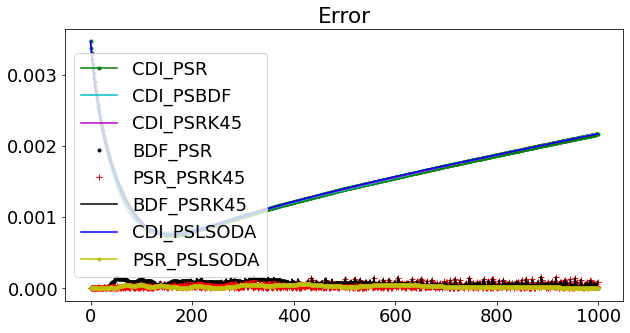

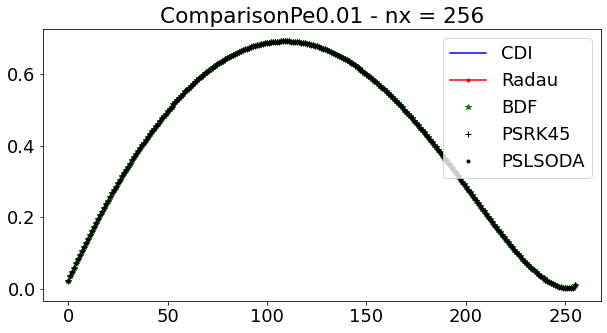

In [46]:
AL = 0.01
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =0.1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe0.01 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

# nt =100

In [47]:
# Setting up nx and nt
Nx = 32
nt = 100

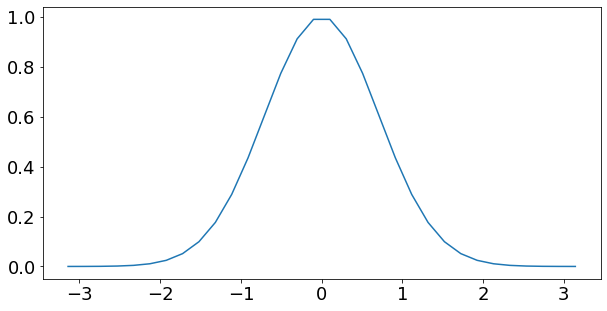

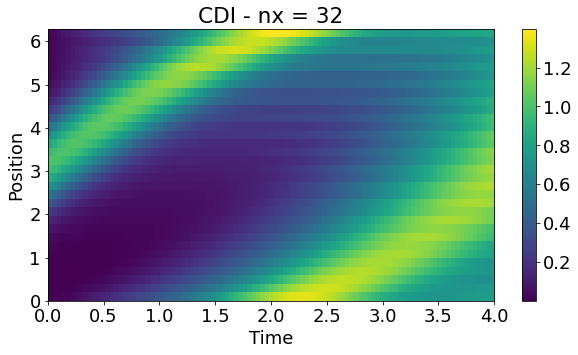

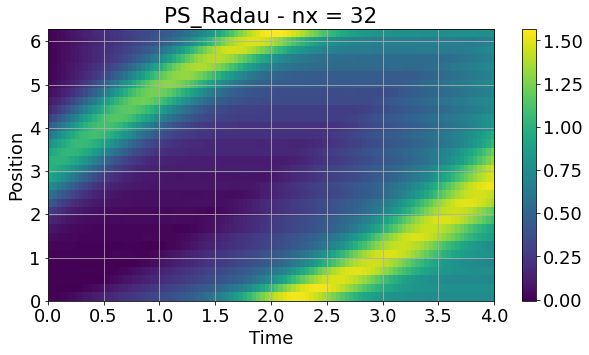

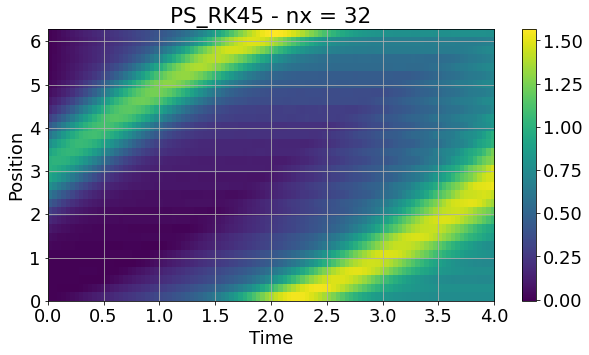

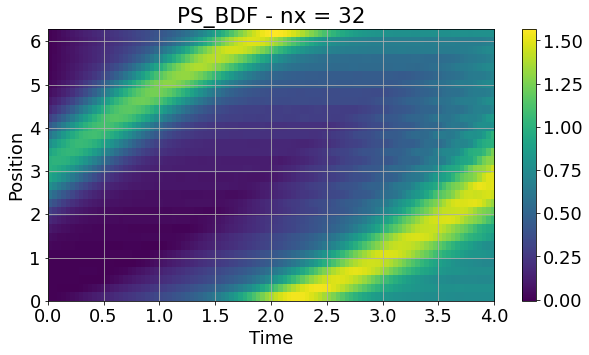

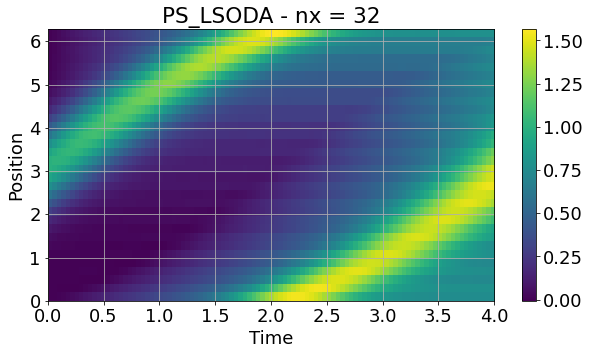

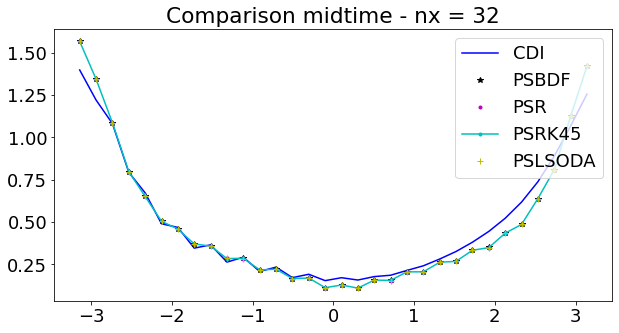

<Figure size 720x360 with 0 Axes>

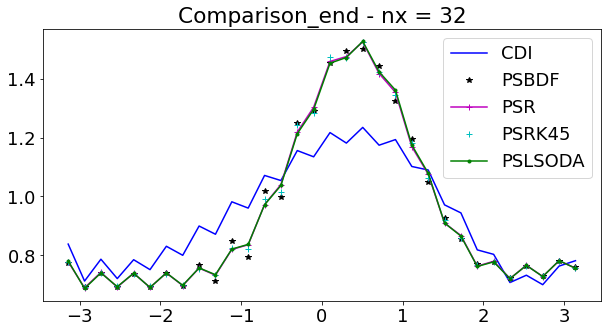

<Figure size 720x360 with 0 Axes>

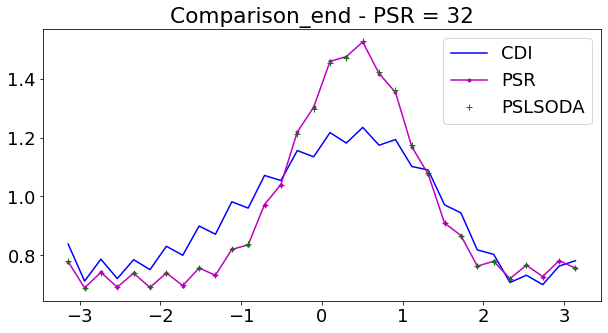

<Figure size 720x360 with 0 Axes>

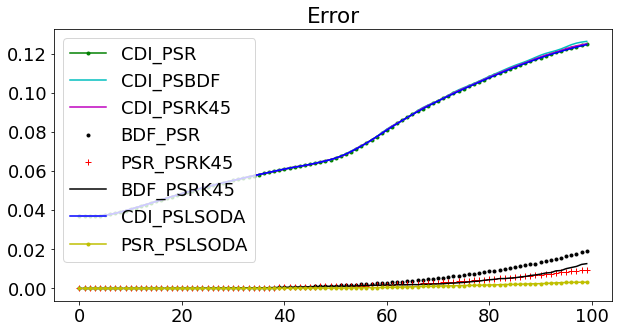

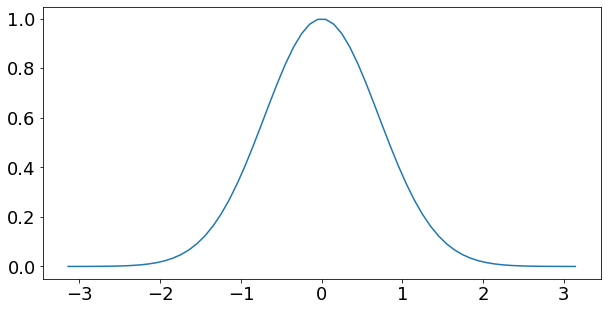

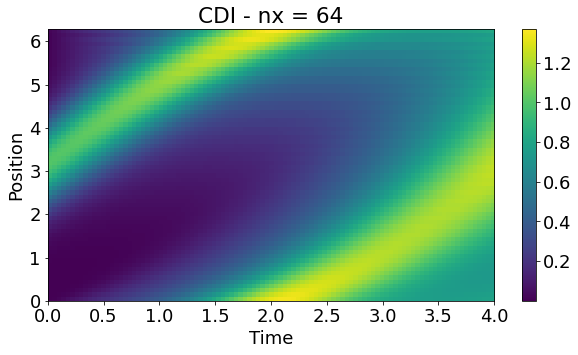

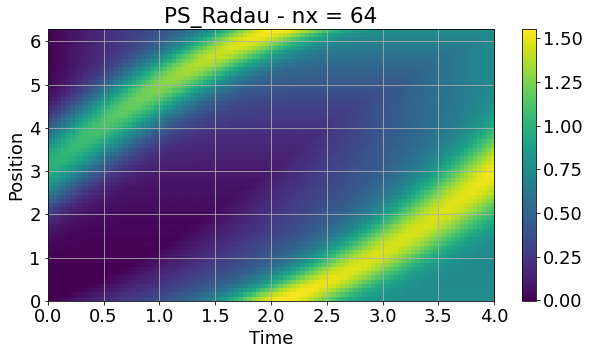

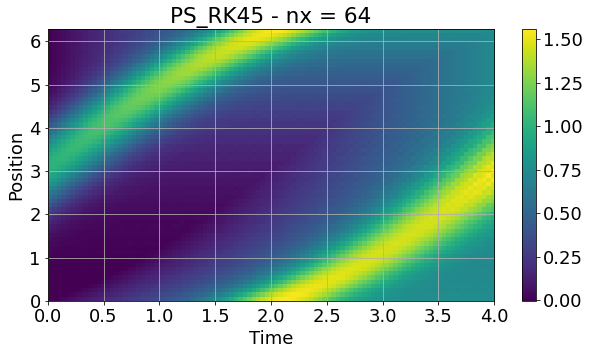

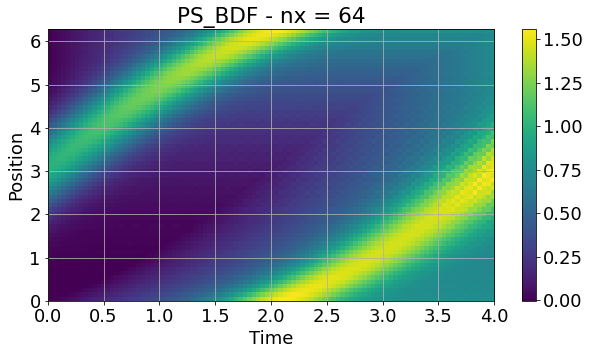

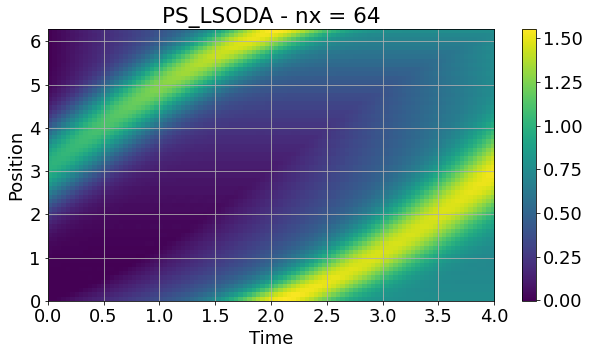

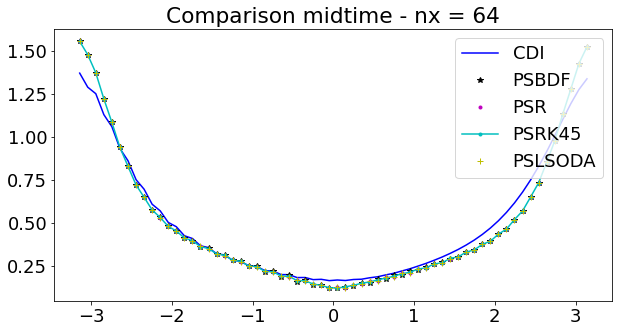

<Figure size 720x360 with 0 Axes>

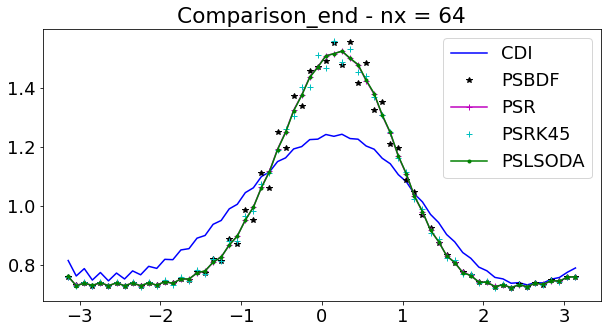

<Figure size 720x360 with 0 Axes>

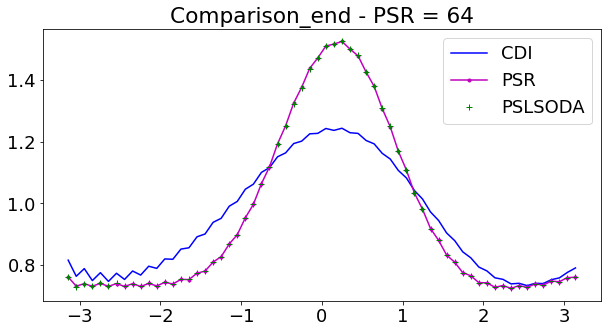

<Figure size 720x360 with 0 Axes>

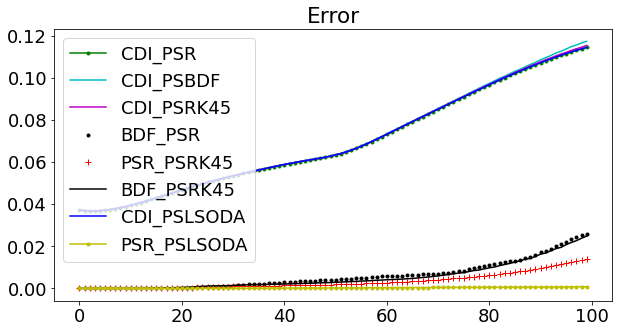

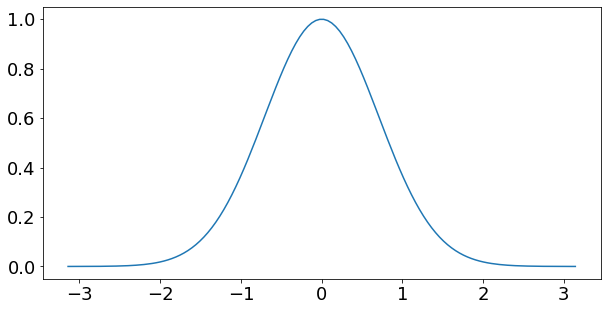

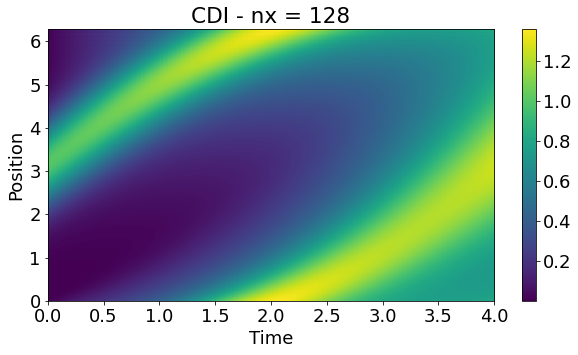

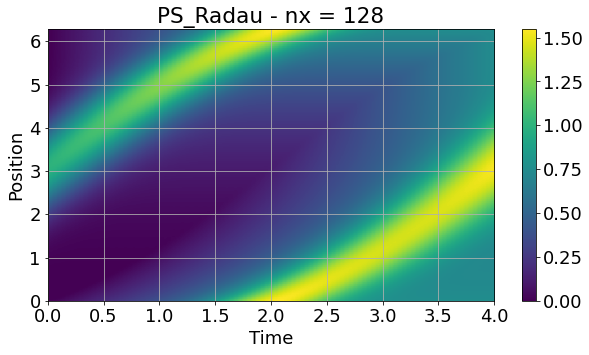

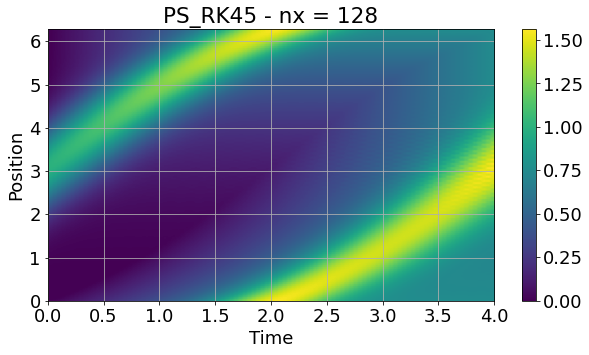

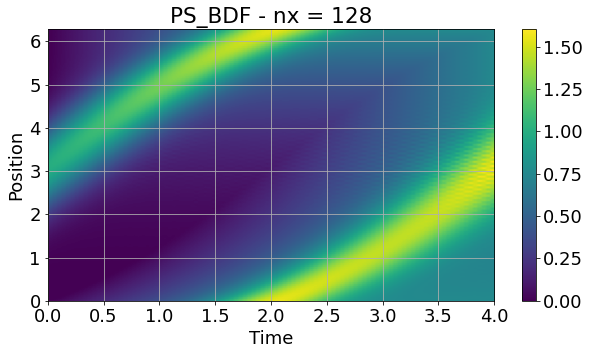

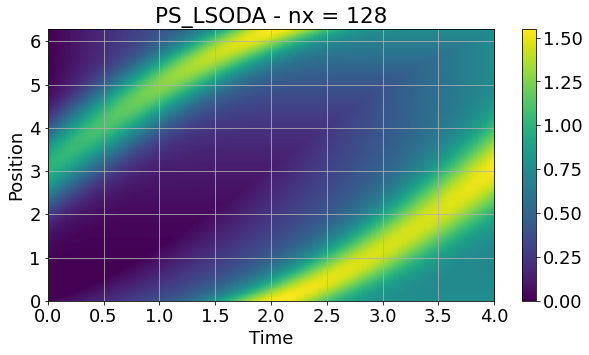

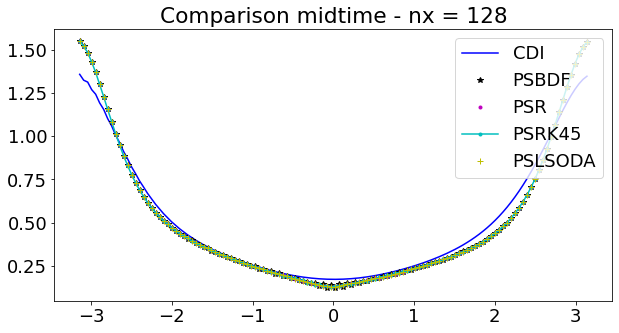

<Figure size 720x360 with 0 Axes>

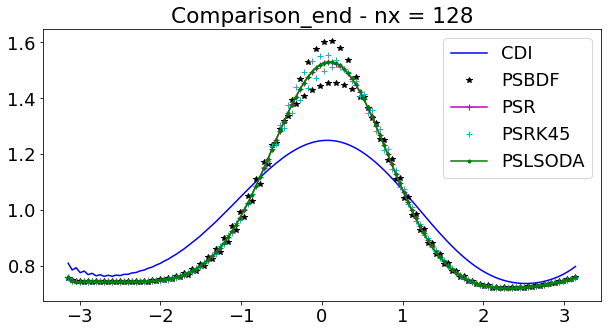

<Figure size 720x360 with 0 Axes>

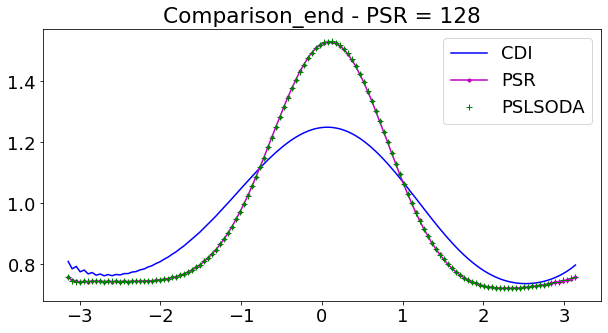

<Figure size 720x360 with 0 Axes>

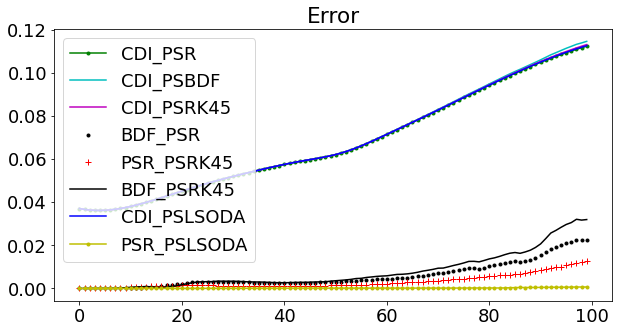

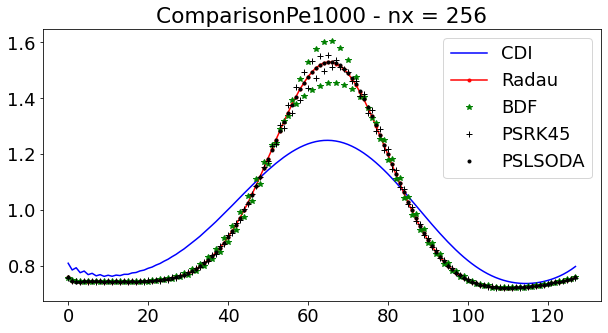

In [48]:
AL = 1.0
BL = 0.001
CL = 0.1
DL = 0.2
# Pe =100

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe1000 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

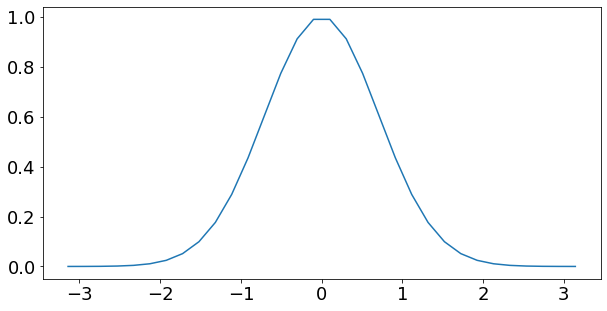

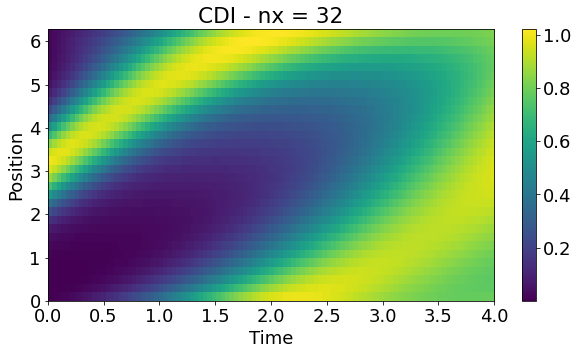

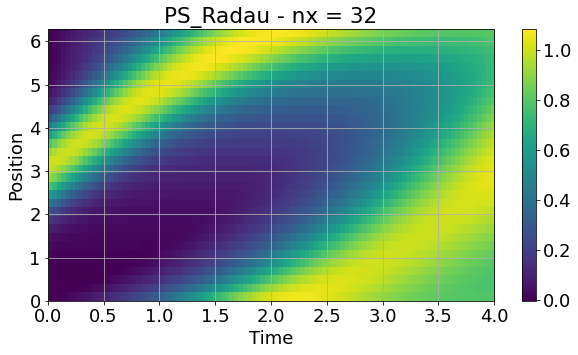

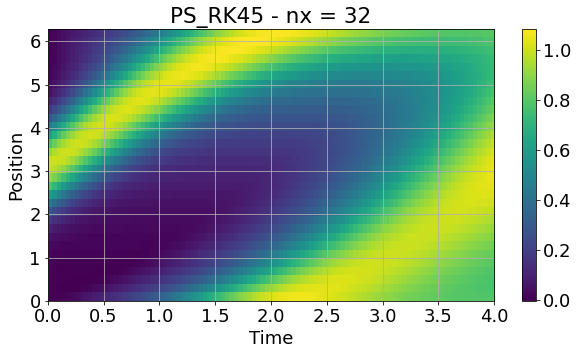

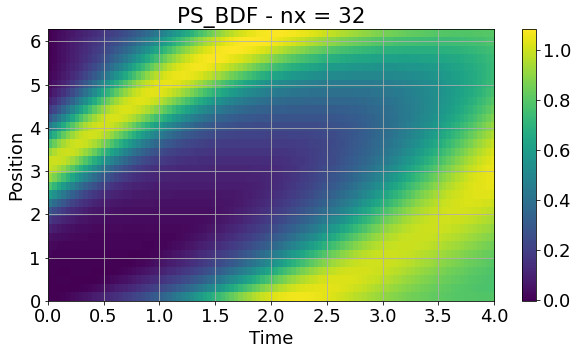

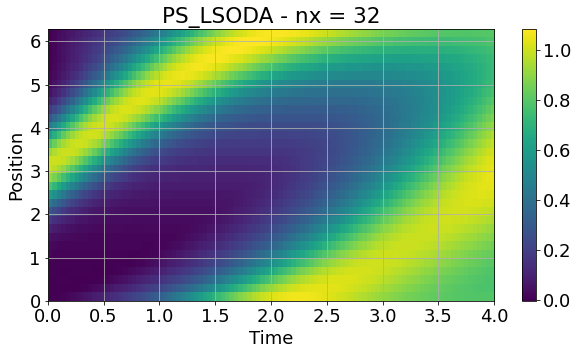

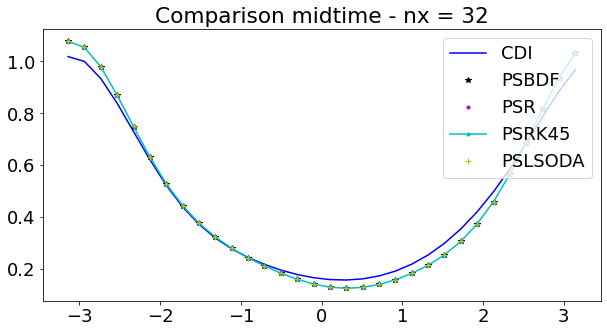

<Figure size 720x360 with 0 Axes>

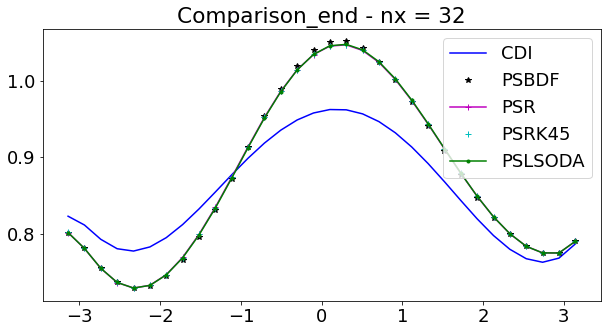

<Figure size 720x360 with 0 Axes>

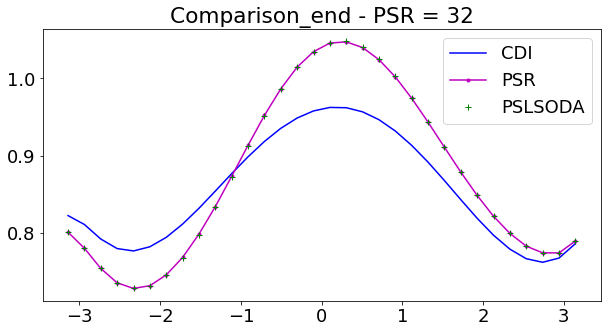

<Figure size 720x360 with 0 Axes>

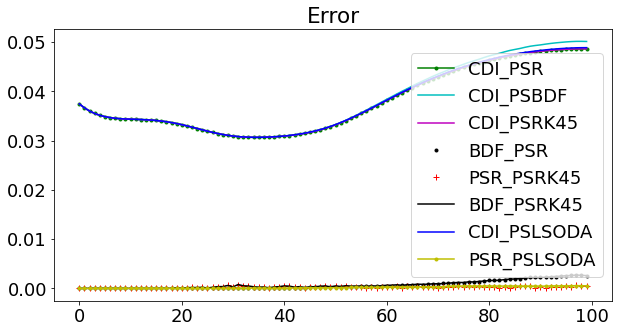

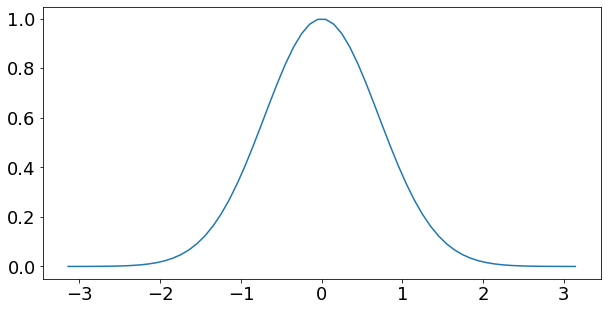

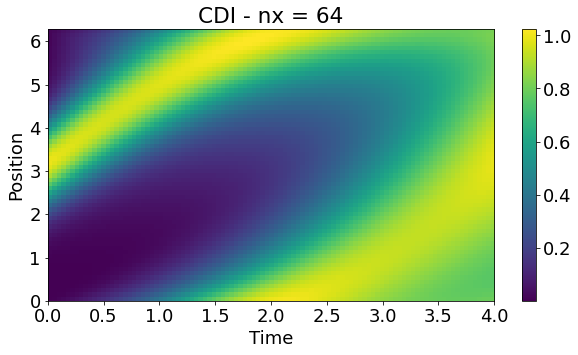

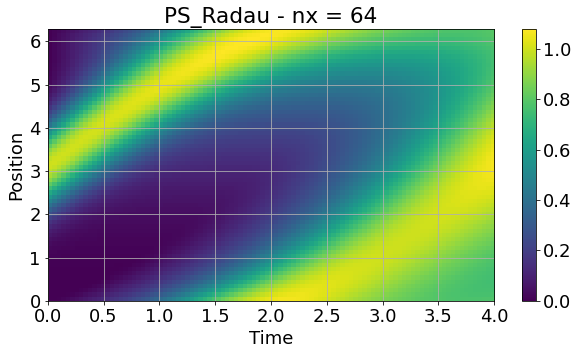

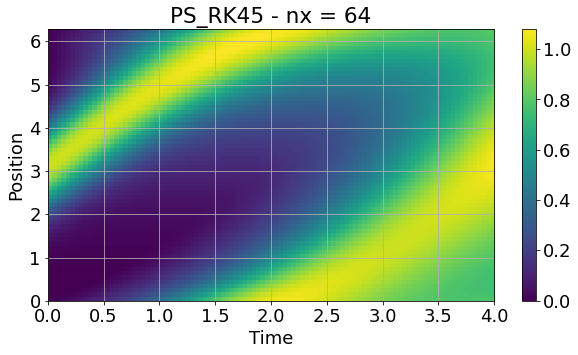

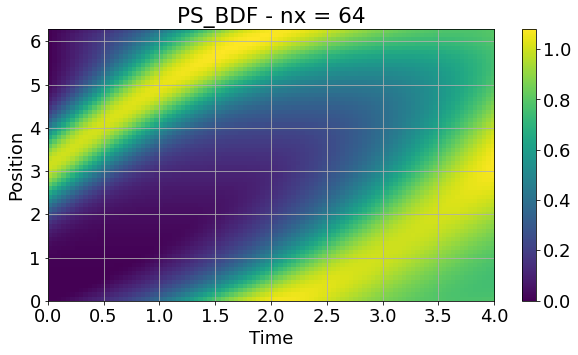

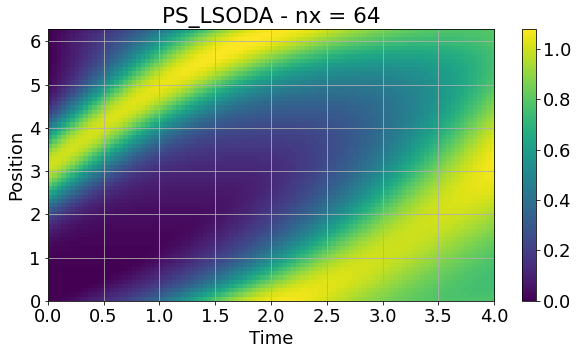

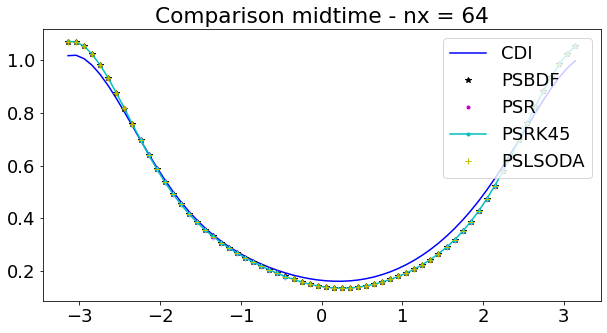

<Figure size 720x360 with 0 Axes>

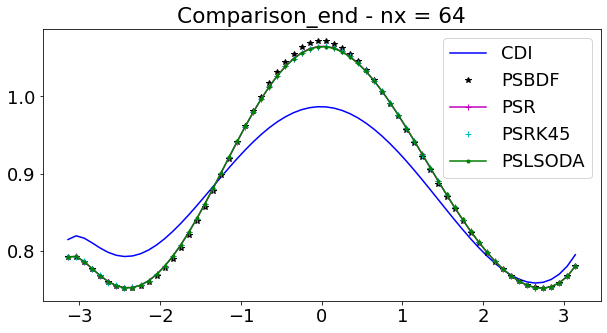

<Figure size 720x360 with 0 Axes>

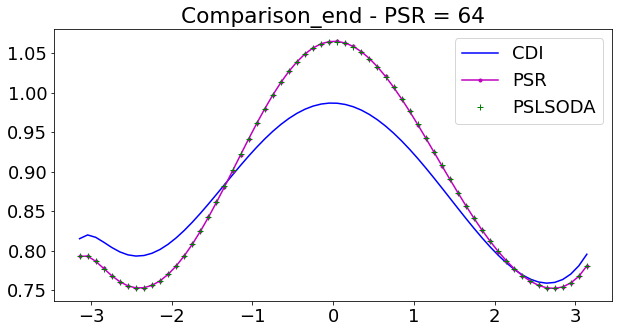

<Figure size 720x360 with 0 Axes>

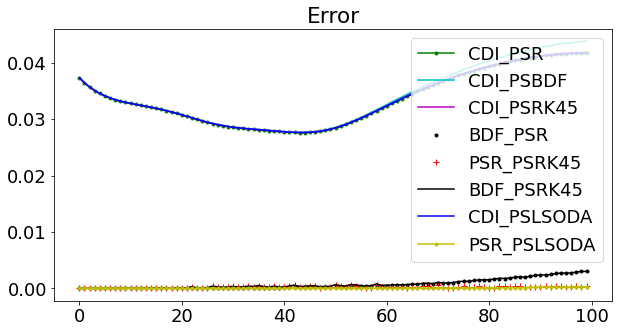

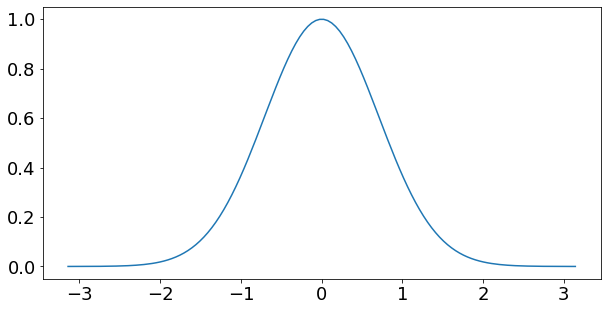

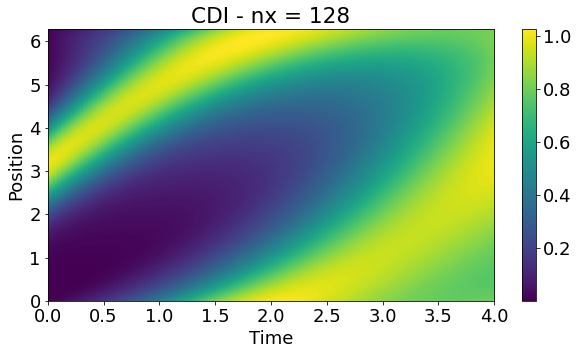

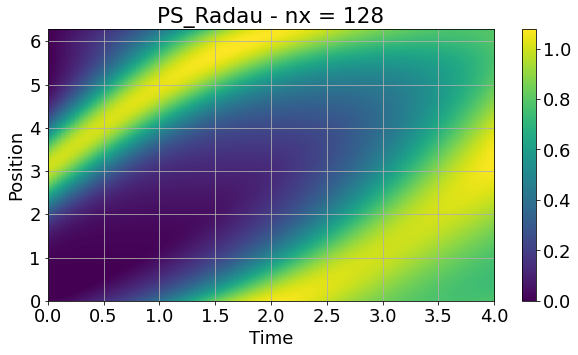

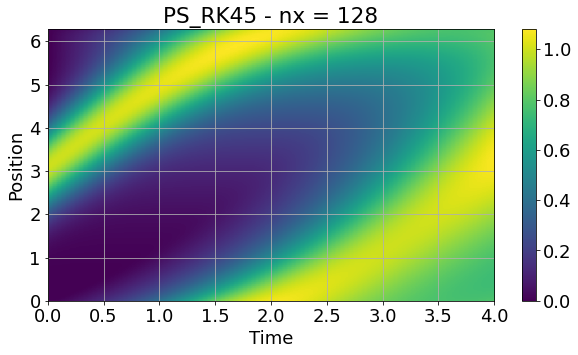

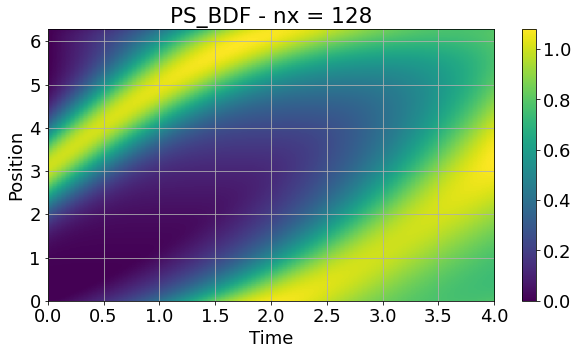

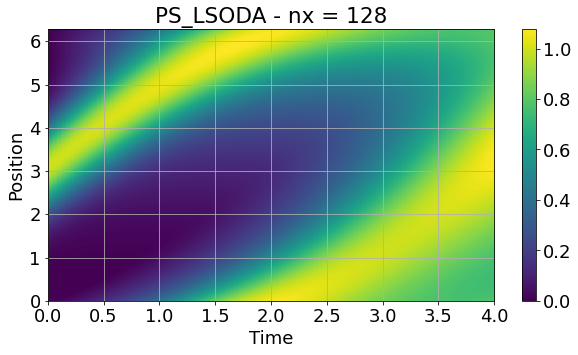

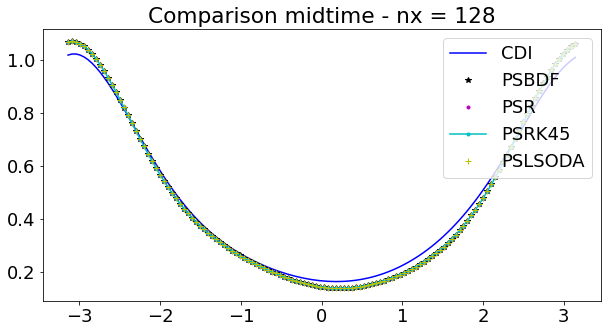

<Figure size 720x360 with 0 Axes>

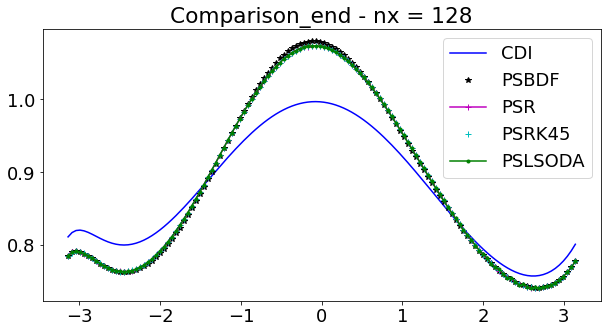

<Figure size 720x360 with 0 Axes>

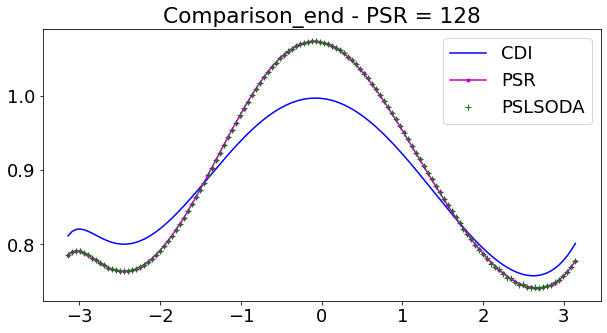

<Figure size 720x360 with 0 Axes>

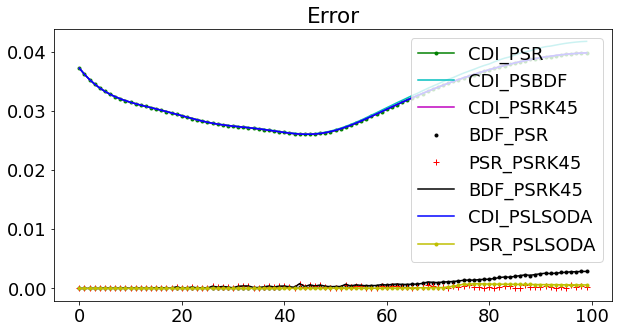

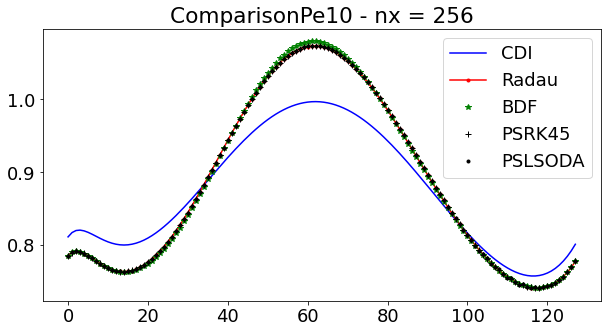

In [49]:
AL = 1.0
BL = 0.1
CL = 0.1
DL = 0.2
# Pe =10
th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe10 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

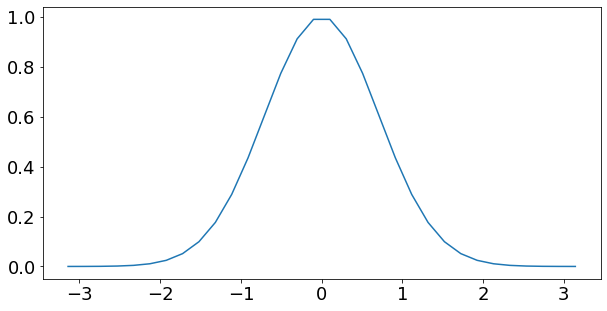

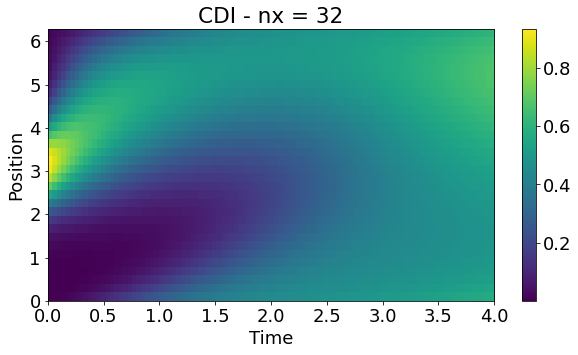

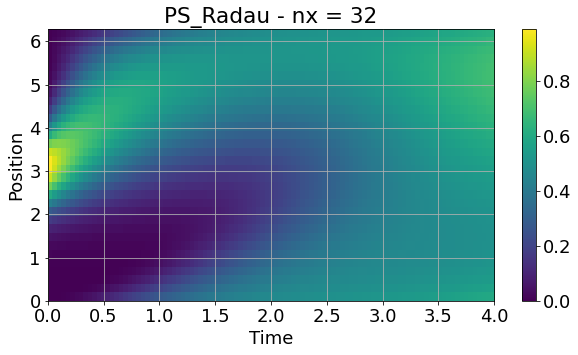

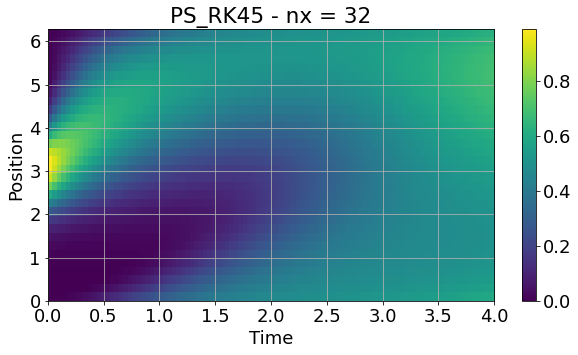

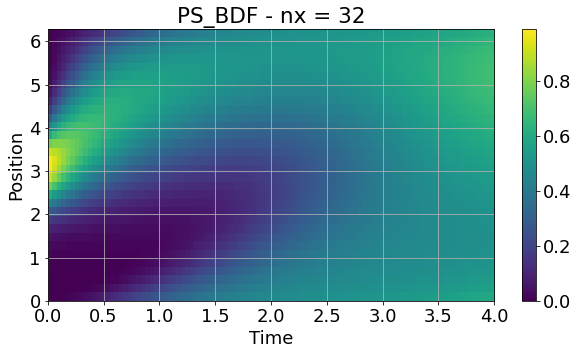

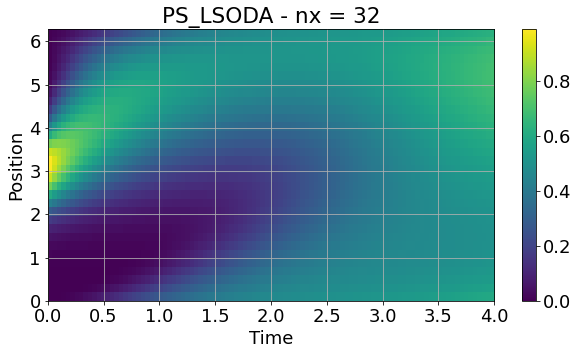

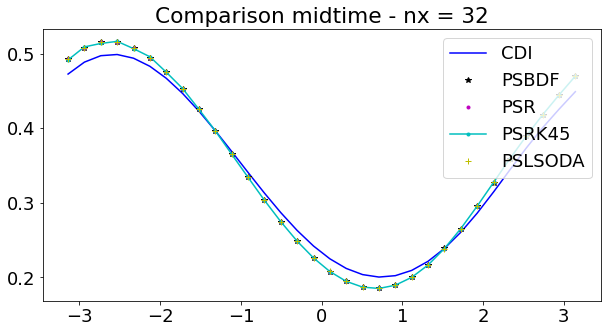

<Figure size 720x360 with 0 Axes>

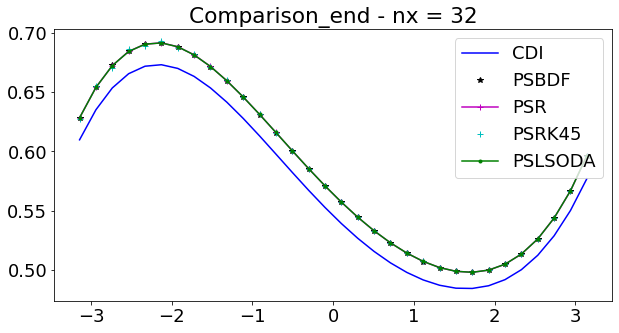

<Figure size 720x360 with 0 Axes>

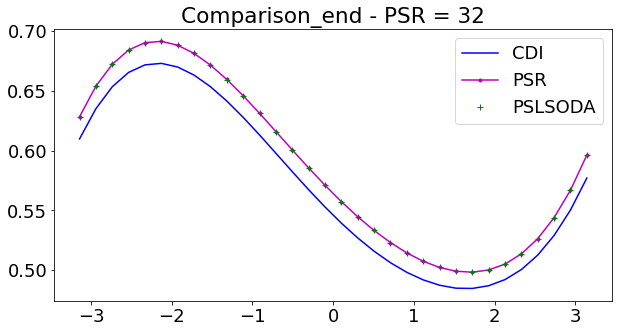

<Figure size 720x360 with 0 Axes>

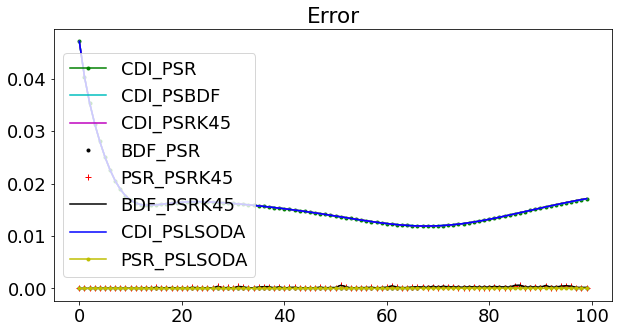

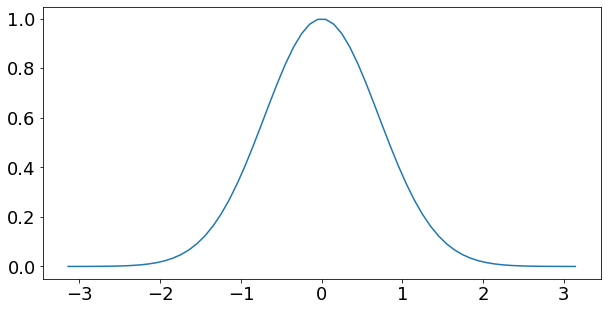

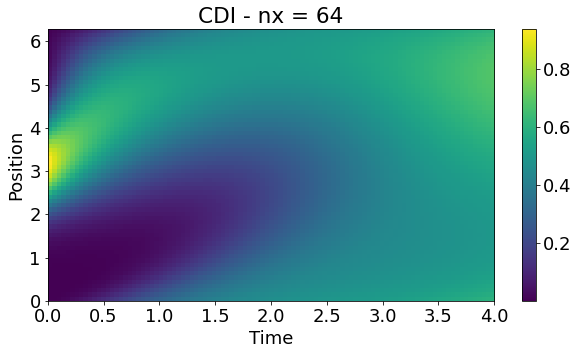

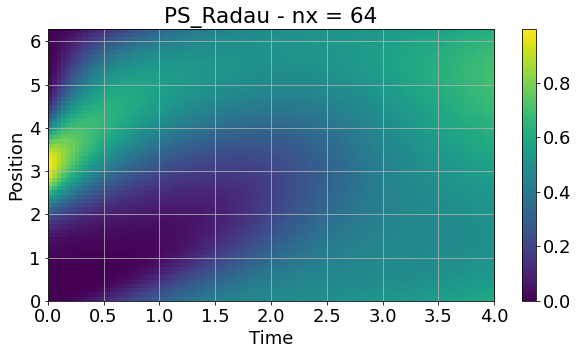

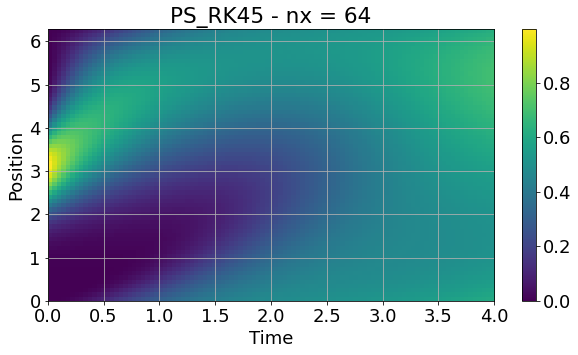

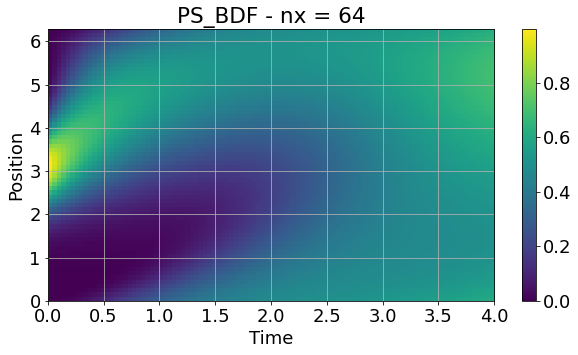

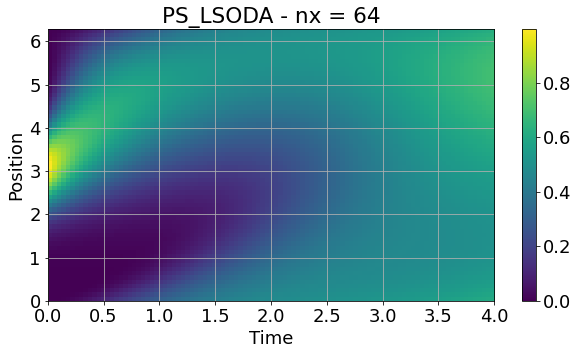

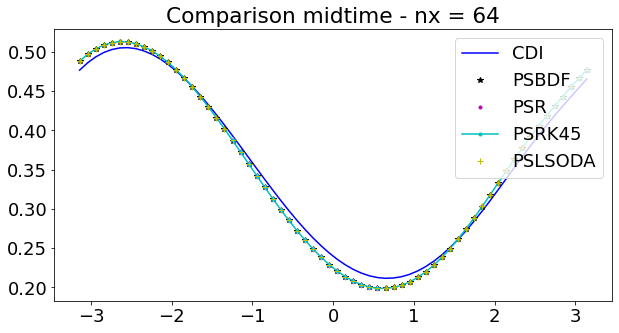

<Figure size 720x360 with 0 Axes>

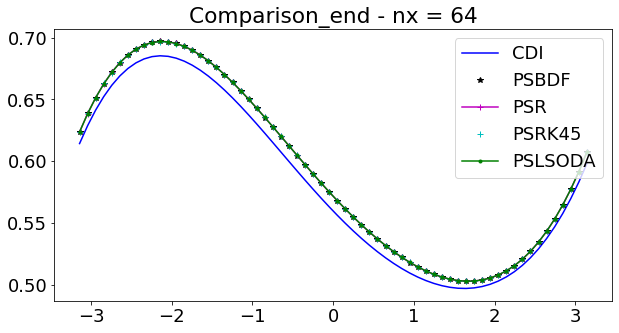

<Figure size 720x360 with 0 Axes>

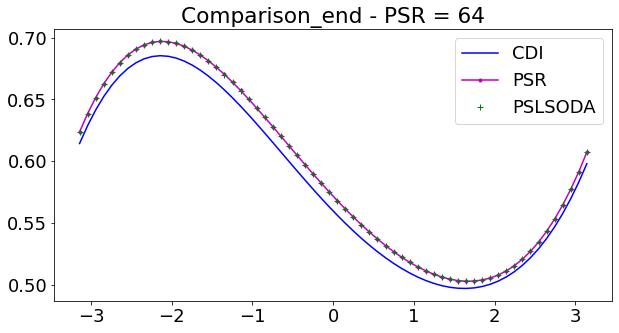

<Figure size 720x360 with 0 Axes>

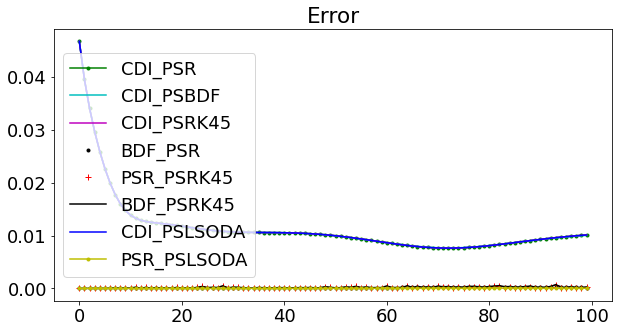

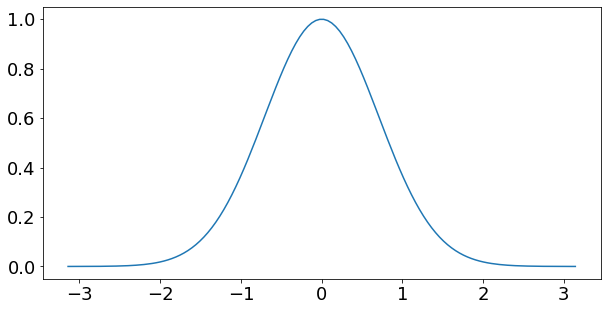

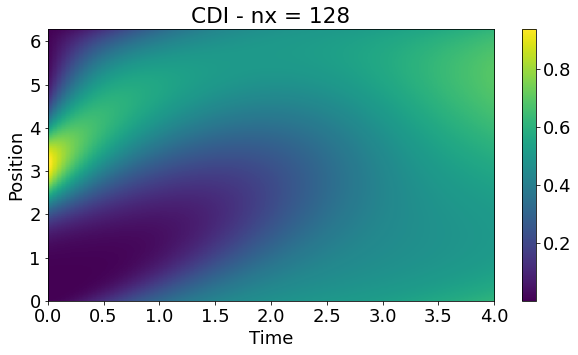

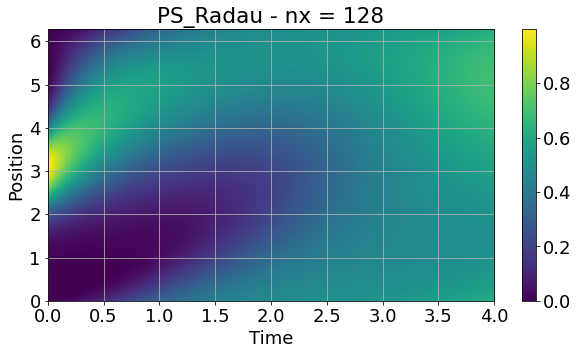

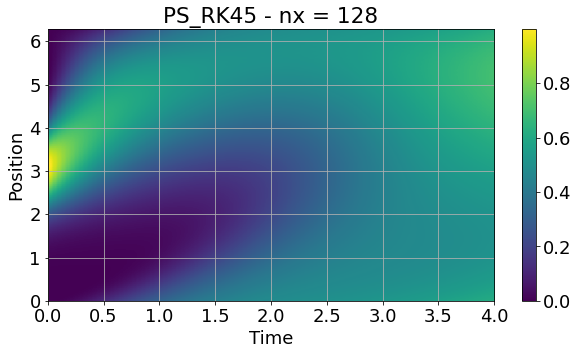

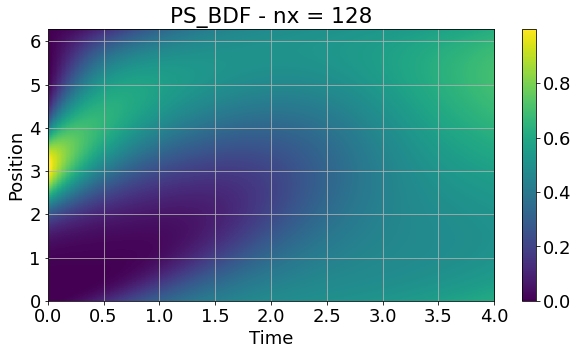

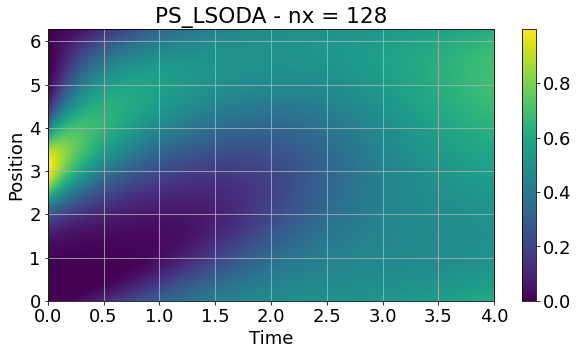

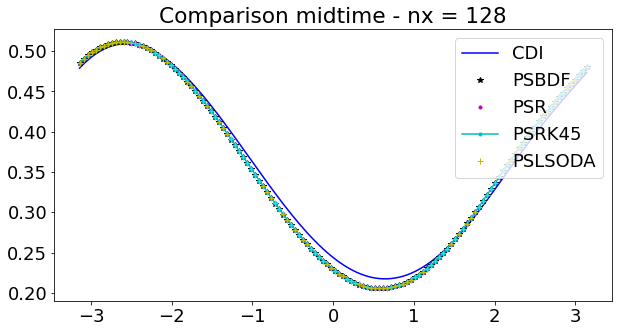

<Figure size 720x360 with 0 Axes>

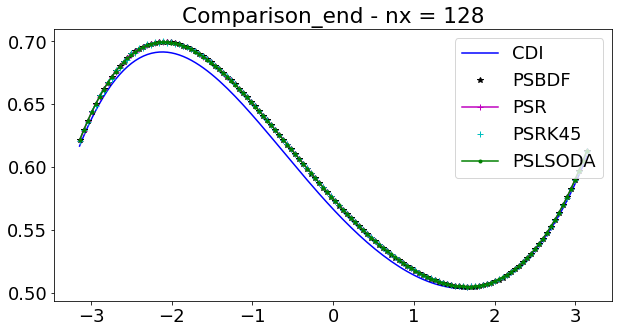

<Figure size 720x360 with 0 Axes>

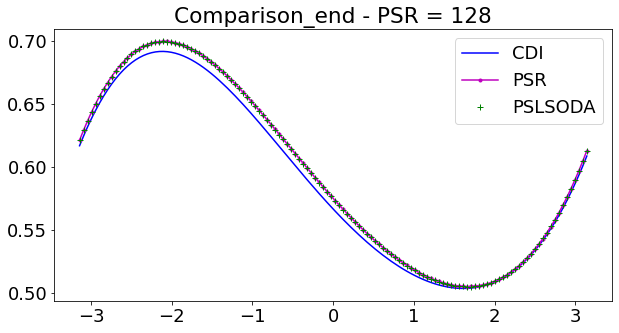

<Figure size 720x360 with 0 Axes>

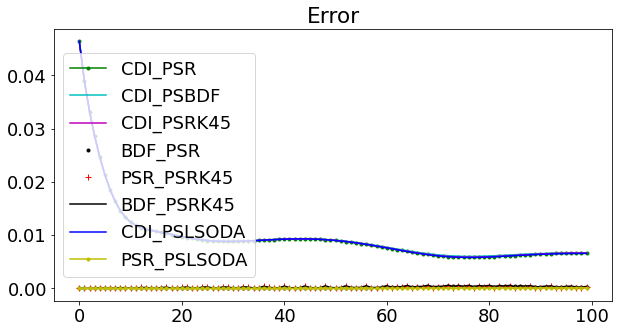

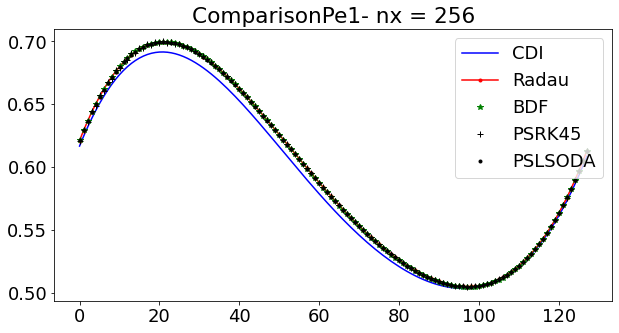

In [50]:
AL = 1.0
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)


res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe1- nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()


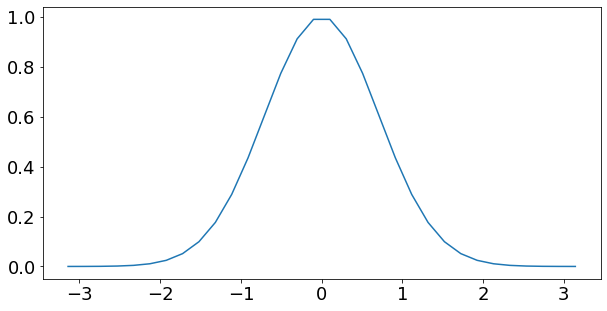

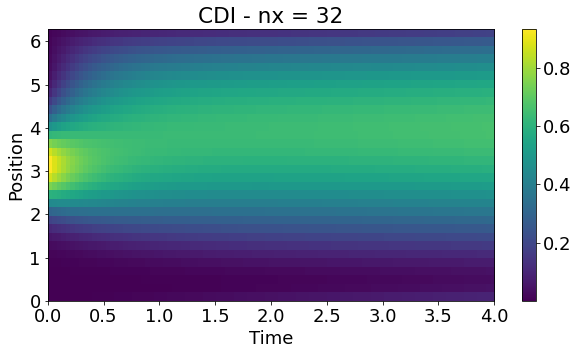

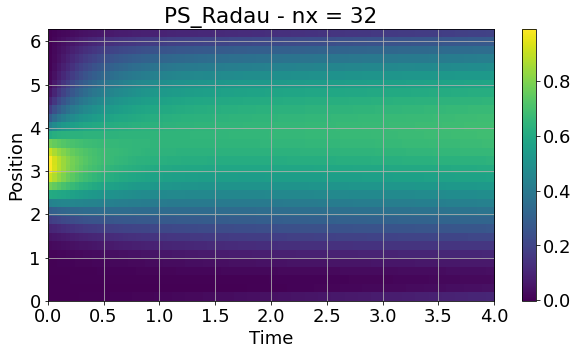

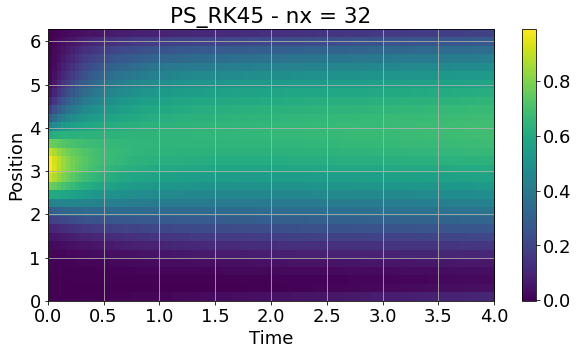

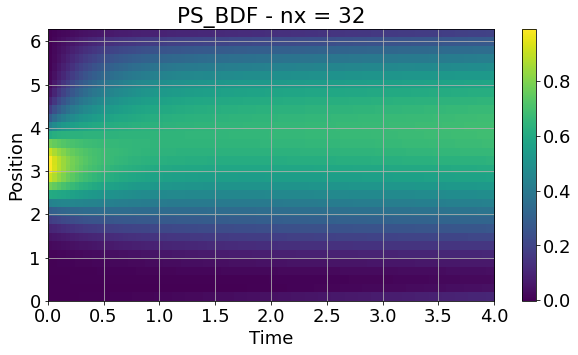

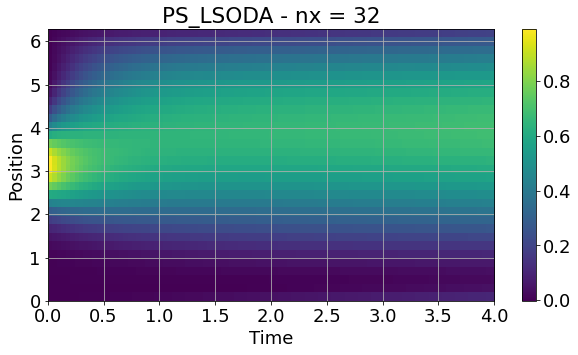

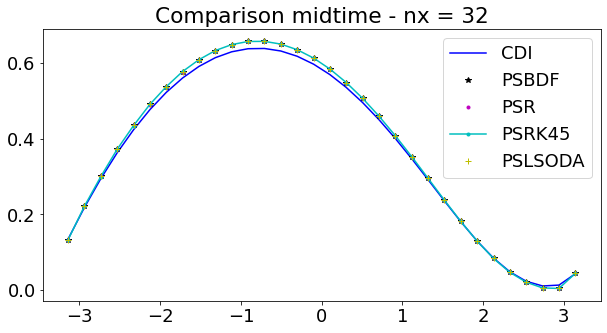

<Figure size 720x360 with 0 Axes>

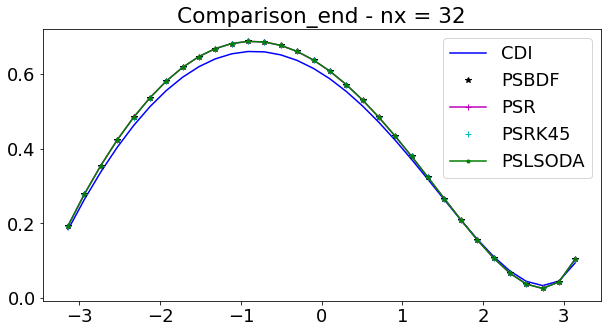

<Figure size 720x360 with 0 Axes>

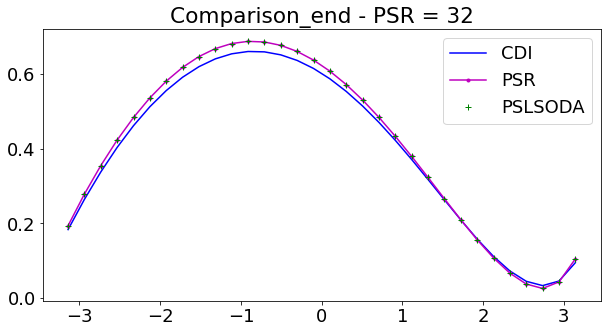

<Figure size 720x360 with 0 Axes>

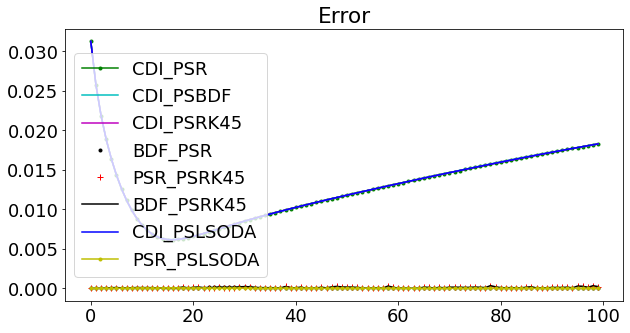

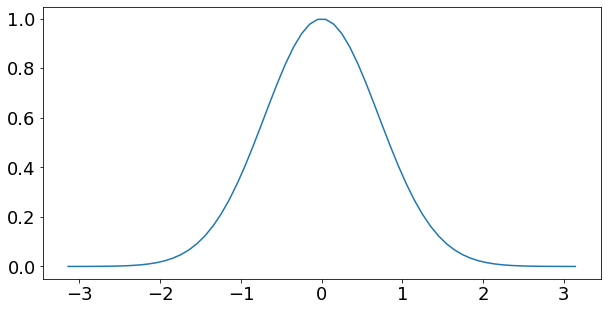

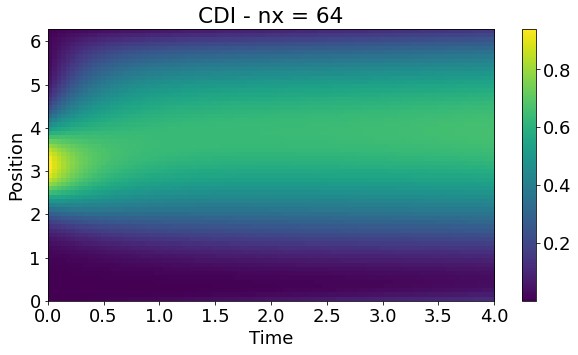

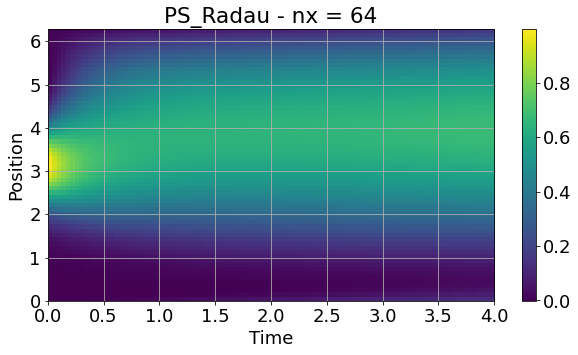

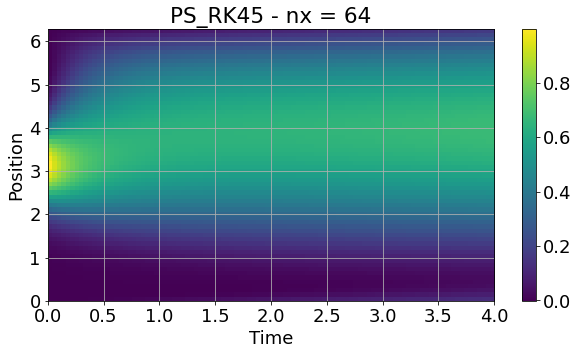

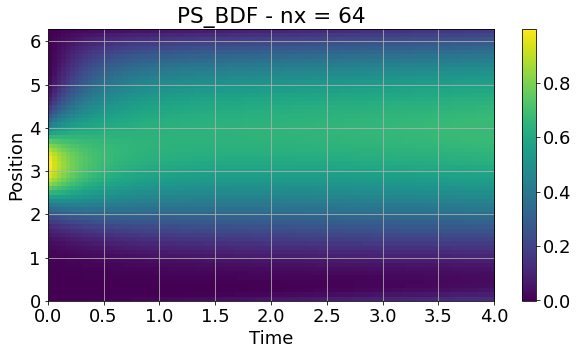

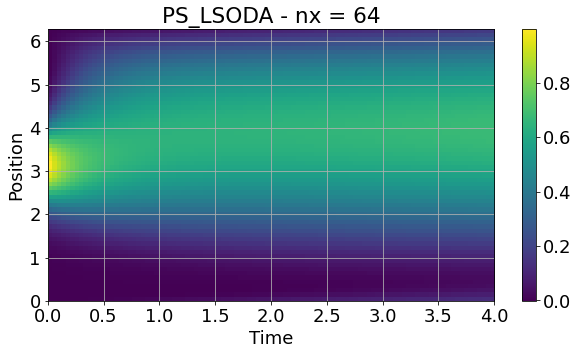

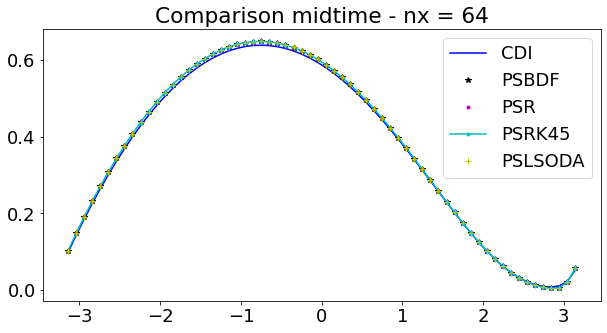

<Figure size 720x360 with 0 Axes>

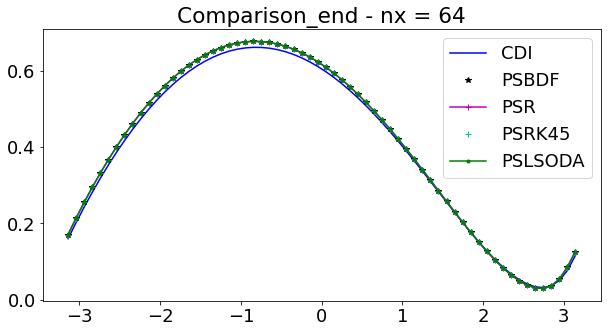

<Figure size 720x360 with 0 Axes>

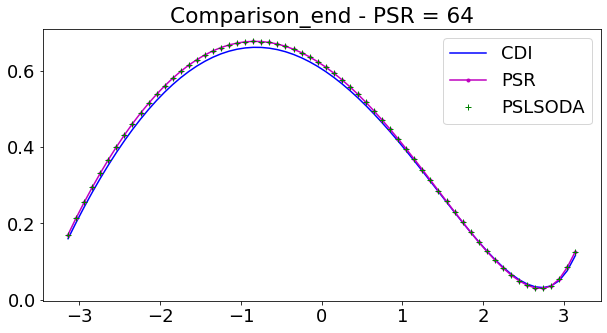

<Figure size 720x360 with 0 Axes>

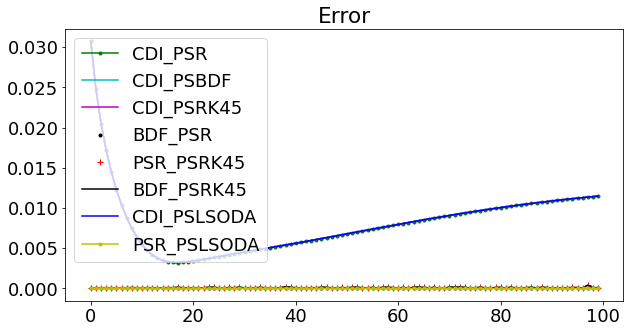

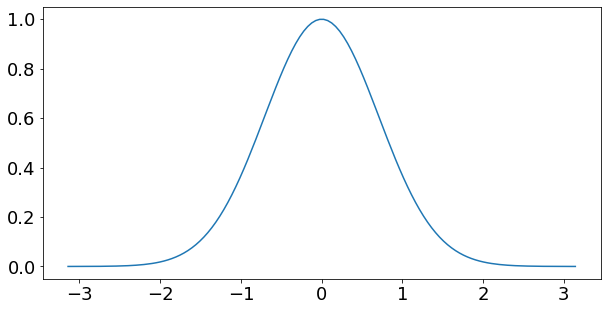

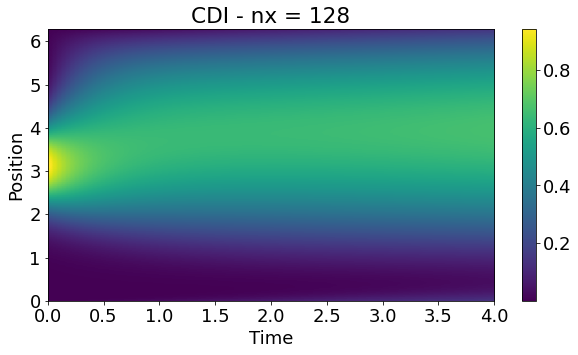

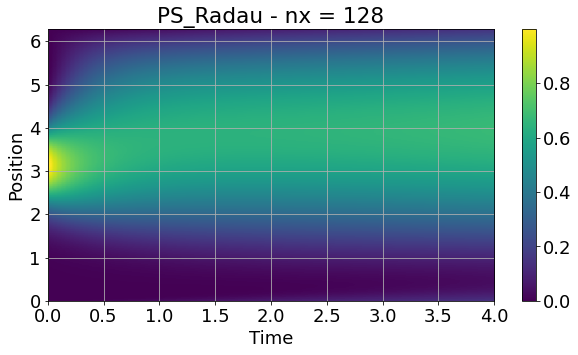

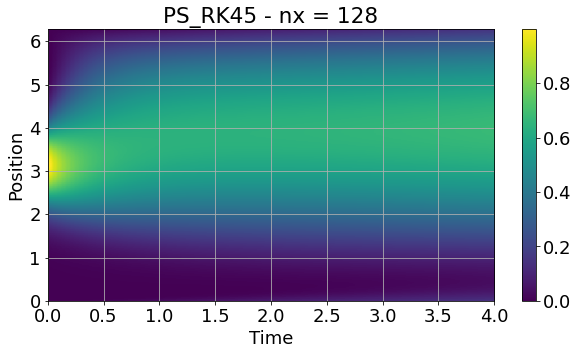

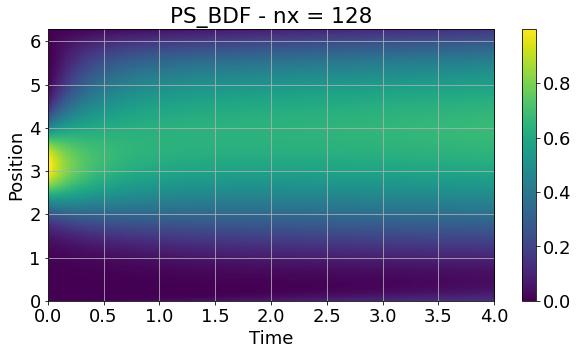

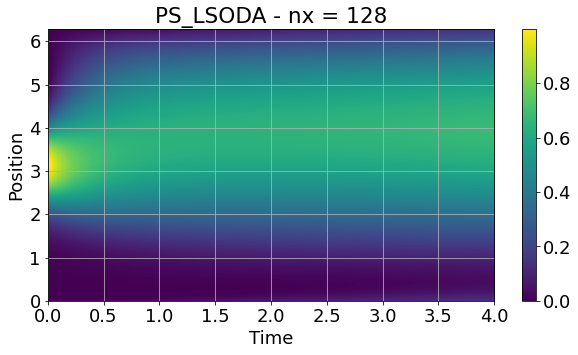

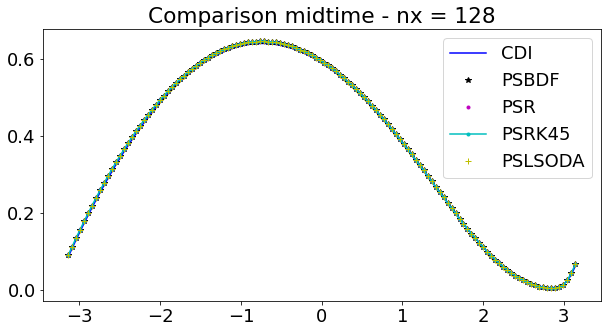

<Figure size 720x360 with 0 Axes>

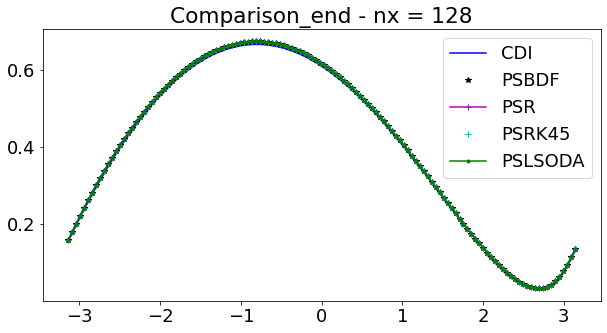

<Figure size 720x360 with 0 Axes>

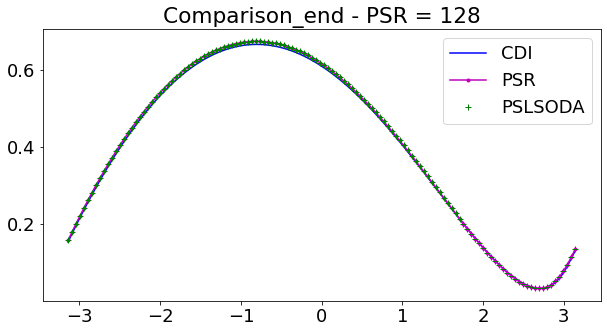

<Figure size 720x360 with 0 Axes>

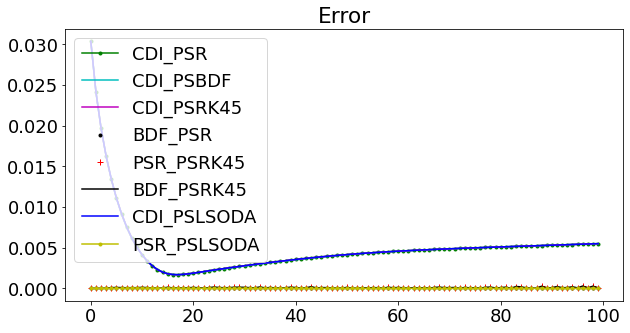

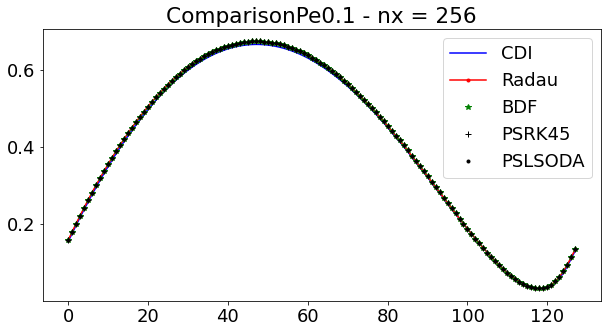

In [51]:

AL = 0.1
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =0.1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe0.1 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()


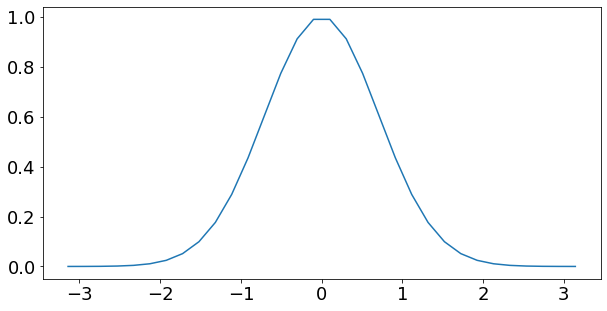

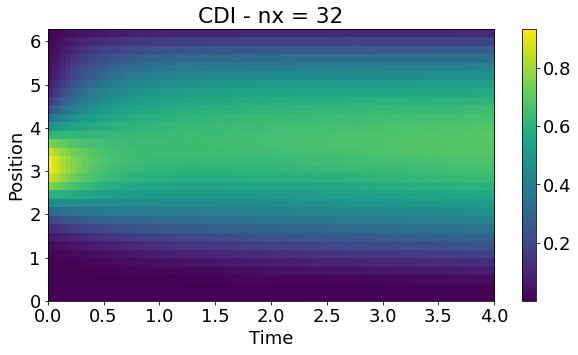

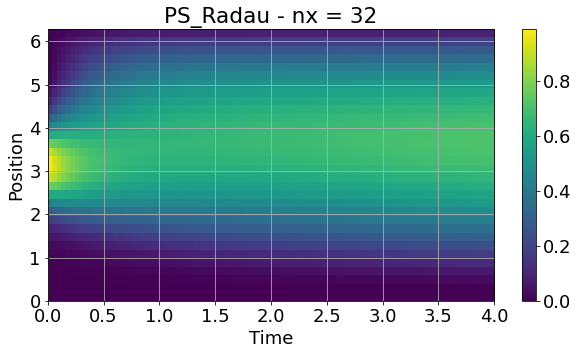

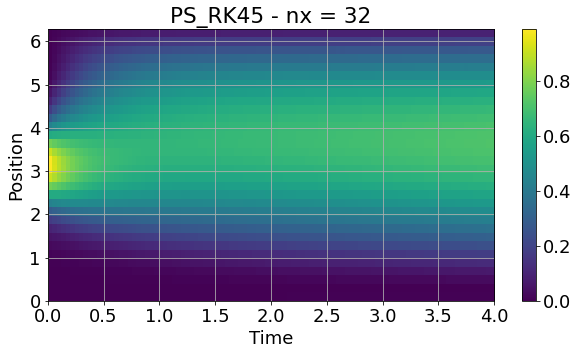

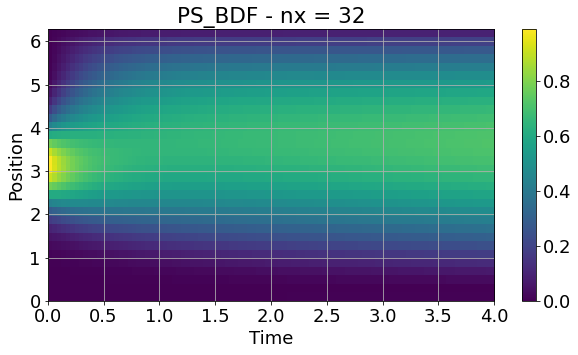

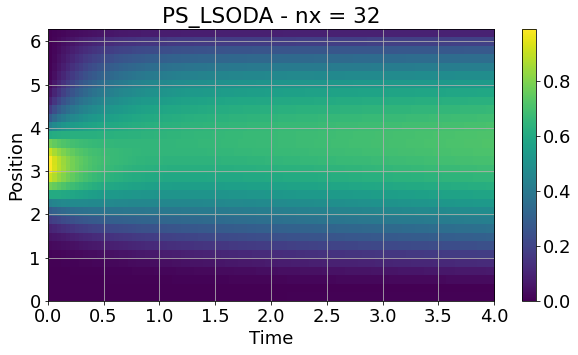

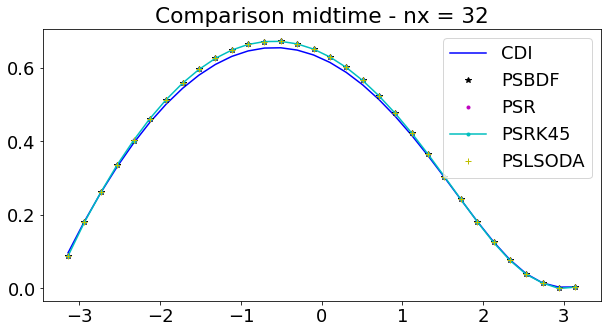

<Figure size 720x360 with 0 Axes>

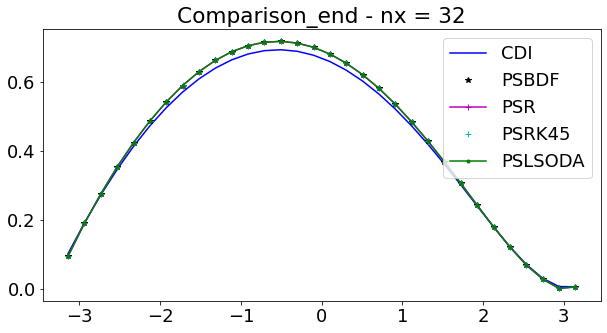

<Figure size 720x360 with 0 Axes>

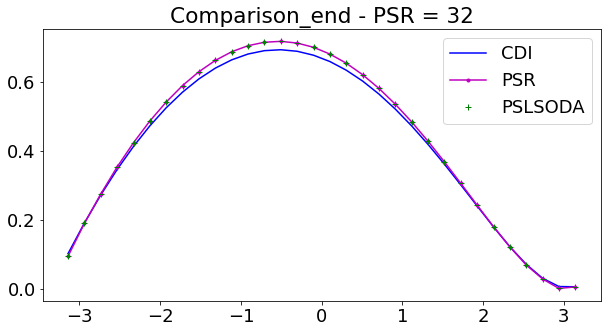

<Figure size 720x360 with 0 Axes>

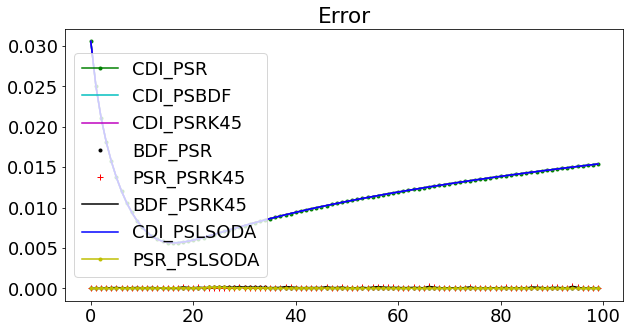

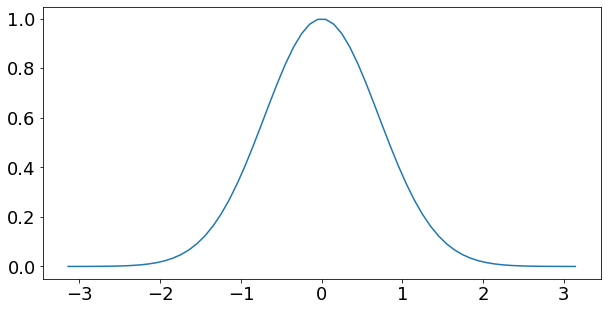

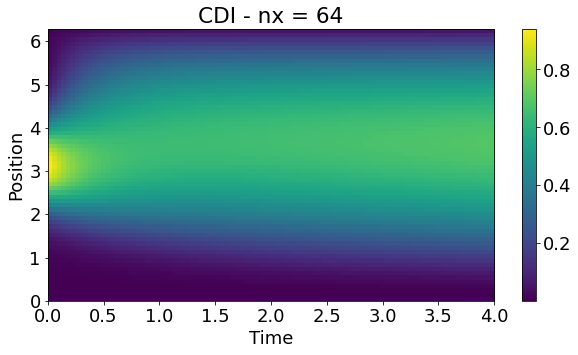

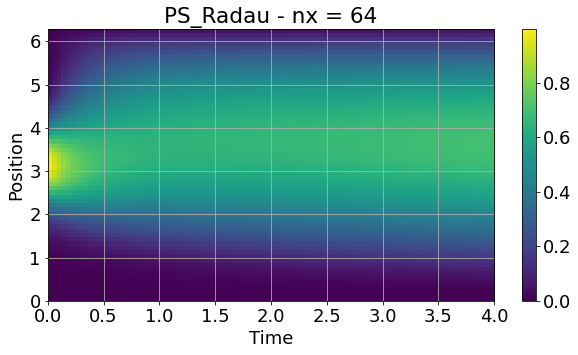

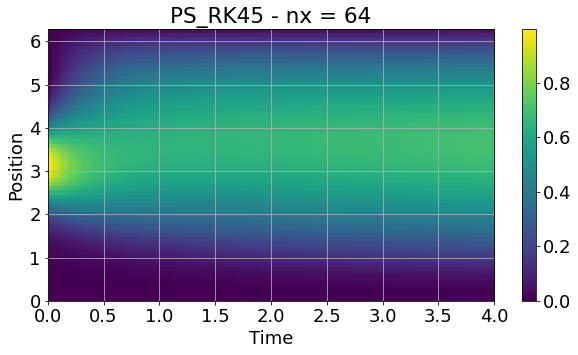

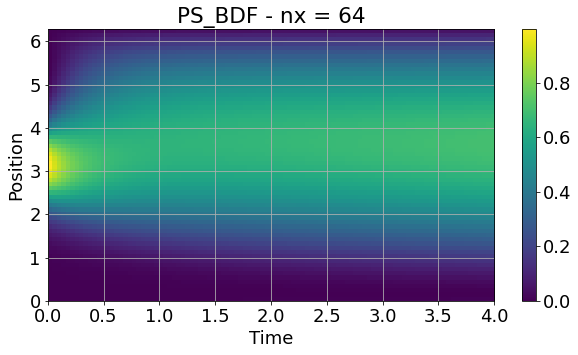

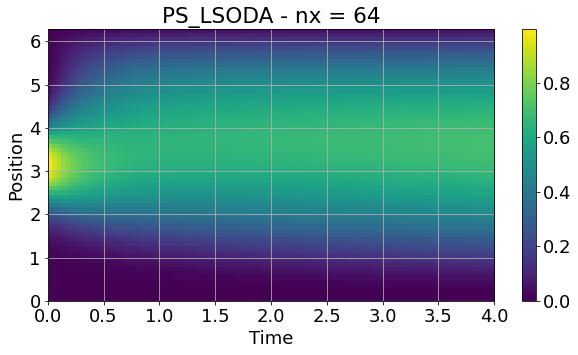

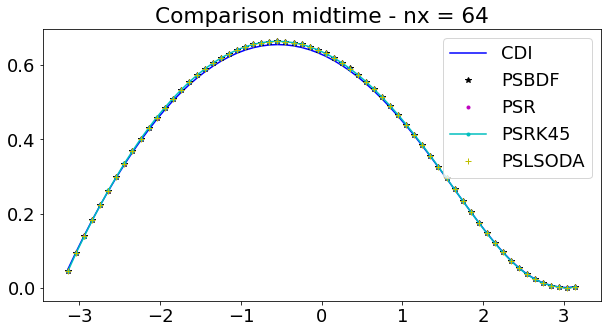

<Figure size 720x360 with 0 Axes>

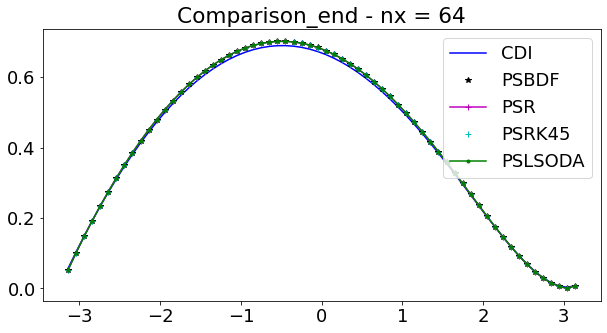

<Figure size 720x360 with 0 Axes>

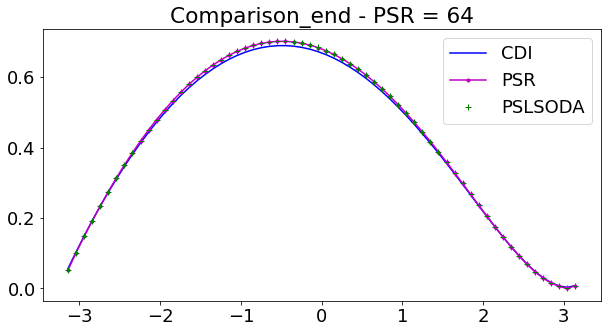

<Figure size 720x360 with 0 Axes>

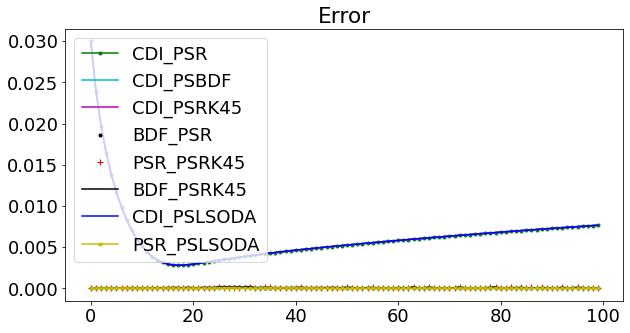

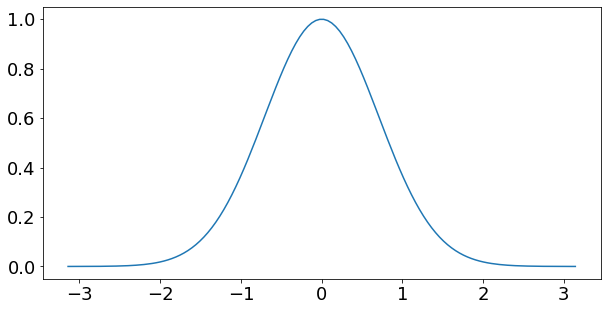

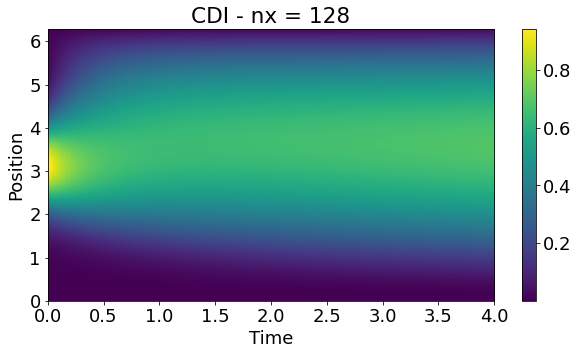

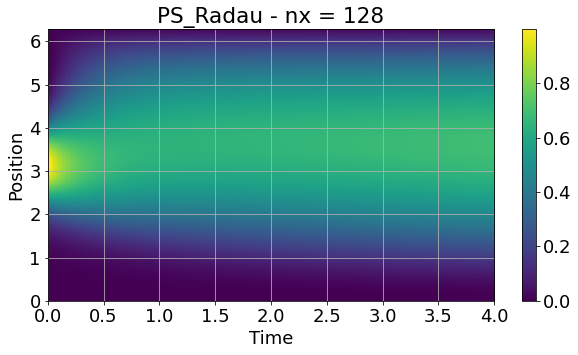

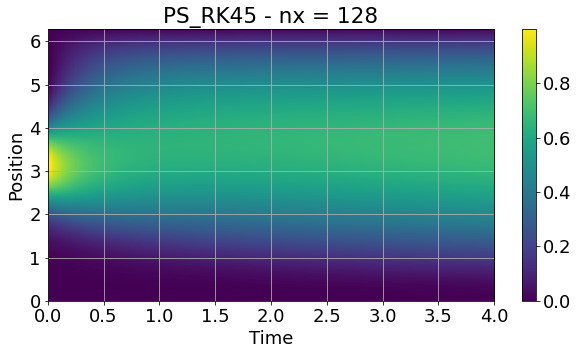

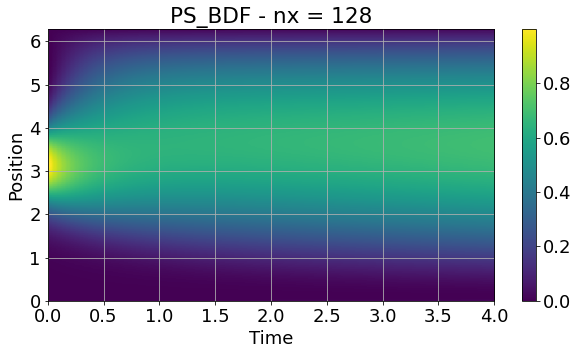

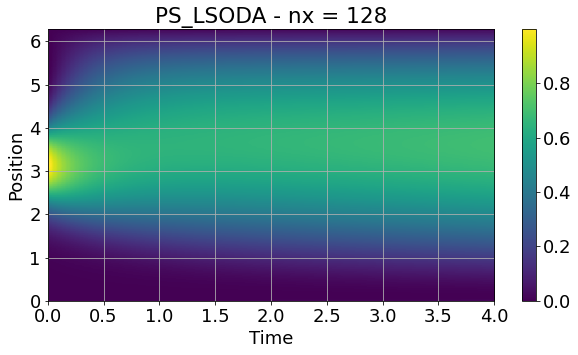

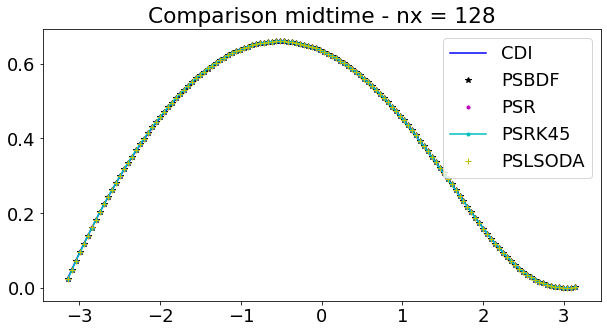

<Figure size 720x360 with 0 Axes>

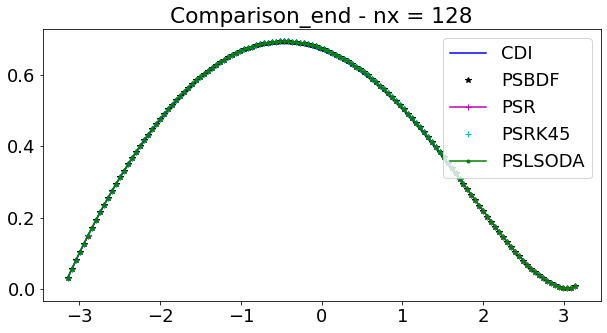

<Figure size 720x360 with 0 Axes>

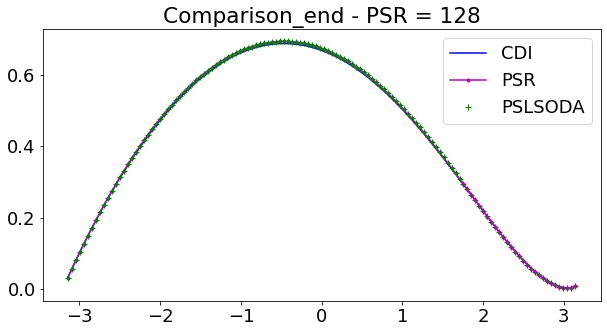

<Figure size 720x360 with 0 Axes>

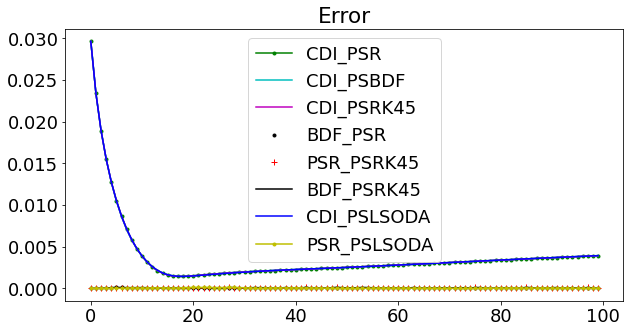

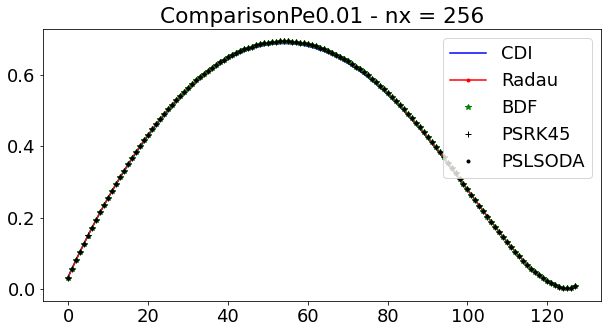

In [52]:
AL = 0.01
BL = 1.0
CL = 0.1
DL = 0.2
# Pe =0.1

th = np.linspace(0, np.pi, Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

res = testABCD_PS(a, b, c, d, Nx-1, nt)

th = np.linspace(0, np.pi, 2*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)



testABCD_PS(a, b, c, d, 2*Nx-1, nt)

th = np.linspace(0, np.pi, 4*Nx)
a = AL+AL*np.sin(th)
b = BL+BL*np.cos(th)
c = -CL+CL*np.sin(th); 
d = DL+DL*np.cos(th)

res = testABCD_PS(a, b, c, d, 4*Nx-1, nt)

plt.figure();
plt.plot(res[0], '-', color='b', label = 'CDI'); 
plt.plot(res[1], '.-', color = 'r', label = 'Radau');
plt.plot(res[2], '*', color = 'g', label = 'BDF');
plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
plt.legend(loc="upper right")
title = "ComparisonPe0.01 - nx = "+str(255+1)
plt.title(title)
plt.show()
plt.close()

## Performing MMS for the same

# Adding MMS code with nx -> 20, 40, 80, 160, 240
    For equation with IC and BCs:
	
	
$$ \frac {\partial U}{\partial t} = a\frac {\partial U}{\partial x} + b\frac {\partial^2 U}{\partial x^2}  + c U + d$$
$$ IC: U(x, 0) = C_o \cos(2 \pi x) $$
$$ BC - U(0, t) = U(0, t) = C_o \exp^{-t}$$
$$ BC - \frac {\partial U(0, t)}{\partial x}  = \frac {\partial U(1, t)}{\partial x} = 0$$ 






Notes on MMS: 
    * Values should be within the domain of the code: TAU or here u/C lies in the range of 0-5 (0-1 for $$ Pe~1 $$) 
    In this case, note that whatever manufactured solution is picked must be continuously differentiable through its second spatial derivative and first temporal derivative. In addition, for illustrative purposes, the manufactured solution is chosen so that time will appear in the boundary conditions. Something of this nature can be used as well: 
    T(x, t) = Tg0+Tgxcos(ATgxπx)+Tgtcos(ATgtπt)+Tgtxcos(ATgtxπtx)
    The chosen equation is: 
	
	

$$ The \ manufactured \ solution \ for \ MMS \ are: $$ 


$$ U(x,t) = C_o \cos(2\pi x) e^{-t}$$


Implementing that in the equation for the derivative terms are:

$$ \frac {dU}{dt} = -C_o\cos(2\pi x) e^{-t}$$
$$ \frac {dU}{dx} = -2C_o\pi \sin(2\pi x) e^{-t}$$
$$ \frac {d^2U}{dx^2} = -4C_o\pi^2 \cos(2\pi x) e^{-t}$$


The initial and boundary condition terms:
Here we have Periodic Boundary Conditions

$$ U(x, 0) = C_o\cos(2\pi x)$$
$$ U(0, t) = U(1, t) = C_oe^{-t}$$

$$ \frac {dU}{dx} (1, t) = \frac {dU}{dx} (0, t) = -2C_o\sin(2\pi 1) e^{-t} = 0$$ 


The new source term will be:

$$ d = \frac {dU}{dt} - a*\frac {dU}{dx}  - b*\frac {d^2U}{dx^2} - cU - d_o$$ 
$$ d =  -C_o e^{-t}((\cos(2\pi x) - 2*a*\pi \sin(2\pi x) - 4*b*\pi^2 \cos(2\pi x)) - c) - d_o $$


Notes on MMS for transient flows
As a first step, to examine temporal order, spatial discretization must be held constant (fixed grid); then, to examine spatial order, temporal discretization must be held constant (fixed time step). Holding either discretization at a constant level introduces a fixed error that applies to all calculations in that group.  
The error in such cases is of the form: 


$$ DE = DE_temporal + DE_spatial $$

For transient, keeping one of the errors constant, the other can be examined. However, the error we get is sum of constant term, k, with the error, let's say spatial. Hence, to get the the order, the observed order $ \hat{p} $ must be calculated to remove the constant term with three levels instead of the two required for steady flows as:


$$ \hat{p} = \frac {\ln( \frac{||DE_{l+2}|| - ||DE_{l+1}||}{||DE_{l+1}|| - ||DE_l||})}{\ln (r)} $$


<table ><tr><th >nx <th><th> nt <th><th>
<tr><td> 25 <td><td> 1000 <td><tr>
    <tr><td> 50 <td><td> 1000 <td><tr>
        <tr><td> 100 <td><td> 1000 <td><tr>
            <tr><td> 200 <td><td> 1000 <td><tr>
                <tr><td> 400 <td><td> 1000 <td><td>
                    <tr><td> 100 <td><td> 250 <td><tr>
                <tr><td> 100 <td><td> 500 <td><td><tr><td> 100 <td><td> 2000<td><tr><tr><td> 100 <td><td> 4000 <td><td><table>
				
				




                    
                    
                    
                    
                    
                    



                    
$$ d =  -C_o e^{-t}((\cos(2\pi x) - 2*a*\pi \sin(2\pi x) - 4*b*\pi^2 \cos(2\pi x)) + c) - d_o $$


## For the equation with zero and first order decay terms: 
Other details remain same, only d will change as shown below:




In [ ]:
def numericalcodes_periodic(nx, nt):
    AL = 0.01
    BL = 1.0
    CL = 0.1
    DL = 0.2
    # Pe =0.1
    Co = 
    th = np.linspace(0, np.pi, Nx)
    a = AL+AL*np.sin(th)
    b = BL+BL*np.cos(th)
    c = -CL+CL*np.sin(th); 
    d = DL+DL*np.cos(th)
    D = 
    res = testABCD_PS(Co, a, b, c, d,D, Nx-1, nt)
    U_exact = 
    U_CDI = res[0]
    U_Radau = res[1]
    U_BDF = res[2]
    U_PSRK45 = res[3]
    U_PSLSODA = res[4]
    
    
    plt.figure();
    plt.plot(res[0], '-', color='b', label = 'CDI'); 
    plt.plot(res[1], '.-', color = 'r', label = 'Radau');
    plt.plot(res[2], '*', color = 'g', label = 'BDF');
    plt.plot(res[3], '+', color = 'k', label = 'PSRK45');

    plt.plot(res[4], '.', color = 'k', label = 'PSLSODA');
    plt.legend(loc="upper right")
    title = "ComparisonPe0.01 - nx = "+str(255+1)
    plt.title(title)
    plt.show()
    plt.close()
    
    

In [ ]:
# For ordered grid increases with variable coefficients with x and t
# Equation with first order decay term 

# Spatial MMS tests
errorsx = np.ones((10, 7))
errornorms = np.ones(7)
nx = 20;
nt = 1000;
#nxs = np.linspace(20, 400, 10)

nxs = [5, 10, 20, 40, 80, 160, 320, 640, 1280, 2560]
nts = [250, 500, 1000, 2000, 4000]
for i in range(10):
    nx = nxs[i]
    errornorms = numericalcodes_periodic(int(nx)+1, nt+1)
    errorsx[i, 0] = errornorms[0]
    errorsx[i, 1] = errornorms[1]
    errorsx[i, 2] = errornorms[2]
    errorsx[i, 3] = errornorms[3]
    errorsx[i, 4] = errornorms[4]
    errorsx[i, 5] = errornorms[5]
    errorsx[i, 6] = errornorms[6]
    
plt.figure()
fig.set_size_inches(10.,7.)
plt.plot(nxs, errorsx[:, 0], '-', label = 'CDI')
plt.plot(nxs, errorsx[:, 1], '.-', label = 'CDCN')
plt.plot(nxs, errorsx[:, 2], '-+', label = 'QI')
plt.plot(nxs, errorsx[:, 3], '-*', label = 'QCN')
plt.plot(nxs, errorsx[:, 4], '-x', label = 'eCDI')
plt.plot(nxs, errorsx[:, 5], '--', label = 'eCDCN')
plt.plot(nxs, errorsx[:, 6], '-v', label = 'eQI')
plt.xlabel('Grid Numbers')
plt.ylabel('Error Norms')
plt.legend()

plt.figure()
fig.set_size_inches(10.,7.)
px = np.zeros((8, 7))
for g in range(8):
    for k in range(7):
        px[g, k] = np.log((np.abs(errorsx[g+2, k]) - np.abs(errorsx[g+1, k]))/(np.abs(errorsx[g+1, k]) - np.abs(errorsx[g, k])))/(np.log(nxs[g]/nxs[g+1]))

plt.plot(nxs[0:8], px[:, 0], '-', label = 'CDI')
plt.plot(nxs[0:8], px[:, 1], '-.', label = 'CDCN')
plt.plot(nxs[0:8], px[:, 2], '-+', label = 'QI')
plt.plot(nxs[0:8], px[:, 3], '-*', label = 'QCN')
plt.plot(nxs[0:8], px[:, 4], '-x', label = 'eCDI')
plt.plot(nxs[0:8], px[:, 5], '--', label = 'eCDCN')
plt.plot(nxs[0:8], px[:, 6], '-v', label = 'eQI')
plt.xlabel('Spatial Grid Numbers')
plt.ylabel('Observed Order')
plt.legend()

# Printing the spatial grid tests

zipped1 = list(zip(nxs, errorsx[:, 0], errorsx[:, 1], errorsx[:, 2], errorsx[:, 3], errorsx[:, 4], errorsx[:, 5], errorsx[:, 6], px[:, 0], px[:, 1], px[:, 2], px[:, 3], px[:, 4], px[:, 5], px[:, 6]))
df2 = pd.DataFrame(zipped1, columns=['Spatial Discretization Numbers', 'CDI_Error', 'CDCN_Error', 'QI_Error', 'QCN_Error', 'eCDI_Error', 'eCDCN_Error', 'eQI_Error', 'CDI_Order', 'CDCN_Order', 'QI_Order', 'QCN_Order', 'eCDI_Order', 'eCDCN_Order', 'eQI_Order'])

df2.to_csv('Analysis_Spatial25_Variable_Ordered.csv', index=False)
